# Sentiment Classification & How To "Frame Problems" for a Neural Network

by Andrew Trask

- **Twitter**: @iamtrask
- **Blog**: http://iamtrask.github.io

### What You Should Already Know

- neural networks, forward and back-propagation
- stochastic gradient descent
- mean squared error
- and train/test splits

### Where to Get Help if You Need it
- Re-watch previous Udacity Lectures
- Leverage the recommended Course Reading Material - [Grokking Deep Learning](https://www.manning.com/books/grokking-deep-learning) (Check inside your classroom for a discount code)
- Shoot me a tweet @iamtrask


### Tutorial Outline:

- Intro: The Importance of "Framing a Problem" (this lesson)

- [Curate a Dataset](#lesson_1)
- [Developing a "Predictive Theory"](#lesson_2)
- [**PROJECT 1**: Quick Theory Validation](#project_1)


- [Transforming Text to Numbers](#lesson_3)
- [**PROJECT 2**: Creating the Input/Output Data](#project_2)


- Putting it all together in a Neural Network (video only - nothing in notebook)
- [**PROJECT 3**: Building our Neural Network](#project_3)


- [Understanding Neural Noise](#lesson_4)
- [**PROJECT 4**: Making Learning Faster by Reducing Noise](#project_4)


- [Analyzing Inefficiencies in our Network](#lesson_5)
- [**PROJECT 5**: Making our Network Train and Run Faster](#project_5)


- [Further Noise Reduction](#lesson_6)
- [**PROJECT 6**: Reducing Noise by Strategically Reducing the Vocabulary](#project_6)


- [Analysis: What's going on in the weights?](#lesson_7)

# Lesson: Curate a Dataset<a id='lesson_1'></a>
The cells from here until Project 1 include code Andrew shows in the videos leading up to mini project 1. We've included them so you can run the code along with the videos without having to type in everything.

In [1]:
def pretty_print_review_and_label(i):
    print(labels[i] + "\t:\t" + reviews[i][:80] + "...")

g = open('reviews.txt','r') # What we know!
reviews = list(map(lambda x:x[:-1],g.readlines()))
g.close()

g = open('labels.txt','r') # What we WANT to know!
labels = list(map(lambda x:x[:-1].upper(),g.readlines()))
g.close()

**Note:** The data in `reviews.txt` we're using has already been preprocessed a bit and contains only lower case characters. If we were working from raw data, where we didn't know it was all lower case, we would want to add a step here to convert it. That's so we treat different variations of the same word, like `The`, `the`, and `THE`, all the same way.

In [2]:
len(reviews)

25000

In [3]:
reviews[0]

'bromwell high is a cartoon comedy . it ran at the same time as some other programs about school life  such as  teachers  . my   years in the teaching profession lead me to believe that bromwell high  s satire is much closer to reality than is  teachers  . the scramble to survive financially  the insightful students who can see right through their pathetic teachers  pomp  the pettiness of the whole situation  all remind me of the schools i knew and their students . when i saw the episode in which a student repeatedly tried to burn down the school  i immediately recalled . . . . . . . . . at . . . . . . . . . . high . a classic line inspector i  m here to sack one of your teachers . student welcome to bromwell high . i expect that many adults of my age think that bromwell high is far fetched . what a pity that it isn  t   '

In [4]:
labels[0]

'POSITIVE'

# Lesson: Develop a Predictive Theory<a id='lesson_2'></a>

In [5]:
print("labels.txt \t : \t reviews.txt\n")
pretty_print_review_and_label(2137)
pretty_print_review_and_label(12816)
pretty_print_review_and_label(6267)
pretty_print_review_and_label(21934)
pretty_print_review_and_label(5297)
pretty_print_review_and_label(4998)

labels.txt 	 : 	 reviews.txt

NEGATIVE	:	this movie is terrible but it has some good effects .  ...
POSITIVE	:	adrian pasdar is excellent is this film . he makes a fascinating woman .  ...
NEGATIVE	:	comment this movie is impossible . is terrible  very improbable  bad interpretat...
POSITIVE	:	excellent episode movie ala pulp fiction .  days   suicides . it doesnt get more...
NEGATIVE	:	if you haven  t seen this  it  s terrible . it is pure trash . i saw this about ...
POSITIVE	:	this schiffer guy is a real genius  the movie is of excellent quality and both e...


# Project 1: Quick Theory Validation<a id='project_1'></a>

There are multiple ways to implement these projects, but in order to get your code closer to what Andrew shows in his solutions, we've provided some hints and starter code throughout this notebook.

You'll find the [Counter](https://docs.python.org/2/library/collections.html#collections.Counter) class to be useful in this exercise, as well as the [numpy](https://docs.scipy.org/doc/numpy/reference/) library.

In [6]:
from collections import Counter
import numpy as np

We'll create three `Counter` objects, one for words from postive reviews, one for words from negative reviews, and one for all the words.

In [7]:
# Create three Counter objects to store positive, negative and total counts
positive_counts = Counter()
negative_counts = Counter()
total_counts = Counter()

**TODO:** Examine all the reviews. For each word in a positive review, increase the count for that word in both your positive counter and the total words counter; likewise, for each word in a negative review, increase the count for that word in both your negative counter and the total words counter.

**Note:** Throughout these projects, you should use `split(' ')` to divide a piece of text (such as a review) into individual words. If you use `split()` instead, you'll get slightly different results than what the videos and solutions show.

In [8]:
# TODO: Loop over all the words in all the reviews and increment the counts in the appropriate counter objects
for idx, r in enumerate(reviews):
    for w in r.split(" "):
        if labels[idx] == "POSITIVE":
            positive_counts[w]+=1
            total_counts[w]+=1
        elif labels[idx] == "NEGATIVE":
            negative_counts[w]+=1
            total_counts[w]+=1

Run the following two cells to list the words used in positive reviews and negative reviews, respectively, ordered from most to least commonly used. 

In [9]:
# Examine the counts of the most common words in positive reviews
positive_counts.most_common()

[('', 550468),
 ('the', 173324),
 ('.', 159654),
 ('and', 89722),
 ('a', 83688),
 ('of', 76855),
 ('to', 66746),
 ('is', 57245),
 ('in', 50215),
 ('br', 49235),
 ('it', 48025),
 ('i', 40743),
 ('that', 35630),
 ('this', 35080),
 ('s', 33815),
 ('as', 26308),
 ('with', 23247),
 ('for', 22416),
 ('was', 21917),
 ('film', 20937),
 ('but', 20822),
 ('movie', 19074),
 ('his', 17227),
 ('on', 17008),
 ('you', 16681),
 ('he', 16282),
 ('are', 14807),
 ('not', 14272),
 ('t', 13720),
 ('one', 13655),
 ('have', 12587),
 ('be', 12416),
 ('by', 11997),
 ('all', 11942),
 ('who', 11464),
 ('an', 11294),
 ('at', 11234),
 ('from', 10767),
 ('her', 10474),
 ('they', 9895),
 ('has', 9186),
 ('so', 9154),
 ('like', 9038),
 ('about', 8313),
 ('very', 8305),
 ('out', 8134),
 ('there', 8057),
 ('she', 7779),
 ('what', 7737),
 ('or', 7732),
 ('good', 7720),
 ('more', 7521),
 ('when', 7456),
 ('some', 7441),
 ('if', 7285),
 ('just', 7152),
 ('can', 7001),
 ('story', 6780),
 ('time', 6515),
 ('my', 6488),
 ('g

In [10]:
# Examine the counts of the most common words in negative reviews
negative_counts.most_common()

[('', 561462),
 ('.', 167538),
 ('the', 163389),
 ('a', 79321),
 ('and', 74385),
 ('of', 69009),
 ('to', 68974),
 ('br', 52637),
 ('is', 50083),
 ('it', 48327),
 ('i', 46880),
 ('in', 43753),
 ('this', 40920),
 ('that', 37615),
 ('s', 31546),
 ('was', 26291),
 ('movie', 24965),
 ('for', 21927),
 ('but', 21781),
 ('with', 20878),
 ('as', 20625),
 ('t', 20361),
 ('film', 19218),
 ('you', 17549),
 ('on', 17192),
 ('not', 16354),
 ('have', 15144),
 ('are', 14623),
 ('be', 14541),
 ('he', 13856),
 ('one', 13134),
 ('they', 13011),
 ('at', 12279),
 ('his', 12147),
 ('all', 12036),
 ('so', 11463),
 ('like', 11238),
 ('there', 10775),
 ('just', 10619),
 ('by', 10549),
 ('or', 10272),
 ('an', 10266),
 ('who', 9969),
 ('from', 9731),
 ('if', 9518),
 ('about', 9061),
 ('out', 8979),
 ('what', 8422),
 ('some', 8306),
 ('no', 8143),
 ('her', 7947),
 ('even', 7687),
 ('can', 7653),
 ('has', 7604),
 ('good', 7423),
 ('bad', 7401),
 ('would', 7036),
 ('up', 6970),
 ('only', 6781),
 ('more', 6730),
 ('

As you can see, common words like "the" appear very often in both positive and negative reviews. Instead of finding the most common words in positive or negative reviews, what you really want are the words found in positive reviews more often than in negative reviews, and vice versa. To accomplish this, you'll need to calculate the **ratios** of word usage between positive and negative reviews.

**TODO:** Check all the words you've seen and calculate the ratio of postive to negative uses and store that ratio in `pos_neg_ratios`. 
>Hint: the positive-to-negative ratio for a given word can be calculated with `positive_counts[word] / float(negative_counts[word]+1)`. Notice the `+1` in the denominator – that ensures we don't divide by zero for words that are only seen in positive reviews.

In [11]:
# Create Counter object to store positive/negative ratios
pos_neg_ratios = Counter()

# TODO: Calculate the ratios of positive and negative uses of the most common words
#       Consider words to be "common" if they've been used at least 100 times
for word in total_counts:
    pos_neg_ratios[word] = positive_counts[word]/float(negative_counts[word]+1)

Examine the ratios you've calculated for a few words:

In [12]:
print("Pos-to-neg ratio for 'the' = {}".format(pos_neg_ratios["the"]))
print("Pos-to-neg ratio for 'amazing' = {}".format(pos_neg_ratios["amazing"]))
print("Pos-to-neg ratio for 'terrible' = {}".format(pos_neg_ratios["terrible"]))

Pos-to-neg ratio for 'the' = 1.0607993145235326
Pos-to-neg ratio for 'amazing' = 4.022813688212928
Pos-to-neg ratio for 'terrible' = 0.17744252873563218


Looking closely at the values you just calculated, we see the following:

* Words that you would expect to see more often in positive reviews – like "amazing" – have a ratio greater than 1. The more skewed a word is toward postive, the farther from 1 its positive-to-negative ratio  will be.
* Words that you would expect to see more often in negative reviews – like "terrible" – have positive values that are less than 1. The more skewed a word is toward negative, the closer to zero its positive-to-negative ratio will be.
* Neutral words, which don't really convey any sentiment because you would expect to see them in all sorts of reviews – like "the" – have values very close to 1. A perfectly neutral word – one that was used in exactly the same number of positive reviews as negative reviews – would be almost exactly 1. The `+1` we suggested you add to the denominator slightly biases words toward negative, but it won't matter because it will be a tiny bias and later we'll be ignoring words that are too close to neutral anyway.

Ok, the ratios tell us which words are used more often in postive or negative reviews, but the specific values we've calculated are a bit difficult to work with. A very positive word like "amazing" has a value above 4, whereas a very negative word like "terrible" has a value around 0.18. Those values aren't easy to compare for a couple of reasons:

* Right now, 1 is considered neutral, but the absolute value of the postive-to-negative rations of very postive words is larger than the absolute value of the ratios for the very negative words. So there is no way to directly compare two numbers and see if one word conveys the same magnitude of positive sentiment as another word conveys negative sentiment. So we should center all the values around netural so the absolute value fro neutral of the postive-to-negative ratio for a word would indicate how much sentiment (positive or negative) that word conveys.
* When comparing absolute values it's easier to do that around zero than one. 

To fix these issues, we'll convert all of our ratios to new values using logarithms.

**TODO:** Go through all the ratios you calculated and convert them to logarithms. (i.e. use `np.log(ratio)`)

In the end, extremely positive and extremely negative words will have positive-to-negative ratios with similar magnitudes but opposite signs.

In [13]:
# TODO: Convert ratios to logs
for word in total_counts:
    pos_neg_ratios[word]=np.log(positive_counts[word]/float(negative_counts[word]+1))

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log
  This is separate from the ipykernel package so we can avoid doing imports until


Examine the new ratios you've calculated for the same words from before:

In [14]:
print("Pos-to-neg ratio for 'the' = {}".format(pos_neg_ratios["the"]))
print("Pos-to-neg ratio for 'amazing' = {}".format(pos_neg_ratios["amazing"]))
print("Pos-to-neg ratio for 'terrible' = {}".format(pos_neg_ratios["terrible"]))

Pos-to-neg ratio for 'the' = 0.05902269426102881
Pos-to-neg ratio for 'amazing' = 1.3919815802404802
Pos-to-neg ratio for 'terrible' = -1.7291085042663878


If everything worked, now you should see neutral words with values close to zero. In this case, "the" is near zero but slightly positive, so it was probably used in more positive reviews than negative reviews. But look at "amazing"'s ratio - it's above `1`, showing it is clearly a word with positive sentiment. And "terrible" has a similar score, but in the opposite direction, so it's below `-1`. It's now clear that both of these words are associated with specific, opposing sentiments.

Now run the following cells to see more ratios. 

The first cell displays all the words, ordered by how associated they are with postive reviews. (Your notebook will most likely truncate the output so you won't actually see *all* the words in the list.)

The second cell displays the 30 words most associated with negative reviews by reversing the order of the first list and then looking at the first 30 words. (If you want the second cell to display all the words, ordered by how associated they are with negative reviews, you could just write `reversed(pos_neg_ratios.most_common())`.)

You should continue to see values similar to the earlier ones we checked – neutral words will be close to `0`, words will get more positive as their ratios approach and go above `1`, and words will get more negative as their ratios approach and go below `-1`. That's why we decided to use the logs instead of the raw ratios.

In [15]:
# words most frequently seen in a review with a "POSITIVE" label
pos_neg_ratios.most_common()

[('edie', 4.6913478822291435),
 ('antwone', 4.4773368144782069),
 ('din', 4.4067192472642533),
 ('gunga', 4.1896547420264252),
 ('goldsworthy', 4.1743872698956368),
 ('gypo', 4.0943445622221004),
 ('yokai', 4.0943445622221004),
 ('paulie', 4.0775374439057197),
 ('visconti', 3.9318256327243257),
 ('flavia', 3.9318256327243257),
 ('blandings', 3.8712010109078911),
 ('kells', 3.8712010109078911),
 ('brashear', 3.8501476017100584),
 ('gino', 3.8286413964890951),
 ('deathtrap', 3.8066624897703196),
 ('harilal', 3.713572066704308),
 ('panahi', 3.713572066704308),
 ('ossessione', 3.6635616461296463),
 ('tsui', 3.6375861597263857),
 ('caruso', 3.6375861597263857),
 ('sabu', 3.6109179126442243),
 ('ahmad', 3.6109179126442243),
 ('khouri', 3.5835189384561099),
 ('dominick', 3.5835189384561099),
 ('aweigh', 3.5553480614894135),
 ('mj', 3.5553480614894135),
 ('mcintire', 3.5263605246161616),
 ('kriemhild', 3.5263605246161616),
 ('blackie', 3.4965075614664802),
 ('daisies', 3.4965075614664802),
 ('

In [16]:
# words most frequently seen in a review with a "NEGATIVE" label
list(reversed(pos_neg_ratios.most_common()))[0:30]

# Note: Above is the code Andrew uses in his solution video, 
#       so we've included it here to avoid confusion.
#       If you explore the documentation for the Counter class, 
#       you will see you could also find the 30 least common
#       words like this: pos_neg_ratios.most_common()[:-31:-1]

[('whelk', -inf),
 ('pressurized', -inf),
 ('bellwood', -inf),
 ('mwuhahahaa', -inf),
 ('insulation', -inf),
 ('hoodies', -inf),
 ('yaks', -inf),
 ('raksha', -inf),
 ('deamon', -inf),
 ('ziller', -inf),
 ('lagomorph', -inf),
 ('marinaro', -inf),
 ('accelerant', -inf),
 ('yez', -inf),
 ('superhu', -inf),
 ('fastidiously', -inf),
 ('spotlessly', -inf),
 ('dahlink', -inf),
 ('rebanished', -inf),
 ('unmated', -inf),
 ('wushu', -inf),
 ('yetis', -inf),
 ('nix', -inf),
 ('echance', -inf),
 ('vannet', -inf),
 ('hodet', -inf),
 ('francie', -inf),
 ('vivisects', -inf),
 ('degeneration', -inf),
 ('lowlight', -inf)]

# End of Project 1. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Transforming Text into Numbers<a id='lesson_3'></a>
The cells here include code Andrew shows in the next video. We've included it so you can run the code along with the video without having to type in everything.

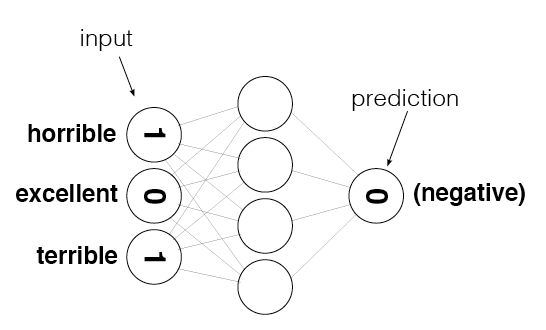

In [17]:
from IPython.display import Image

review = "This was a horrible, terrible movie."

Image(filename='sentiment_network.png')

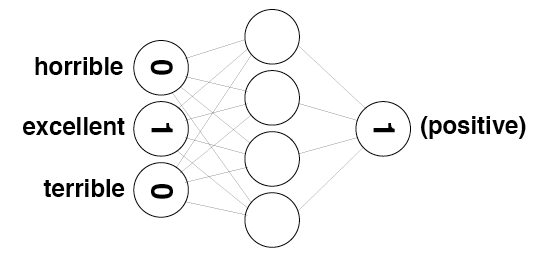

In [18]:
review = "The movie was excellent"

Image(filename='sentiment_network_pos.png')

# Project 2: Creating the Input/Output Data<a id='project_2'></a>

**TODO:** Create a [set](https://docs.python.org/3/tutorial/datastructures.html#sets) named `vocab` that contains every word in the vocabulary.

In [19]:
# TODO: Create set named "vocab" containing all of the words from all of the reviews
words=[]
for r in reviews:words.extend(r.split(" "))
vocab = set(words)

Run the following cell to check your vocabulary size. If everything worked correctly, it should print **74074**

In [20]:
vocab_size = len(vocab)
print(vocab_size)

74074


Take a look at the following image. It represents the layers of the neural network you'll be building throughout this notebook. `layer_0` is the input layer, `layer_1` is a hidden layer, and `layer_2` is the output layer.

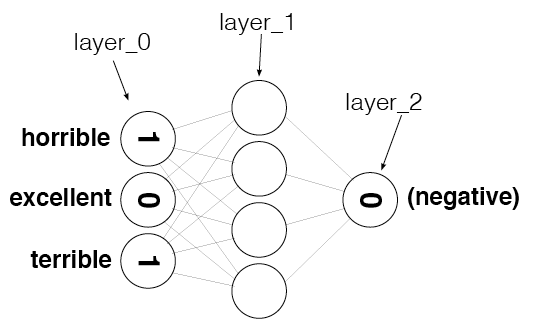

In [21]:
from IPython.display import Image
Image(filename='sentiment_network_2.png')

**TODO:** Create a numpy array called `layer_0` and initialize it to all zeros. You will find the [zeros](https://docs.scipy.org/doc/numpy/reference/generated/numpy.zeros.html) function particularly helpful here. Be sure you create `layer_0` as a 2-dimensional matrix with 1 row and `vocab_size` columns. 

In [22]:
# TODO: Create layer_0 matrix with dimensions 1 by vocab_size, initially filled with zeros
layer_0 = np.zeros((1,vocab_size))

Run the following cell. It should display `(1, 74074)`

In [23]:
layer_0.shape

(1, 74074)

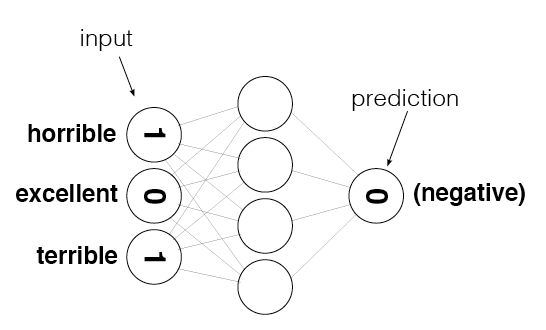

In [24]:
from IPython.display import Image
Image(filename='sentiment_network.png')

`layer_0` contains one entry for every word in the vocabulary, as shown in the above image. We need to make sure we know the index of each word, so run the following cell to create a lookup table that stores the index of every word.

In [25]:
# Create a dictionary of words in the vocabulary mapped to index positions
# (to be used in layer_0)
word2index = {}
for i,word in enumerate(vocab):
    word2index[word] = i
    
# display the map of words to indices
word2index

{'': 0,
 'abrahams': 1,
 'scren': 2,
 'superbabies': 3,
 'lesbos': 4,
 'henchpeople': 5,
 'karaindrou': 6,
 'motifs': 7,
 'cgi': 8,
 'bethune': 9,
 'hornophobia': 10,
 'exotica': 11,
 'mcnee': 12,
 'whistleblower': 13,
 'aldrin': 14,
 'humanness': 15,
 'meshes': 16,
 'lectures': 17,
 'replicate': 18,
 'clmenti': 19,
 'outnumbers': 20,
 'zerifferelli': 21,
 'frictions': 22,
 'waltz': 23,
 'troubling': 24,
 'carnet': 25,
 'reconciled': 26,
 'coquette': 27,
 'meetings': 28,
 'anya': 29,
 'skungy': 30,
 'totems': 31,
 'squabbles': 32,
 'piaf': 33,
 'consigliori': 34,
 'synonomous': 35,
 'klause': 36,
 'caldicott': 37,
 'romeros': 38,
 'sew': 39,
 'rize': 40,
 'luring': 41,
 'faraway': 42,
 'engine': 43,
 'sellam': 44,
 'extremists': 45,
 'morris': 46,
 'jory': 47,
 'harnessed': 48,
 'irland': 49,
 'recognise': 50,
 'scribbles': 51,
 'sinisterness': 52,
 'organized': 53,
 'kenny': 54,
 'yumiko': 55,
 'elisir': 56,
 'perceives': 57,
 'jz': 58,
 'faithfulness': 59,
 'reshmmiya': 60,
 'corto':

**TODO:**  Complete the implementation of `update_input_layer`. It should count 
          how many times each word is used in the given review, and then store
          those counts at the appropriate indices inside `layer_0`.

In [26]:
def update_input_layer(review):
    """ Modify the global layer_0 to represent the vector form of review.
    The element at a given index of layer_0 should represent
    how many times the given word occurs in the review.
    Args:
        review(string) - the string of the review
    Returns:
        None
    """
    global layer_0
    # clear out previous state by resetting the layer to be all 0s
    layer_0 *= 0
    
    # TODO: count how many times each word is used in the given review and store the results in layer_0 
    for idx,word in enumerate(vocab):
            temp = review.split(" ")
            print(idx, word, temp.count(word))
            layer_0[0][idx] = temp.count(word)

Run the following cell to test updating the input layer with the first review. The indices assigned may not be the same as in the solution, but hopefully you'll see some non-zero values in `layer_0`.  

In [27]:
print(reviews[0])
update_input_layer(reviews[0])
print(layer_0)
layer_0.shape

bromwell high is a cartoon comedy . it ran at the same time as some other programs about school life  such as  teachers  . my   years in the teaching profession lead me to believe that bromwell high  s satire is much closer to reality than is  teachers  . the scramble to survive financially  the insightful students who can see right through their pathetic teachers  pomp  the pettiness of the whole situation  all remind me of the schools i knew and their students . when i saw the episode in which a student repeatedly tried to burn down the school  i immediately recalled . . . . . . . . . at . . . . . . . . . . high . a classic line inspector i  m here to sack one of your teachers . student welcome to bromwell high . i expect that many adults of my age think that bromwell high is far fetched . what a pity that it isn  t   
0  18
1 abrahams 0
2 scren 0
3 superbabies 0
4 lesbos 0
5 henchpeople 0
6 karaindrou 0
7 motifs 0
8 cgi 0
9 bethune 0
10 hornophobia 0
11 exotica 0
12 mcnee 0
13 whist

1087 jaku 0
1088 pruned 0
1089 grueling 0
1090 linklater 0
1091 formulative 0
1092 marinescus 0
1093 gunga 0
1094 thuggies 0
1095 mobiles 0
1096 immitating 0
1097 compositely 0
1098 roads 0
1099 cuteness 0
1100 bucking 0
1101 petrochemical 0
1102 afoot 0
1103 gleeful 0
1104 pitcher 0
1105 chancery 0
1106 unthoughtful 0
1107 amelie 0
1108 samira 0
1109 levie 0
1110 doru 0
1111 mensonges 0
1112 dysfuntional 0
1113 blight 0
1114 guccini 0
1115 commercialized 0
1116 tibbett 0
1117 fifteenth 0
1118 untrammelled 0
1119 selfish 0
1120 grab 0
1121 leonine 0
1122 rehearsals 0
1123 ctrlv 0
1124 dahlia 0
1125 prte 0
1126 purse 0
1127 principal 0
1128 ammmmm 0
1129 manikin 0
1130 matondkar 0
1131 redlight 0
1132 turquistan 0
1133 mungo 0
1134 notions 0
1135 misguided 0
1136 persistent 0
1137 classism 0
1138 sorcha 0
1139 thematic 0
1140 bargearse 0
1141 barmitzvah 0
1142 dribbled 0
1143 razdan 0
1144 maneuver 0
1145 converible 0
1146 haine 0
1147 necroborgs 0
1148 abo 0
1149 signifies 0
1150 agree

2378 grido 0
2379 halley 0
2380 somnambulant 0
2381 shihito 0
2382 motorway 0
2383 dammes 0
2384 babbling 0
2385 ninos 0
2386 opium 0
2387 gentlemenin 0
2388 niro 0
2389 knighthood 0
2390 mystique 0
2391 spasmo 0
2392 scaryt 0
2393 cleo 0
2394 midpoint 0
2395 marauders 0
2396 lenders 0
2397 carradine 0
2398 aria 0
2399 airing 0
2400 bip 0
2401 windingly 0
2402 homicides 0
2403 persiflage 0
2404 befell 0
2405 brownlow 0
2406 ijoachim 0
2407 operatora 0
2408 another 0
2409 sharaff 0
2410 housekeeping 0
2411 leona 0
2412 huttner 0
2413 eroticized 0
2414 kerim 0
2415 hazard 0
2416 woohoo 0
2417 inserts 0
2418 lander 0
2419 nj 0
2420 puked 0
2421 snoodle 0
2422 anyday 0
2423 corneau 0
2424 riead 0
2425 grills 0
2426 behavior 0
2427 troupe 0
2428 scriptwriters 0
2429 zulu 0
2430 possessed 0
2431 burst 0
2432 potepolov 0
2433 thus 0
2434 bak 0
2435 helmsman 0
2436 crank 0
2437 desiging 0
2438 oceanfront 0
2439 janina 0
2440 boroughs 0
2441 funking 0
2442 manipulates 0
2443 downsizing 0
2444 m

3310 lamy 0
3311 kawajiri 0
3312 quinlan 0
3313 compulsory 0
3314 gradations 0
3315 imo 0
3316 wooly 0
3317 dis 0
3318 cesspit 0
3319 eggbeater 0
3320 fedele 0
3321 connect 0
3322 crematorium 0
3323 insistent 0
3324 mchael 0
3325 tous 0
3326 newbern 0
3327 beattie 0
3328 fidgeting 0
3329 footed 0
3330 massude 0
3331 mullholland 0
3332 plymouth 0
3333 aerodynamics 0
3334 morely 0
3335 christy 0
3336 broadens 0
3337 hammill 0
3338 pupart 0
3339 turvy 0
3340 instinctivly 0
3341 sexlet 0
3342 residuals 0
3343 grits 0
3344 mammaries 0
3345 hacking 0
3346 californian 0
3347 pavelic 0
3348 bullcrap 0
3349 wiseness 0
3350 bristle 0
3351 conclusive 0
3352 unfavourably 0
3353 channels 0
3354 barging 0
3355 cities 0
3356 simplifying 0
3357 magneto 0
3358 inadvertently 0
3359 nil 0
3360 popeil 0
3361 specialised 0
3362 welling 0
3363 hawked 0
3364 larroquette 0
3365 berghe 0
3366 estimations 0
3367 gurl 0
3368 dovetails 0
3369 pioneer 0
3370 mutually 0
3371 humanisation 0
3372 arigatou 0
3373 frai

4281 deadringer 0
4282 runway 0
4283 marquette 0
4284 vertido 0
4285 rho 0
4286 eglimata 0
4287 molla 0
4288 improvisatory 0
4289 lackies 0
4290 features 0
4291 boringness 0
4292 stayer 0
4293 hermine 0
4294 novodny 0
4295 loaf 0
4296 screening 0
4297 arrgh 0
4298 rowlf 0
4299 missions 0
4300 metro 0
4301 remick 0
4302 halopes 0
4303 wayside 0
4304 delbert 0
4305 opened 0
4306 implement 0
4307 vanishes 0
4308 nihilists 0
4309 farts 0
4310 beens 0
4311 wfst 0
4312 secrety 0
4313 prejudicial 0
4314 nuns 0
4315 elene 0
4316 striked 0
4317 creepiest 0
4318 disjointed 0
4319 overington 0
4320 stuggles 0
4321 fanny 0
4322 airborne 0
4323 bogarts 0
4324 amend 0
4325 rosses 0
4326 titty 0
4327 teodoro 0
4328 slither 0
4329 resell 0
4330 richest 0
4331 gravest 0
4332 benning 0
4333 hotmail 0
4334 allurement 0
4335 sheena 0
4336 blasting 0
4337 amiable 0
4338 consistence 0
4339 shikhar 0
4340 rolle 0
4341 comer 0
4342 tro 0
4343 metropolis 0
4344 musculature 0
4345 saitn 0
4346 yoko 0
4347 quive

5276 talespeter 0
5277 walked 0
5278 cowardly 0
5279 guileless 0
5280 kane 0
5281 hilt 0
5282 anachronistic 0
5283 claudie 0
5284 keying 0
5285 receieved 0
5286 keitel 0
5287 amendment 0
5288 unprovocked 0
5289 lektor 0
5290 saldy 0
5291 infect 0
5292 railbird 0
5293 shrunk 0
5294 effigy 0
5295 patil 0
5296 displease 0
5297 tucci 0
5298 neenan 0
5299 sighed 0
5300 deterent 0
5301 fascinate 0
5302 meshugaas 0
5303 feore 0
5304 palavras 0
5305 compose 0
5306 ain 0
5307 mash 0
5308 steelcrafts 0
5309 queue 0
5310 reminders 0
5311 fantastical 0
5312 observing 0
5313 unresponsive 0
5314 zam 0
5315 kitchener 0
5316 marseilles 0
5317 presaged 0
5318 bravura 0
5319 schnass 0
5320 slant 0
5321 surrendering 0
5322 tapeheads 0
5323 overkill 0
5324 glazen 0
5325 greico 0
5326 kneeling 0
5327 apocalyptic 0
5328 hujan 0
5329 hits 0
5330 hopa 0
5331 mouthful 0
5332 zuniga 0
5333 readjust 0
5334 dickerson 0
5335 resented 0
5336 profitable 0
5337 kovacs 0
5338 roundelay 0
5339 undercard 0
5340 merlik 0

6262 creed 0
6263 avenet 0
6264 belleau 0
6265 enroll 0
6266 blizzard 0
6267 designer 0
6268 bhangra 0
6269 mikal 0
6270 cogitate 0
6271 cranking 0
6272 tossers 0
6273 formula 0
6274 armateur 0
6275 grindhouse 0
6276 inseglet 0
6277 dollman 0
6278 gein 0
6279 vegetation 0
6280 appears 0
6281 craptacular 0
6282 delicately 0
6283 whitty 0
6284 mcallister 0
6285 sequitirs 0
6286 droll 0
6287 conflict 0
6288 stuffing 0
6289 melvis 0
6290 luftwaffe 0
6291 corruption 0
6292 bullfight 0
6293 flacks 0
6294 scandi 0
6295 condomine 0
6296 choise 0
6297 dazzy 0
6298 clans 0
6299 entry 0
6300 scala 0
6301 renounced 0
6302 chatter 0
6303 margineanus 0
6304 verger 0
6305 altering 0
6306 corrina 0
6307 sympathized 0
6308 catchword 0
6309 laconic 0
6310 mcnab 0
6311 induces 0
6312 sated 0
6313 intruder 0
6314 sheppard 0
6315 yau 0
6316 deniers 0
6317 blomkamp 0
6318 terminator 0
6319 quigley 0
6320 donoghue 0
6321 houck 0
6322 aids 0
6323 cater 0
6324 ingratiate 0
6325 note 0
6326 brecht 0
6327 icare 

7103 sren 0
7104 gritting 0
7105 staffed 0
7106 embellishes 0
7107 thumbes 0
7108 samara 0
7109 bhatt 0
7110 cayman 0
7111 prostitute 0
7112 simn 0
7113 ungureanu 0
7114 ambiguities 0
7115 said 0
7116 heavier 0
7117 pele 0
7118 whoa 0
7119 imperfectionist 0
7120 behr 0
7121 vaporize 0
7122 illuminate 0
7123 finletter 0
7124 gadget 0
7125 penpusher 0
7126 cognizant 0
7127 caudillos 0
7128 monitor 0
7129 bless 0
7130 hoot 0
7131 archie 0
7132 jocks 0
7133 motto 0
7134 actuality 0
7135 feigned 0
7136 validated 0
7137 naish 0
7138 perusing 0
7139 chute 0
7140 imbd 0
7141 wallaces 0
7142 ghetto 0
7143 title 0
7144 tastelessly 0
7145 keel 0
7146 blatantly 0
7147 storia 0
7148 hara 0
7149 clinches 0
7150 sanctimonious 0
7151 trespassing 0
7152 undefinable 0
7153 entre 0
7154 electrolysis 0
7155 tapioca 0
7156 stainless 0
7157 truck 0
7158 fill 0
7159 televison 0
7160 ferocious 0
7161 populate 0
7162 checks 0
7163 luis 0
7164 bertanzoni 0
7165 mpkdh 0
7166 challnges 0
7167 dailys 0
7168 few 0


8095 maniac 0
8096 mine 0
8097 grated 0
8098 teamings 0
8099 scholarly 0
8100 announcer 0
8101 plateau 0
8102 ariana 0
8103 waddell 0
8104 tennyson 0
8105 packaged 0
8106 keefe 0
8107 contemptuous 0
8108 dumbly 0
8109 veeringly 0
8110 bremner 0
8111 fooling 0
8112 haaaaaaaa 0
8113 moronfest 0
8114 stanze 0
8115 slideshow 0
8116 huac 0
8117 nerdier 0
8118 guilherme 0
8119 bonham 0
8120 tastey 0
8121 gert 0
8122 mammy 0
8123 iveness 0
8124 tension 0
8125 leaflets 0
8126 msb 0
8127 leva 0
8128 deon 0
8129 expectable 0
8130 lorry 0
8131 interior 0
8132 betting 0
8133 zaku 0
8134 funimation 0
8135 punter 0
8136 hotbeds 0
8137 physicalizes 0
8138 sherrybaby 0
8139 jmv 0
8140 divinities 0
8141 arrowhead 0
8142 silencer 0
8143 bedelia 0
8144 atheist 0
8145 beige 0
8146 jailbird 0
8147 confederate 0
8148 referential 0
8149 bukvic 0
8150 dreams 0
8151 innovated 0
8152 xyx 0
8153 derailed 0
8154 canuck 0
8155 hutchinson 0
8156 lowpoints 0
8157 coronets 0
8158 jaundiced 0
8159 painstaking 0
8160 g

9527 giada 0
9528 bahamas 0
9529 ponytail 0
9530 explored 0
9531 geometric 0
9532 evenhandedness 0
9533 msg 0
9534 linda 0
9535 inner 0
9536 pacios 0
9537 directory 0
9538 coarseness 0
9539 cellphone 0
9540 idiosyncratically 0
9541 passenger 0
9542 hyeong 0
9543 thougths 0
9544 depress 0
9545 concered 0
9546 attention 0
9547 wodehouse 0
9548 insubstantial 0
9549 watermelons 0
9550 empahh 0
9551 ruled 0
9552 patient 0
9553 grow 0
9554 soaps 0
9555 butt 0
9556 typos 0
9557 slime 0
9558 constitutes 0
9559 storszek 0
9560 naivety 0
9561 comediennes 0
9562 kels 0
9563 tinos 0
9564 manat 0
9565 maldoran 0
9566 fritzi 0
9567 theisinger 0
9568 ringu 0
9569 wonderful 0
9570 walle 0
9571 saltshaker 0
9572 shard 0
9573 believable 0
9574 divisional 0
9575 bairns 0
9576 assimilated 0
9577 bobb 0
9578 pakistani 0
9579 scwatch 0
9580 closer 1
9581 endowment 0
9582 televisual 0
9583 panto 0
9584 altho 0
9585 portraying 0
9586 kneed 0
9587 commie 0
9588 torrences 0
9589 memorization 0
9590 inclusions 0

10514 frankenhooker 0
10515 modular 0
10516 failed 0
10517 exact 0
10518 rooks 0
10519 hanna 0
10520 rt 0
10521 cooled 0
10522 pembleton 0
10523 carlita 0
10524 din 0
10525 rapoport 0
10526 inducing 0
10527 dmned 0
10528 strays 0
10529 earthlings 0
10530 droppings 0
10531 je 0
10532 raunchiest 0
10533 glug 0
10534 stereotyped 0
10535 skip 0
10536 vancouver 0
10537 storybooks 0
10538 in 2
10539 jeremy 0
10540 recall 0
10541 britcoms 0
10542 leno 0
10543 witchypoo 0
10544 shying 0
10545 diehl 0
10546 dithyrambical 0
10547 steet 0
10548 redwood 0
10549 boozer 0
10550 dragged 0
10551 dreier 0
10552 zest 0
10553 hitchiker 0
10554 bentivoglio 0
10555 flue 0
10556 moskve 0
10557 burnt 0
10558 uncoupling 0
10559 silsby 0
10560 susann 0
10561 nue 0
10562 prohibited 0
10563 chix 0
10564 expressively 0
10565 jennilee 0
10566 swishy 0
10567 kalisher 0
10568 ock 0
10569 incompetent 0
10570 valeri 0
10571 cites 0
10572 flask 0
10573 arose 0
10574 malt 0
10575 fruttis 0
10576 telemundo 0
10577 beddin

11523 trudy 0
11524 scotish 0
11525 noriyuki 0
11526 usercomments 0
11527 blacked 0
11528 linfield 0
11529 curve 0
11530 examinations 0
11531 litigation 0
11532 muscling 0
11533 protean 0
11534 ganesh 0
11535 lillihamer 0
11536 whisked 0
11537 reaks 0
11538 enriching 0
11539 anee 0
11540 solstice 0
11541 cinematic 0
11542 procedurals 0
11543 echt 0
11544 pallette 0
11545 forcefully 0
11546 oneself 0
11547 warmly 0
11548 toasts 0
11549 hadda 0
11550 airwaves 0
11551 uriah 0
11552 retsuden 0
11553 burstingly 0
11554 languorously 0
11555 speeder 0
11556 picture 0
11557 warned 0
11558 drugstore 0
11559 beaker 0
11560 faw 0
11561 pandora 0
11562 brujas 0
11563 wesker 0
11564 kamisori 0
11565 invented 0
11566 unreformable 0
11567 resourcecenter 0
11568 harman 0
11569 copyist 0
11570 coplandesque 0
11571 expatriated 0
11572 amitabhs 0
11573 unskillful 0
11574 bowe 0
11575 pheasant 0
11576 achievable 0
11577 shortchanges 0
11578 explains 0
11579 ick 0
11580 mesake 0
11581 pirouetting 0
11582 m

12493 mistreating 0
12494 unlocking 0
12495 fucky 0
12496 samundar 0
12497 farrells 0
12498 ainsworth 0
12499 wenders 0
12500 segue 0
12501 alongno 0
12502 forceably 0
12503 sequences 0
12504 rachford 0
12505 rauol 0
12506 antisocial 0
12507 lottie 0
12508 genuine 0
12509 laughers 0
12510 undisturbed 0
12511 woodcuts 0
12512 hoards 0
12513 hussars 0
12514 maltese 0
12515 vipco 0
12516 funnist 0
12517 regurgitate 0
12518 giovon 0
12519 abets 0
12520 rima 0
12521 su 0
12522 secular 0
12523 ph 0
12524 talkovers 0
12525 unmade 0
12526 diss 0
12527 isild 0
12528 grating 0
12529 hinako 0
12530 gps 0
12531 tarts 0
12532 mussalmaan 0
12533 sanders 0
12534 castellari 0
12535 tactical 0
12536 subsumed 0
12537 macnicol 0
12538 shockmovie 0
12539 juniors 0
12540 derris 0
12541 lampe 0
12542 critisism 0
12543 duetting 0
12544 tieh 0
12545 tied 0
12546 charity 0
12547 licensing 0
12548 sacrilegious 0
12549 sediments 0
12550 lifts 0
12551 divert 0
12552 strikes 0
12553 pransky 0
12554 scuffles 0
1255

13501 mortis 0
13502 kaho 0
13503 hindersome 0
13504 chummies 0
13505 donnagio 0
13506 dartmouth 0
13507 fold 0
13508 critiqued 0
13509 reconcile 0
13510 retained 0
13511 kipp 0
13512 unthreatening 0
13513 prizes 0
13514 jariwala 0
13515 ize 0
13516 peeve 0
13517 birch 0
13518 homages 0
13519 mouskouri 0
13520 bizarre 0
13521 dubbers 0
13522 secretery 0
13523 leotards 0
13524 autocracy 0
13525 comings 0
13526 therese 0
13527 fascinated 0
13528 useless 0
13529 voucher 0
13530 restate 0
13531 implode 0
13532 flourish 0
13533 described 0
13534 omaha 0
13535 mughal 0
13536 cnd 0
13537 wabbits 0
13538 albniz 0
13539 jumbling 0
13540 nandjiwarna 0
13541 fakk 0
13542 hogwash 0
13543 jason 0
13544 woog 0
13545 cryptically 0
13546 devise 0
13547 boilers 0
13548 pan 0
13549 overhyped 0
13550 sumner 0
13551 suknani 0
13552 charmless 0
13553 commishioner 0
13554 devilry 0
13555 guilt 0
13556 oppenheimer 0
13557 subduing 0
13558 rockaroll 0
13559 obstructions 0
13560 skinners 0
13561 lujan 0
13562 

14462 experiments 0
14463 distributor 0
14464 barrister 0
14465 disinterest 0
14466 oneida 0
14467 underwear 0
14468 upatz 0
14469 freindship 0
14470 underwhelmed 0
14471 lhakpa 0
14472 revolutionised 0
14473 henriksen 0
14474 voerhoven 0
14475 gordano 0
14476 suitable 0
14477 carmack 0
14478 carolingian 0
14479 evolution 0
14480 kilograms 0
14481 shty 0
14482 zvonimir 0
14483 hairstylist 0
14484 chances 0
14485 bellucci 0
14486 rethought 0
14487 endured 0
14488 homeys 0
14489 pray 0
14490 nikos 0
14491 obligated 0
14492 purported 0
14493 stallyns 0
14494 misjudge 0
14495 shod 0
14496 broiling 0
14497 clutters 0
14498 bragging 0
14499 emits 0
14500 hordes 0
14501 gunnerside 0
14502 gableacting 0
14503 ingemar 0
14504 generation 0
14505 uschi 0
14506 pulps 0
14507 monopolies 0
14508 bonding 0
14509 boooooooo 0
14510 thermos 0
14511 linderby 0
14512 worm 0
14513 negligible 0
14514 drifters 0
14515 schwarzenbach 0
14516 amping 0
14517 conglomeration 0
14518 rooyen 0
14519 pure 0
14520 dow

15280 shipyard 0
15281 artefact 0
15282 solder 0
15283 lifter 0
15284 renay 0
15285 bumpuses 0
15286 kabuki 0
15287 shabbir 0
15288 barbwire 0
15289 westley 0
15290 knots 0
15291 dumberer 0
15292 therefrom 0
15293 dead 0
15294 magnifies 0
15295 ultra 0
15296 tibetan 0
15297 betrothal 0
15298 promiscuous 0
15299 methodist 0
15300 mincing 0
15301 legalization 0
15302 overthrows 0
15303 zinnemann 0
15304 transmission 0
15305 almodovar 0
15306 als 0
15307 salgueiro 0
15308 bitva 0
15309 pudding 0
15310 demarco 0
15311 korea 0
15312 toady 0
15313 hooper 0
15314 angry 0
15315 morgia 0
15316 caron 0
15317 wips 0
15318 amita 0
15319 tushies 0
15320 tambin 0
15321 characterize 0
15322 cheri 0
15323 drains 0
15324 jims 0
15325 fannie 0
15326 fanned 0
15327 barrage 0
15328 cords 0
15329 modernize 0
15330 batgirl 0
15331 lapdog 0
15332 stephens 0
15333 larryjoe 0
15334 sparkly 0
15335 meriwether 0
15336 refugees 0
15337 keoni 0
15338 sets 0
15339 christoper 0
15340 asi 0
15341 bregovic 0
15342 sep

16281 strand 0
16282 andie 0
16283 imogene 0
16284 tomason 0
16285 divas 0
16286 hilly 0
16287 vale 0
16288 prigs 0
16289 affluent 0
16290 mulleted 0
16291 hurtles 0
16292 ditka 0
16293 twoddle 0
16294 cindi 0
16295 afterward 0
16296 telepathy 0
16297 tressa 0
16298 anding 0
16299 appetit 0
16300 dorcey 0
16301 kirshner 0
16302 pronged 0
16303 stashed 0
16304 cads 0
16305 nogami 0
16306 whaaaaatttt 0
16307 carle 0
16308 ladyfriend 0
16309 kaidan 0
16310 adorns 0
16311 workdays 0
16312 sebastin 0
16313 reactor 0
16314 jumps 0
16315 adultry 0
16316 weasing 0
16317 vuissa 0
16318 spectactor 0
16319 lobotomized 0
16320 dooley 0
16321 adhura 0
16322 jerri 0
16323 chew 0
16324 compensate 0
16325 akshey 0
16326 majestically 0
16327 montenegro 0
16328 seizure 0
16329 frothing 0
16330 strategy 0
16331 c 0
16332 teeths 0
16333 shekels 0
16334 chillers 0
16335 michum 0
16336 tediously 0
16337 moden 0
16338 concurrent 0
16339 sliders 0
16340 wheres 0
16341 unilluminated 0
16342 safdar 0
16343 veil

17298 seena 0
17299 scummy 0
17300 kak 0
17301 eyeball 0
17302 compton 0
17303 trey 0
17304 elsen 0
17305 lala 0
17306 rocky 0
17307 solace 0
17308 androginous 0
17309 flat 0
17310 backus 0
17311 congorilla 0
17312 patrizia 0
17313 urghh 0
17314 flemish 0
17315 lookinland 0
17316 sanderson 0
17317 lillian 0
17318 whiting 0
17319 box 0
17320 batonzilla 0
17321 crop 0
17322 playtime 0
17323 berg 0
17324 callers 0
17325 fr 0
17326 asininity 0
17327 unspeakable 0
17328 exposures 0
17329 ingram 0
17330 schiller 0
17331 sargeant 0
17332 bandaras 0
17333 miraculously 0
17334 splurges 0
17335 jangles 0
17336 highwater 0
17337 obsession 0
17338 burnishing 0
17339 eberts 0
17340 etzel 0
17341 lunatics 0
17342 sawasdee 0
17343 steretyped 0
17344 safeguard 0
17345 stetner 0
17346 krogshoj 0
17347 scaffolding 0
17348 toklas 0
17349 attachments 0
17350 gumby 0
17351 uncreative 0
17352 kiriya 0
17353 hyundai 0
17354 khanabadosh 0
17355 unshaved 0
17356 premired 0
17357 pri 0
17358 aldolpho 0
17359 nu

18338 cornerstones 0
18339 collegiate 0
18340 surperb 0
18341 enjoy 0
18342 muddy 0
18343 shudder 0
18344 credibilty 0
18345 miley 0
18346 sensical 0
18347 mineshaft 0
18348 haunt 0
18349 darr 0
18350 genxyz 0
18351 narcissism 0
18352 vaults 0
18353 vandyke 0
18354 traynor 0
18355 combos 0
18356 slandered 0
18357 refugee 0
18358 raju 0
18359 humid 0
18360 scratching 0
18361 snowmonton 0
18362 goblins 0
18363 yvelines 0
18364 misued 0
18365 cupid 0
18366 waxork 0
18367 citations 0
18368 smoke 0
18369 ruehl 0
18370 proposed 0
18371 stuffed 0
18372 al 0
18373 lot 0
18374 golddiggers 0
18375 temptress 0
18376 aa 0
18377 badlands 0
18378 normandy 0
18379 vieg 0
18380 naturalistic 0
18381 hydraulic 0
18382 witchy 0
18383 escalator 0
18384 menacing 0
18385 diller 0
18386 powermaster 0
18387 disintegrates 0
18388 ranjeet 0
18389 damaso 0
18390 toolbox 0
18391 belieavablitly 0
18392 pheiffer 0
18393 illogicalness 0
18394 summum 0
18395 kendis 0
18396 spoke 0
18397 prophesy 0
18398 togar 0
18399

19301 episodehere 0
19302 font 0
19303 sentimentally 0
19304 juarassic 0
19305 franzisca 0
19306 eugenia 0
19307 apposite 0
19308 thirteen 0
19309 somersaulting 0
19310 exaggerates 0
19311 straightheads 0
19312 chaptered 0
19313 bajillion 0
19314 sayles 0
19315 mockridge 0
19316 tso 0
19317 population 0
19318 mnard 0
19319 promulgated 0
19320 leos 0
19321 invests 0
19322 compleat 0
19323 gao 0
19324 colton 0
19325 ppk 0
19326 krajina 0
19327 jurking 0
19328 golightly 0
19329 navajos 0
19330 existential 0
19331 tolstoy 0
19332 objectivistic 0
19333 cover 0
19334 parole 0
19335 reintroduces 0
19336 revolves 0
19337 heahthrow 0
19338 midsummer 0
19339 teardrop 0
19340 researcher 0
19341 paperweight 0
19342 silliness 0
19343 withdrawing 0
19344 presentable 0
19345 phil 0
19346 failure 0
19347 ilse 0
19348 religion 0
19349 prodigious 0
19350 az 0
19351 vehemently 0
19352 chiaroscuros 0
19353 craft 0
19354 rainforests 0
19355 kassir 0
19356 gyro 0
19357 chose 0
19358 punctures 0
19359 trouby

20308 bartend 0
20309 hoovervilles 0
20310 ajay 0
20311 moria 0
20312 rubbishy 0
20313 sideways 0
20314 intimidates 0
20315 slopes 0
20316 cutdowns 0
20317 rsc 0
20318 glamous 0
20319 thereafter 0
20320 fantasticaly 0
20321 boel 0
20322 soisson 0
20323 farris 0
20324 reprint 0
20325 raymond 0
20326 kook 0
20327 woe 0
20328 irc 0
20329 billionare 0
20330 appetite 0
20331 reflective 0
20332 wookies 0
20333 virus 0
20334 sandefur 0
20335 ahn 0
20336 drivvle 0
20337 schlock 0
20338 chastised 0
20339 clothes 0
20340 decrease 0
20341 yamaguchi 0
20342 caribbean 0
20343 invinoveritas 0
20344 coaching 0
20345 droste 0
20346 inyong 0
20347 pity 1
20348 start 0
20349 chiklis 0
20350 typeset 0
20351 cheyney 0
20352 thankfuly 0
20353 dernier 0
20354 neatest 0
20355 kensett 0
20356 relics 0
20357 vcd 0
20358 koyi 0
20359 wily 0
20360 mover 0
20361 shoemaker 0
20362 tableau 0
20363 alert 0
20364 gaining 0
20365 outlay 0
20366 vis 0
20367 bubblingly 0
20368 shiztz 0
20369 doppelgang 0
20370 dias 0
20

21355 larval 0
21356 tambe 0
21357 discrepancies 0
21358 vereen 0
21359 scorch 0
21360 scooter 0
21361 raffs 0
21362 haa 0
21363 ointment 0
21364 broflofski 0
21365 adam 0
21366 artfulness 0
21367 screenwriters 0
21368 sympathy 0
21369 acropolis 0
21370 reassurance 0
21371 peppering 0
21372 andorra 0
21373 doophus 0
21374 predestined 0
21375 cocker 0
21376 rafting 0
21377 deep 0
21378 willis 0
21379 nitwits 0
21380 deadening 0
21381 spirtas 0
21382 cola 0
21383 united 0
21384 sanitorium 0
21385 pentagrams 0
21386 fruity 0
21387 swans 0
21388 biographer 0
21389 hesitatingly 0
21390 motorized 0
21391 piscipo 0
21392 oddparents 0
21393 servings 0
21394 sh 0
21395 athletes 0
21396 theopolis 0
21397 steered 0
21398 innovates 0
21399 moustaches 0
21400 unflattering 0
21401 peggy 0
21402 unawares 0
21403 fuelled 0
21404 incomparably 0
21405 achieved 0
21406 juvie 0
21407 impressive 0
21408 sr 0
21409 robeson 0
21410 mab 0
21411 macneille 0
21412 pensylvannia 0
21413 centered 0
21414 spurting 

22333 escalating 0
22334 dividend 0
22335 montgomery 0
22336 upstate 0
22337 kadal 0
22338 paneling 0
22339 ralf 0
22340 rafiki 0
22341 wooley 0
22342 guggenheim 0
22343 crapfest 0
22344 xia 0
22345 caprio 0
22346 genrehorror 0
22347 hofeus 0
22348 rwandan 0
22349 spierlberg 0
22350 decayed 0
22351 redifined 0
22352 snowflake 0
22353 haigh 0
22354 kleine 0
22355 popped 0
22356 wannabee 0
22357 mattia 0
22358 graciela 0
22359 gleanne 0
22360 wertmueller 0
22361 postwar 0
22362 monsters 0
22363 muddily 0
22364 citation 0
22365 phisics 0
22366 rave 0
22367 sebastain 0
22368 influencee 0
22369 bone 0
22370 jays 0
22371 gathers 0
22372 eskimo 0
22373 parkes 0
22374 inflammatory 0
22375 immoral 0
22376 heebie 0
22377 meaninglessly 0
22378 dunston 0
22379 val 0
22380 jukeboxes 0
22381 hhe 0
22382 unfastened 0
22383 ineffective 0
22384 melandez 0
22385 deplorable 0
22386 poetically 0
22387 gum 0
22388 semra 0
22389 moodiness 0
22390 wusa 0
22391 mconaughey 0
22392 sheng 0
22393 trouper 0
22394

23298 maughm 0
23299 canteen 0
23300 developments 0
23301 pedal 0
23302 beguine 0
23303 rascally 0
23304 scripter 0
23305 resided 0
23306 ineffable 0
23307 invisibly 0
23308 muscleheads 0
23309 choreographer 0
23310 zz 0
23311 carla 0
23312 gandus 0
23313 grandfatherly 0
23314 abating 0
23315 stamps 0
23316 fake 0
23317 liang 0
23318 swing 0
23319 servants 0
23320 newly 0
23321 sas 0
23322 grunting 0
23323 sandhya 0
23324 hanging 0
23325 follower 0
23326 valentine 0
23327 reliance 0
23328 vieila 0
23329 wraps 0
23330 fluidic 0
23331 aoi 0
23332 disaffected 0
23333 incarnations 0
23334 rotund 0
23335 my 2
23336 jover 0
23337 danelia 0
23338 locarno 0
23339 iguanas 0
23340 whoopee 0
23341 lhasa 0
23342 hollywoodish 0
23343 wildside 0
23344 usable 0
23345 kindling 0
23346 pinta 0
23347 powerbombed 0
23348 saleslady 0
23349 pabulum 0
23350 nop 0
23351 pelleske 0
23352 fatherland 0
23353 crocodiles 0
23354 blackwoods 0
23355 fantasising 0
23356 artemis 0
23357 writhing 0
23358 documented 0


24311 supersoldiers 0
24312 balinese 0
24313 chimpanzees 0
24314 pedestal 0
24315 coverups 0
24316 firesign 0
24317 pearlstein 0
24318 ouvre 0
24319 implicit 0
24320 viggo 0
24321 roadshow 0
24322 drape 0
24323 banking 0
24324 deduction 0
24325 logande 0
24326 hoffbrauhaus 0
24327 geritol 0
24328 iannaccone 0
24329 sold 0
24330 mathematics 0
24331 pont 0
24332 bat 0
24333 equivalence 0
24334 vindication 0
24335 sensing 0
24336 shapeshifters 0
24337 synonym 0
24338 braided 0
24339 dornwinkle 0
24340 crackers 0
24341 adle 0
24342 obliging 0
24343 backstreet 0
24344 leave 0
24345 plop 0
24346 quasirealistic 0
24347 tantalised 0
24348 vaporizes 0
24349 brinegar 0
24350 horrendously 0
24351 gratuitious 0
24352 skeptical 0
24353 viktor 0
24354 shawshank 0
24355 caterpillar 0
24356 cortese 0
24357 wrangler 0
24358 bazeley 0
24359 quicksand 0
24360 iaido 0
24361 gabbled 0
24362 ozma 0
24363 illiteracy 0
24364 origonal 0
24365 oversimplification 0
24366 cramp 0
24367 nook 0
24368 griped 0
24369

25321 parts 0
25322 omni 0
25323 pick 0
25324 pamphleteering 0
25325 huorns 0
25326 whupped 0
25327 manipulate 0
25328 chagossian 0
25329 zion 0
25330 synchronization 0
25331 roommate 0
25332 scepter 0
25333 nin 0
25334 journals 0
25335 bo 0
25336 mccaid 0
25337 syntax 0
25338 lillies 0
25339 fantasticly 0
25340 britannica 0
25341 zombiesnatch 0
25342 getter 0
25343 astricky 0
25344 writter 0
25345 rhythmic 0
25346 auteurist 0
25347 inder 0
25348 wackos 0
25349 schlesinger 0
25350 monthly 0
25351 carolinas 0
25352 omc 0
25353 significance 0
25354 anyhow 0
25355 peeling 0
25356 elects 0
25357 dissociative 0
25358 records 0
25359 bohbot 0
25360 renew 0
25361 bullosa 0
25362 wrestlemanias 0
25363 wised 0
25364 hole 0
25365 wilkerson 0
25366 disadvantageous 0
25367 punters 0
25368 mondays 0
25369 galecki 0
25370 barnaby 0
25371 socialite 0
25372 heyy 0
25373 necessities 0
25374 lise 0
25375 lps 0
25376 badat 0
25377 poise 0
25378 scoggins 0
25379 promenade 0
25380 escaping 0
25381 soar 0
2

26327 condescendingly 0
26328 comstock 0
26329 cullinan 0
26330 oceanic 0
26331 tono 0
26332 snaggle 0
26333 tomeihere 0
26334 beauties 0
26335 photog 0
26336 hedonistic 0
26337 nesher 0
26338 shuffle 0
26339 whirled 0
26340 hurst 0
26341 death 0
26342 captured 0
26343 irena 0
26344 ism 0
26345 cuaron 0
26346 duchess 0
26347 deen 0
26348 pulsao 0
26349 mutations 0
26350 someup 0
26351 december 0
26352 jake 0
26353 hyperdrive 0
26354 freeform 0
26355 consacrates 0
26356 pylons 0
26357 romolo 0
26358 pinetrees 0
26359 kavalier 0
26360 zzzz 0
26361 supreme 0
26362 kleist 0
26363 despicable 0
26364 ottaviano 0
26365 horse 0
26366 wireframe 0
26367 chiselled 0
26368 cur 0
26369 cookoo 0
26370 strumpet 0
26371 unexpectedness 0
26372 freakiest 0
26373 rus 0
26374 meffert 0
26375 fists 0
26376 zigzaggy 0
26377 tosti 0
26378 serenading 0
26379 copious 0
26380 kansan 0
26381 seachd 0
26382 kiddifying 0
26383 disembowelments 0
26384 sophomore 0
26385 delineation 0
26386 entertainment 0
26387 fcc 

27319 fenton 0
27320 complexities 0
27321 flightiness 0
27322 ruffin 0
27323 takaishvili 0
27324 rebelling 0
27325 soid 0
27326 rj 0
27327 freeze 0
27328 paved 0
27329 belive 0
27330 messiness 0
27331 diplomats 0
27332 ogres 0
27333 elbow 0
27334 zaphod 0
27335 demeans 0
27336 perps 0
27337 onion 0
27338 greenbush 0
27339 freelancer 0
27340 torchwood 0
27341 srathairn 0
27342 since 0
27343 businessmen 0
27344 synchronous 0
27345 came 0
27346 pomegranate 0
27347 bleah 0
27348 clipboards 0
27349 outracing 0
27350 eramus 0
27351 watt 0
27352 firebrand 0
27353 classmate 0
27354 office 0
27355 path 0
27356 topeka 0
27357 imprest 0
27358 dissapionted 0
27359 chrystal 0
27360 caselli 0
27361 daintily 0
27362 tenderer 0
27363 superball 0
27364 insurmountable 0
27365 polanksi 0
27366 evisceration 0
27367 debell 0
27368 tels 0
27369 hares 0
27370 screeds 0
27371 lisping 0
27372 lutz 0
27373 empathic 0
27374 premiere 0
27375 facilitator 0
27376 aaghh 0
27377 provokes 0
27378 coombs 0
27379 ir 0
2

28363 majo 0
28364 conformist 0
28365 spigott 0
28366 arbanville 0
28367 joints 0
28368 keri 0
28369 decor 0
28370 ahmad 0
28371 anansie 0
28372 situations 0
28373 emotionless 0
28374 mifume 0
28375 affronts 0
28376 grove 0
28377 barbarism 0
28378 scorsese 0
28379 omnibusan 0
28380 steampunk 0
28381 belinda 0
28382 shilling 0
28383 greendale 0
28384 kostic 0
28385 cockily 0
28386 veneration 0
28387 lafferty 0
28388 conpsiracies 0
28389 wg 0
28390 overpowered 0
28391 getaways 0
28392 transfers 0
28393 viva 0
28394 fleischer 0
28395 engross 0
28396 orbitting 0
28397 milliard 0
28398 beatle 0
28399 oxycontin 0
28400 subterranean 0
28401 tyrants 0
28402 fabricated 0
28403 stripper 0
28404 hoosegow 0
28405 morrissey 0
28406 intervals 0
28407 valeria 0
28408 disfiguring 0
28409 riddle 0
28410 verbose 0
28411 amp 0
28412 succinctly 0
28413 lampio 0
28414 liar 0
28415 milchan 0
28416 measurably 0
28417 whow 0
28418 cinaste 0
28419 sara 0
28420 sinatra 0
28421 preferred 0
28422 mokey 0
28423 vo

29364 unbilled 0
29365 unphilosophical 0
29366 tasking 0
29367 colcollins 0
29368 thong 0
29369 chuckie 0
29370 dreck 0
29371 pterodactyl 0
29372 circulated 0
29373 sleeved 0
29374 lessening 0
29375 missie 0
29376 switzer 0
29377 eightball 0
29378 slashers 0
29379 imbecility 0
29380 bulldog 0
29381 pina 0
29382 principals 0
29383 excitied 0
29384 arse 0
29385 rapprochement 0
29386 tween 0
29387 terje 0
29388 kremhild 0
29389 murvyn 0
29390 youssou 0
29391 lumage 0
29392 cornillac 0
29393 confide 0
29394 surmised 0
29395 precinct 0
29396 blurt 0
29397 pansy 0
29398 amfortas 0
29399 planetscapes 0
29400 foreshortened 0
29401 mandible 0
29402 christophe 0
29403 rogue 0
29404 saalistajat 0
29405 propagandist 0
29406 sovereign 0
29407 duel 0
29408 redstacey 0
29409 management 0
29410 ishwar 0
29411 sheez 0
29412 pendelton 0
29413 spoil 0
29414 dogged 0
29415 blazer 0
29416 incinerated 0
29417 slower 0
29418 fogie 0
29419 relives 0
29420 community 0
29421 simialr 0
29422 coed 0
29423 millard

30302 flings 0
30303 dee 0
30304 essaying 0
30305 nemo 0
30306 radicalized 0
30307 masterpeice 0
30308 dissy 0
30309 koenigsegg 0
30310 israel 0
30311 squint 0
30312 yoing 0
30313 ahoy 0
30314 umecki 0
30315 rodeos 0
30316 offstage 0
30317 garfunkel 0
30318 circumspect 0
30319 explode 0
30320 browne 0
30321 bissett 0
30322 lams 0
30323 trahisons 0
30324 musters 0
30325 koma 0
30326 automakers 0
30327 arrests 0
30328 disprovable 0
30329 bikinis 0
30330 recycle 0
30331 resituation 0
30332 free 0
30333 ruban 0
30334 hanzo 0
30335 windshields 0
30336 jastrow 0
30337 fredi 0
30338 admiring 0
30339 gunfighter 0
30340 linn 0
30341 arthor 0
30342 mes 0
30343 lipman 0
30344 baseketball 0
30345 offa 0
30346 flotilla 0
30347 creaks 0
30348 overindulgent 0
30349 exaltation 0
30350 opinionated 0
30351 remainders 0
30352 martel 0
30353 pocketed 0
30354 siriaque 0
30355 thaddeus 0
30356 mayeda 0
30357 unpatronising 0
30358 witten 0
30359 phoned 0
30360 undergoing 0
30361 rappel 0
30362 rearranging 0


31307 centrality 0
31308 reopens 0
31309 cos 0
31310 malil 0
31311 turing 0
31312 themes 0
31313 unnecessity 0
31314 collateral 0
31315 genuinely 0
31316 couple 0
31317 doilies 0
31318 breathable 0
31319 stationed 0
31320 bar 0
31321 sindbad 0
31322 hicock 0
31323 stifle 0
31324 nichole 0
31325 maelstrom 0
31326 wonderley 0
31327 parentingwhere 0
31328 rys 0
31329 unmanly 0
31330 claudia 0
31331 shreds 0
31332 glitches 0
31333 patchwork 0
31334 corcoran 0
31335 dearest 0
31336 particularities 0
31337 reflux 0
31338 fo 0
31339 raschid 0
31340 hopewell 0
31341 cristo 0
31342 warbucks 0
31343 bongos 0
31344 shambles 0
31345 charmer 0
31346 bizzzzare 0
31347 connecticute 0
31348 goddamn 0
31349 girlshilarious 0
31350 ambulance 0
31351 hateboat 0
31352 deyniacs 0
31353 joyfully 0
31354 spooky 0
31355 cantina 0
31356 hillbillies 0
31357 dispatcher 0
31358 polchak 0
31359 mirkovich 0
31360 marge 0
31361 wahlberg 0
31362 scrubbers 0
31363 cahiers 0
31364 cecile 0
31365 huffman 0
31366 unladyli

32329 unearthed 0
32330 timoner 0
32331 lethargic 0
32332 turn 0
32333 kazuo 0
32334 brunna 0
32335 funniest 0
32336 ziyi 0
32337 superspy 0
32338 beaten 0
32339 montaged 0
32340 himmelen 0
32341 troublemakers 0
32342 bimbo 0
32343 axes 0
32344 foreclosed 0
32345 clawing 0
32346 backwoods 0
32347 input 0
32348 archiologist 0
32349 sarajevo 0
32350 unstable 0
32351 adoringly 0
32352 monument 0
32353 mies 0
32354 posit 0
32355 preeners 0
32356 rewatchability 0
32357 lithographer 0
32358 muzamer 0
32359 midtorso 0
32360 scarves 0
32361 represses 0
32362 circumcision 0
32363 trachea 0
32364 ranna 0
32365 delicatessen 0
32366 expletives 0
32367 mainland 0
32368 dosen 0
32369 priesthood 0
32370 katsuya 0
32371 prevalence 0
32372 burgle 0
32373 deterrent 0
32374 routed 0
32375 ancien 0
32376 lu 0
32377 baiting 0
32378 bleakness 0
32379 pummeled 0
32380 enveloped 0
32381 lanchester 0
32382 maschera 0
32383 bille 0
32384 tillier 0
32385 sugercoma 0
32386 hardison 0
32387 handshakes 0
32388 mega

33306 madhouse 0
33307 videographers 0
33308 hat 0
33309 neighbourhood 0
33310 jeff 0
33311 sofaer 0
33312 meddled 0
33313 scotts 0
33314 pointlater 0
33315 cartoonishly 0
33316 fornicating 0
33317 whispers 0
33318 cartwright 0
33319 mulkurul 0
33320 anybodies 0
33321 intricacies 0
33322 ritters 0
33323 slough 0
33324 kershaw 0
33325 reverence 0
33326 crocky 0
33327 repelling 0
33328 arbitrarily 0
33329 plunda 0
33330 quel 0
33331 amar 0
33332 allow 0
33333 empathize 0
33334 busboy 0
33335 aros 0
33336 leggy 0
33337 galvanize 0
33338 pearson 0
33339 clucking 0
33340 washington 0
33341 tongues 0
33342 dominance 0
33343 nabors 0
33344 slops 0
33345 dennison 0
33346 survive 1
33347 ludicrously 0
33348 waverley 0
33349 jerico 0
33350 tennant 0
33351 unreported 0
33352 persecutions 0
33353 pestered 0
33354 attached 0
33355 kershner 0
33356 tepid 0
33357 pzazz 0
33358 tsuyako 0
33359 encounting 0
33360 mutti 0
33361 sharpe 0
33362 chauffeur 0
33363 searches 0
33364 molded 0
33365 hugging 0
3

34277 evades 0
34278 maculay 0
34279 mascot 0
34280 lomas 0
34281 preceding 0
34282 biological 0
34283 humored 0
34284 synthpop 0
34285 proposals 0
34286 abductor 0
34287 humiliation 0
34288 damiana 0
34289 seawater 0
34290 tassel 0
34291 dildo 0
34292 reveling 0
34293 louvre 0
34294 stoners 0
34295 urdhu 0
34296 bisexual 0
34297 fireexplosionsgreat 0
34298 ecoleanings 0
34299 teevee 0
34300 appetites 0
34301 launchpad 0
34302 variety 0
34303 kodachi 0
34304 yetians 0
34305 frf 0
34306 zenigata 0
34307 basketball 0
34308 emmanuell 0
34309 arwen 0
34310 ungrateful 0
34311 philistines 0
34312 disneyfication 0
34313 benedetti 0
34314 ledoyen 0
34315 emmanuelle 0
34316 found 0
34317 cliffhanger 0
34318 correctional 0
34319 sly 0
34320 antennae 0
34321 imbibed 0
34322 venture 0
34323 caviezel 0
34324 sixstar 0
34325 gangsterism 0
34326 yardsale 0
34327 tantric 0
34328 microcosm 0
34329 bood 0
34330 dedicates 0
34331 macbook 0
34332 polynesia 0
34333 homespun 0
34334 hollander 0
34335 symbol

35294 leaderless 0
35295 mofu 0
35296 maidservant 0
35297 yowza 0
35298 pilgrim 0
35299 paranoiac 0
35300 wern 0
35301 flava 0
35302 lector 0
35303 holo 0
35304 mordred 0
35305 juvenilia 0
35306 nav 0
35307 hanahan 0
35308 hispano 0
35309 echoes 0
35310 americas 0
35311 roger 0
35312 amadeus 0
35313 looniness 0
35314 bewilderment 0
35315 lowlevel 0
35316 perceptively 0
35317 enachanted 0
35318 footlight 0
35319 sloggy 0
35320 lymon 0
35321 enuff 0
35322 edited 0
35323 tactlessly 0
35324 informational 0
35325 yoghurt 0
35326 harry 0
35327 lyndsay 0
35328 boosh 0
35329 chicle 0
35330 cheeken 0
35331 obscures 0
35332 outperforms 0
35333 outstading 0
35334 nol 0
35335 bejing 0
35336 gassy 0
35337 oughts 0
35338 trays 0
35339 maldonado 0
35340 steadicams 0
35341 extreme 0
35342 whiffs 0
35343 infestation 0
35344 umbrage 0
35345 allmighty 0
35346 parrot 0
35347 depression 0
35348 backing 0
35349 helmer 0
35350 slade 0
35351 parades 0
35352 calito 0
35353 kyrano 0
35354 weepy 0
35355 untouche

36276 powerglove 0
36277 joycey 0
36278 frontman 0
36279 illness 0
36280 premonitions 0
36281 siebenmal 0
36282 dragging 0
36283 matchsticks 0
36284 blaznee 0
36285 galicia 0
36286 recyclers 0
36287 rdm 0
36288 collapsing 0
36289 gossemar 0
36290 entitle 0
36291 ozon 0
36292 literati 0
36293 vador 0
36294 devoted 0
36295 breached 0
36296 cranial 0
36297 lona 0
36298 inconceivable 0
36299 narsil 0
36300 preeti 0
36301 mehta 0
36302 yakusyo 0
36303 across 0
36304 resister 0
36305 navidad 0
36306 reinterpretations 0
36307 jonker 0
36308 potente 0
36309 charter 0
36310 shinbei 0
36311 saurian 0
36312 shiraki 0
36313 barrat 0
36314 fedevich 0
36315 tornado 0
36316 unsex 0
36317 punishable 0
36318 whove 0
36319 impertubable 0
36320 retaliated 0
36321 plat 0
36322 ananka 0
36323 artisan 0
36324 yesterday 0
36325 infos 0
36326 czerny 0
36327 nipple 0
36328 spinsterish 0
36329 satchel 0
36330 brontes 0
36331 lifesaver 0
36332 pathetically 0
36333 alloimono 0
36334 bala 0
36335 tacoma 0
36336 he

37296 angler 0
37297 unconsumated 0
37298 grunberg 0
37299 spinell 0
37300 arias 0
37301 sarah 0
37302 divergent 0
37303 recommand 0
37304 nandjiwarra 0
37305 boen 0
37306 broadhurst 0
37307 kelso 0
37308 dredd 0
37309 sundays 0
37310 aranoa 0
37311 waite 0
37312 belphegor 0
37313 blond 0
37314 underworld 0
37315 halliran 0
37316 soto 0
37317 afterlives 0
37318 sieve 0
37319 imaginegay 0
37320 bumps 0
37321 faruza 0
37322 meta 0
37323 muita 0
37324 elementary 0
37325 agatha 0
37326 protesting 0
37327 sunup 0
37328 rashly 0
37329 enfants 0
37330 rubbery 0
37331 dandelions 0
37332 shipman 0
37333 paquin 0
37334 sonic 0
37335 fung 0
37336 volition 0
37337 scones 0
37338 fetchit 0
37339 columnist 0
37340 remorseful 0
37341 marshal 0
37342 superstrong 0
37343 activism 0
37344 disengorges 0
37345 patent 0
37346 costs 0
37347 harbored 0
37348 dammed 0
37349 cassavetes 0
37350 chahine 0
37351 slavery 0
37352 loutish 0
37353 poisonous 0
37354 cgied 0
37355 maximize 0
37356 hanger 0
37357 spirit

38321 gazed 0
38322 bee 0
38323 lebowski 0
38324 cultureless 0
38325 joining 0
38326 mince 0
38327 qauntity 0
38328 herve 0
38329 matthau 0
38330 freakshow 0
38331 disobeys 0
38332 manchu 0
38333 adult 0
38334 homepage 0
38335 hassadeevichit 0
38336 spontaneous 0
38337 clifford 0
38338 grinchmas 0
38339 masterton 0
38340 severison 0
38341 barwood 0
38342 copain 0
38343 prospector 0
38344 bridging 0
38345 persists 0
38346 studly 0
38347 charleson 0
38348 seltzer 0
38349 abracadabrantesque 0
38350 entrancing 0
38351 burlap 0
38352 garb 0
38353 ladislaw 0
38354 rapes 0
38355 sounded 0
38356 behind 0
38357 extinction 0
38358 exhaling 0
38359 gloss 0
38360 scrolling 0
38361 solarization 0
38362 filmstiftung 0
38363 odets 0
38364 fireworks 0
38365 unholy 0
38366 overflowing 0
38367 unanticipated 0
38368 collen 0
38369 suavity 0
38370 evildoers 0
38371 mobsters 0
38372 trust 0
38373 sumin 0
38374 mayberry 0
38375 canvasing 0
38376 approachkeaton 0
38377 codenamedragonfly 0
38378 velizar 0
383

39336 rostotsky 0
39337 veronika 0
39338 studies 0
39339 flatter 0
39340 everlasting 0
39341 acting 0
39342 psychosexually 0
39343 estival 0
39344 infecting 0
39345 trudge 0
39346 chuk 0
39347 chapter 0
39348 complementary 0
39349 daggy 0
39350 harlow 0
39351 ruckus 0
39352 excepting 0
39353 barred 0
39354 insteadit 0
39355 kingship 0
39356 mazinger 0
39357 pavillions 0
39358 giler 0
39359 erasure 0
39360 slaving 0
39361 africans 0
39362 ecclesiastical 0
39363 blossom 0
39364 tigers 0
39365 visibly 0
39366 susie 0
39367 varda 0
39368 doug 0
39369 fjaestad 0
39370 garia 0
39371 gunboats 0
39372 lenny 0
39373 potboilers 0
39374 showmanship 0
39375 intead 0
39376 doggies 0
39377 audrie 0
39378 insures 0
39379 kite 0
39380 andreeff 0
39381 shreveport 0
39382 salutes 0
39383 watching 0
39384 drinkable 0
39385 aftra 0
39386 steets 0
39387 activists 0
39388 obstructs 0
39389 indicate 0
39390 orgia 0
39391 facism 0
39392 tones 0
39393 aileen 0
39394 shrews 0
39395 argeninean 0
39396 foley 0
39

40284 fanfare 0
40285 accessibility 0
40286 coaster 0
40287 nativetex 0
40288 momoselle 0
40289 cremate 0
40290 memorise 0
40291 jaspal 0
40292 spun 0
40293 wellknown 0
40294 handedness 0
40295 gingerdead 0
40296 loughed 0
40297 mae 0
40298 gaga 0
40299 hanoi 0
40300 treatise 0
40301 gelling 0
40302 fatherly 0
40303 witney 0
40304 hailstorm 0
40305 breeder 0
40306 sphinx 0
40307 animitronics 0
40308 warsaw 0
40309 minuets 0
40310 putdowns 0
40311 articulation 0
40312 hatless 0
40313 macdowell 0
40314 firmament 0
40315 covers 0
40316 grandpa 0
40317 samot 0
40318 calculations 0
40319 rand 0
40320 heath 0
40321 cliffs 0
40322 passworthys 0
40323 overwritten 0
40324 accommodates 0
40325 capsules 0
40326 opacity 0
40327 fuchs 0
40328 toyko 0
40329 reveled 0
40330 screech 0
40331 tirard 0
40332 farida 0
40333 graziano 0
40334 bole 0
40335 oven 0
40336 neelix 0
40337 fransico 0
40338 lazers 0
40339 em 0
40340 cybertron 0
40341 memoriam 0
40342 rundown 0
40343 involvements 0
40344 prototypic 

41126 candoli 0
41127 mcswain 0
41128 reconstitution 0
41129 oriented 0
41130 rugby 0
41131 opportunity 0
41132 whistler 0
41133 doubtfire 0
41134 vow 0
41135 melville 0
41136 prehistoric 0
41137 loof 0
41138 plinky 0
41139 deanesque 0
41140 propositions 0
41141 lugubrious 0
41142 hour 0
41143 beleive 0
41144 eggerth 0
41145 munchies 0
41146 hosanna 0
41147 klaymation 0
41148 scorns 0
41149 myer 0
41150 coustas 0
41151 rutina 0
41152 triggers 0
41153 niles 0
41154 prudishness 0
41155 nurtured 0
41156 nazis 0
41157 ozymandias 0
41158 plonker 0
41159 winglies 0
41160 nonchalant 0
41161 paranoic 0
41162 merman 0
41163 timelines 0
41164 farah 0
41165 shriver 0
41166 aragorn 0
41167 clipped 0
41168 gravelly 0
41169 schmid 0
41170 outback 0
41171 hanneke 0
41172 timing 0
41173 affectionate 0
41174 lemonade 0
41175 lunchrooms 0
41176 sonali 0
41177 modernized 0
41178 heeellllo 0
41179 yasminda 0
41180 performanceeven 0
41181 introspective 0
41182 demonstrated 0
41183 storage 0
41184 airliner 

42089 cndida 0
42090 emigrate 0
42091 grrrr 0
42092 expatiate 0
42093 inattentiveness 0
42094 lemmings 0
42095 annemarie 0
42096 mara 0
42097 acosta 0
42098 draper 0
42099 retarded 0
42100 satelite 0
42101 gesticulating 0
42102 enviormentally 0
42103 hollowness 0
42104 fanfictions 0
42105 overestimate 0
42106 injustise 0
42107 bhumika 0
42108 mcadams 0
42109 overcrowding 0
42110 bodyline 0
42111 prudent 0
42112 kodi 0
42113 vampyros 0
42114 morant 0
42115 cujo 0
42116 grifted 0
42117 haldeman 0
42118 warming 0
42119 colonies 0
42120 harbors 0
42121 dah 0
42122 miraculous 0
42123 worker 0
42124 shakti 0
42125 hungover 0
42126 rancid 0
42127 pitting 0
42128 resnikoff 0
42129 scared 0
42130 unfindable 0
42131 obsesses 0
42132 wolhiem 0
42133 manchus 0
42134 filmfare 0
42135 switcheroo 0
42136 pocketbooks 0
42137 selton 0
42138 psychotherapists 0
42139 colubian 0
42140 mounts 0
42141 blimey 0
42142 clown 0
42143 cleansing 0
42144 chowdhry 0
42145 independent 0
42146 though 0
42147 surfer 0

42975 liiiiiiiiife 0
42976 driven 0
42977 wilfully 0
42978 sao 0
42979 securely 0
42980 genetics 0
42981 swabby 0
42982 direstion 0
42983 bhansani 0
42984 naswip 0
42985 commoner 0
42986 gluttonous 0
42987 whistling 0
42988 destructs 0
42989 sleazebag 0
42990 kierlaw 0
42991 straighten 0
42992 peculiarly 0
42993 thoes 0
42994 onscreen 0
42995 giselher 0
42996 riffles 0
42997 ooe 0
42998 poppins 0
42999 participated 0
43000 prior 0
43001 nowadays 0
43002 pastiche 0
43003 chaffing 0
43004 nunsploit 0
43005 ebonics 0
43006 deferred 0
43007 songwriter 0
43008 lybbert 0
43009 mcdonnel 0
43010 sides 0
43011 logically 0
43012 bestseller 0
43013 ermann 0
43014 oudraogo 0
43015 anupamji 0
43016 unimaginably 0
43017 barking 0
43018 satisfy 0
43019 posthumous 0
43020 dia 0
43021 dishes 0
43022 descending 0
43023 homegrown 0
43024 nearside 0
43025 toto 0
43026 cheech 0
43027 moneyed 0
43028 fatherlands 0
43029 conjure 0
43030 enterprising 0
43031 reek 0
43032 preconception 0
43033 excercise 0
4303

43588 princesse 0
43589 danube 0
43590 trip 0
43591 bale 0
43592 projections 0
43593 echo 0
43594 corbett 0
43595 hott 0
43596 brethren 0
43597 belts 0
43598 parallels 0
43599 italicized 0
43600 detailing 0
43601 gall 0
43602 measured 0
43603 seychelles 0
43604 kobayashis 0
43605 eros 0
43606 burnsallen 0
43607 silliest 0
43608 blaster 0
43609 atmospherics 0
43610 harness 0
43611 miki 0
43612 mcconnohie 0
43613 carteloise 0
43614 gretzky 0
43615 enticingly 0
43616 bvds 0
43617 clue 0
43618 boulanger 0
43619 dictators 0
43620 philidelphia 0
43621 piles 0
43622 merideth 0
43623 putter 0
43624 sterner 0
43625 qm 0
43626 hops 0
43627 wymer 0
43628 timid 0
43629 leashes 0
43630 reintroducing 0
43631 hinged 0
43632 punkette 0
43633 overpower 0
43634 dimanche 0
43635 margins 0
43636 fannin 0
43637 beutifully 0
43638 waterbury 0
43639 would 0
43640 amair 0
43641 doodo 0
43642 ungainfully 0
43643 butting 0
43644 khoi 0
43645 zero 0
43646 intrusion 0
43647 oppressiveness 0
43648 infrequent 0
436

44564 dowry 0
44565 drownes 0
44566 openings 0
44567 straddle 0
44568 regression 0
44569 neecessary 0
44570 translators 0
44571 untastful 0
44572 unmasked 0
44573 merk 0
44574 strictest 0
44575 dollmaker 0
44576 primarily 0
44577 glommed 0
44578 shortened 0
44579 muncie 0
44580 louwyck 0
44581 jillian 0
44582 cheats 0
44583 pause 0
44584 mote 0
44585 rap 0
44586 orin 0
44587 friendkin 0
44588 zang 0
44589 lunatic 0
44590 novelyou 0
44591 autumnal 0
44592 ahmadinejad 0
44593 false 0
44594 uttermost 0
44595 dutched 0
44596 monitors 0
44597 classed 0
44598 pees 0
44599 bitterly 0
44600 prominant 0
44601 kyd 0
44602 profusion 0
44603 karting 0
44604 mildewing 0
44605 handbasket 0
44606 ohmigod 0
44607 loll 0
44608 infielder 0
44609 massey 0
44610 kneale 0
44611 crises 0
44612 gregor 0
44613 sass 0
44614 smuttishness 0
44615 neglected 0
44616 resettled 0
44617 scrub 0
44618 bettered 0
44619 veil 0
44620 shankar 0
44621 puposelessly 0
44622 peevishness 0
44623 incisions 0
44624 inquisitive 0

45487 buffs 0
45488 deepa 0
45489 scuttling 0
45490 blanketing 0
45491 guatamala 0
45492 triangles 0
45493 celled 0
45494 luigi 0
45495 parablane 0
45496 enchrenched 0
45497 veg 0
45498 retold 0
45499 tidey 0
45500 minigenre 0
45501 toplining 0
45502 horrormoviejournal 0
45503 marthy 0
45504 drastic 0
45505 bringing 0
45506 paves 0
45507 unto 0
45508 estate 0
45509 incredibly 0
45510 strengthened 0
45511 bushwackers 0
45512 menschkeit 0
45513 sandwiches 0
45514 oval 0
45515 macedonians 0
45516 safer 0
45517 plasticky 0
45518 toofan 0
45519 unclothed 0
45520 piloted 0
45521 rommel 0
45522 rapeing 0
45523 vie 0
45524 panned 0
45525 expels 0
45526 ieeee 0
45527 marvels 0
45528 cockeyed 0
45529 mlc 0
45530 replays 0
45531 polley 0
45532 revenues 0
45533 amaze 0
45534 nudgewink 0
45535 meatlocker 0
45536 macdougall 0
45537 aout 0
45538 trifled 0
45539 nichlolson 0
45540 hodder 0
45541 loathesome 0
45542 squawking 0
45543 supervillain 0
45544 motionlessly 0
45545 shit 0
45546 present 0
45547

46439 clips 0
46440 networks 0
46441 kazuma 0
46442 whiskeys 0
46443 retentively 0
46444 coathanger 0
46445 accented 0
46446 pouted 0
46447 yor 0
46448 gramme 0
46449 farrely 0
46450 smears 0
46451 doctresses 0
46452 francisco 0
46453 declaring 0
46454 pyrotics 0
46455 vandervoort 0
46456 adamos 0
46457 wishmaster 0
46458 bentley 0
46459 leffers 0
46460 gaillardian 0
46461 massacres 0
46462 tantamount 0
46463 templi 0
46464 dominicano 0
46465 venality 0
46466 stuntwoman 0
46467 charli 0
46468 aleination 0
46469 edgardo 0
46470 armada 0
46471 extremite 0
46472 dimple 0
46473 timbre 0
46474 tijuco 0
46475 teordoro 0
46476 frolics 0
46477 paypal 0
46478 lothlorien 0
46479 marraiges 0
46480 tuned 0
46481 mias 0
46482 penetrating 0
46483 spoofing 0
46484 guttman 0
46485 santoni 0
46486 vinchenzo 0
46487 cart 0
46488 loaders 0
46489 eacb 0
46490 propose 0
46491 obout 0
46492 elses 0
46493 unacted 0
46494 capano 0
46495 musty 0
46496 furrier 0
46497 electoral 0
46498 sabotaged 0
46499 krull 0

47354 strike 0
47355 avro 0
47356 studs 0
47357 atkins 0
47358 geronimo 0
47359 macao 0
47360 agito 0
47361 disey 0
47362 halliburton 0
47363 overviews 0
47364 corporeal 0
47365 hinge 0
47366 ufa 0
47367 assent 0
47368 akshays 0
47369 spouts 0
47370 misinforms 0
47371 dolorous 0
47372 tollan 0
47373 paravasam 0
47374 konkona 0
47375 walsh 0
47376 fit 0
47377 apprentice 0
47378 hutton 0
47379 thrusted 0
47380 mera 0
47381 modernised 0
47382 stagecoaches 0
47383 tolerans 0
47384 jusassic 0
47385 zazu 0
47386 establishes 0
47387 engle 0
47388 jackboots 0
47389 sicker 0
47390 downingtown 0
47391 slum 0
47392 goddesses 0
47393 tis 0
47394 ware 0
47395 vil 0
47396 videostores 0
47397 leguizemo 0
47398 sundownthe 0
47399 recommendable 0
47400 barc 0
47401 product 0
47402 isle 0
47403 disciplinarian 0
47404 yvon 0
47405 hal 0
47406 imaginably 0
47407 counterbalance 0
47408 pei 0
47409 noone 0
47410 competences 0
47411 muscats 0
47412 mutes 0
47413 corder 0
47414 zenia 0
47415 heroes 0
47416 zf

48273 cashman 0
48274 needn 0
48275 karo 0
48276 hyuk 0
48277 han 0
48278 reigned 0
48279 timler 0
48280 objectors 0
48281 reprise 0
48282 thadblog 0
48283 broklynese 0
48284 smoky 0
48285 mili 0
48286 tarr 0
48287 responsibilities 0
48288 sweatily 0
48289 mindfing 0
48290 richardson 0
48291 greenlake 0
48292 listen 0
48293 moh 0
48294 entwine 0
48295 bathos 0
48296 supplemental 0
48297 mendes 0
48298 gunshots 0
48299 crickets 0
48300 promenant 0
48301 henshaw 0
48302 tulip 0
48303 circulate 0
48304 neuman 0
48305 phenomena 0
48306 rents 0
48307 huxtables 0
48308 elk 0
48309 caperings 0
48310 sick 0
48311 shaggier 0
48312 admirees 0
48313 commiseration 0
48314 cruelty 0
48315 supposing 0
48316 castles 0
48317 departure 0
48318 miiki 0
48319 belgrade 0
48320 beanpoles 0
48321 debrise 0
48322 enjoyability 0
48323 hereabouts 0
48324 irreverence 0
48325 swelled 0
48326 surya 0
48327 cadillacs 0
48328 haney 0
48329 fragrant 0
48330 windex 0
48331 worries 0
48332 huts 0
48333 lusciousness 0


49320 pickett 0
49321 joely 0
49322 livinston 0
49323 deterctive 0
49324 lowbudget 0
49325 papal 0
49326 frilly 0
49327 deprive 0
49328 starfleet 0
49329 headlong 0
49330 amritlal 0
49331 thinnes 0
49332 accustomed 0
49333 derogatory 0
49334 imdbsix 0
49335 wood 0
49336 abu 0
49337 cassette 0
49338 gerrit 0
49339 salvageable 0
49340 contrivances 0
49341 almeida 0
49342 boricuas 0
49343 objectify 0
49344 td 0
49345 enzos 0
49346 info 0
49347 grouch 0
49348 inexpressible 0
49349 hennessey 0
49350 rmftm 0
49351 antarctica 0
49352 autocue 0
49353 swallows 0
49354 covington 0
49355 restaurant 0
49356 albertini 0
49357 nia 0
49358 weakening 0
49359 newtypes 0
49360 dogmatic 0
49361 introduction 0
49362 lack 0
49363 madtv 0
49364 nurseries 0
49365 especialy 0
49366 khomeini 0
49367 hahn 0
49368 threatened 0
49369 workings 0
49370 visiting 0
49371 soldiering 0
49372 mcdonough 0
49373 theoscarsblog 0
49374 reay 0
49375 boredom 0
49376 capital 0
49377 meld 0
49378 mind 0
49379 wristwatch 0
49380

50315 gamer 0
50316 sidelined 0
50317 finance 0
50318 disengaged 0
50319 rcc 0
50320 woefull 0
50321 petaluma 0
50322 neul 0
50323 firoz 0
50324 eames 0
50325 dodson 0
50326 knifing 0
50327 rhee 0
50328 mccarten 0
50329 refer 0
50330 underpinned 0
50331 vidocq 0
50332 moisturiser 0
50333 ladislas 0
50334 embittered 0
50335 fastforwarding 0
50336 evstigneev 0
50337 churchyards 0
50338 serviceman 0
50339 vacillate 0
50340 snarky 0
50341 unpopular 0
50342 affectedly 0
50343 bernardo 0
50344 spiked 0
50345 singular 0
50346 laserlight 0
50347 vollins 0
50348 seung 0
50349 keither 0
50350 gualtieri 0
50351 minimalistically 0
50352 slid 0
50353 thay 0
50354 atmoshpere 0
50355 whitmore 0
50356 suriyothai 0
50357 howcome 0
50358 virgine 0
50359 whoring 0
50360 swanky 0
50361 wordsmith 0
50362 illlinois 0
50363 deflects 0
50364 costener 0
50365 slaone 0
50366 mmhm 0
50367 biohazard 0
50368 behrman 0
50369 literature 0
50370 oafs 0
50371 immobile 0
50372 examble 0
50373 dissappointed 0
50374 infe

51332 storywise 0
51333 clinique 0
51334 sissi 0
51335 knopfler 0
51336 neous 0
51337 roasted 0
51338 defraud 0
51339 manually 0
51340 shead 0
51341 condecension 0
51342 rudy 0
51343 montezuma 0
51344 roadmovie 0
51345 persuasively 0
51346 overnite 0
51347 portugueses 0
51348 sorin 0
51349 ingsoc 0
51350 militiaman 0
51351 somnath 0
51352 camara 0
51353 smarmiest 0
51354 bunk 0
51355 elfort 0
51356 blacking 0
51357 unenviable 0
51358 pleasured 0
51359 marisol 0
51360 racy 0
51361 seamless 0
51362 valedictorian 0
51363 obscenities 0
51364 nucyaler 0
51365 egoist 0
51366 hubiriffic 0
51367 homelands 0
51368 extends 0
51369 rhythymed 0
51370 sabretooth 0
51371 righto 0
51372 dlouh 0
51373 vicenzo 0
51374 maccay 0
51375 mikls 0
51376 gloved 0
51377 ullrich 0
51378 instruments 0
51379 karan 0
51380 insofar 0
51381 deals 0
51382 agro 0
51383 koaho 0
51384 spearmint 0
51385 gmez 0
51386 starpower 0
51387 leander 0
51388 superimposed 0
51389 goebels 0
51390 florida 0
51391 luciferian 0
51392 b

52291 wednesdays 0
52292 nee 0
52293 compassionate 0
52294 sherbert 0
52295 gabriele 0
52296 unpredictably 0
52297 thierot 0
52298 unidentifiable 0
52299 necheyev 0
52300 fantasized 0
52301 rujal 0
52302 guffawing 0
52303 saucepan 0
52304 beuneau 0
52305 bruises 0
52306 youthful 0
52307 puro 0
52308 escriba 0
52309 derelicts 0
52310 britney 0
52311 hungarian 0
52312 underfunded 0
52313 thieriot 0
52314 galipeau 0
52315 harper 0
52316 majority 0
52317 buenos 0
52318 mindfck 0
52319 mcculley 0
52320 disruption 0
52321 dever 0
52322 buena 0
52323 bends 0
52324 earing 0
52325 highly 0
52326 sexshooter 0
52327 grassroots 0
52328 junior 0
52329 leprosy 0
52330 trafficked 0
52331 speakers 0
52332 hypobolic 0
52333 emek 0
52334 among 0
52335 unleavened 0
52336 cassell 0
52337 slushy 0
52338 ahhhh 0
52339 clarion 0
52340 drizella 0
52341 injuring 0
52342 sparkers 0
52343 hf 0
52344 striven 0
52345 doxen 0
52346 hunk 0
52347 freshman 0
52348 schwartzeneggar 0
52349 retromedia 0
52350 content 0
5

53337 nos 0
53338 hildegard 0
53339 medencevic 0
53340 fooledtons 0
53341 hassle 0
53342 offenders 0
53343 highpoint 0
53344 tron 0
53345 supermarkets 0
53346 sinner 0
53347 allsuperb 0
53348 eaton 0
53349 muppified 0
53350 amnesia 0
53351 wheaties 0
53352 thickies 0
53353 arous 0
53354 alba 0
53355 darkness 0
53356 optional 0
53357 swilling 0
53358 cokehead 0
53359 expressive 0
53360 siren 0
53361 hilter 0
53362 insectoids 0
53363 mi 0
53364 stoves 0
53365 erection 0
53366 houseboy 0
53367 actualization 0
53368 time 1
53369 definently 0
53370 underemployed 0
53371 rhea 0
53372 dialog 0
53373 critical 0
53374 sebastianeddie 0
53375 connecticutt 0
53376 morricones 0
53377 bulb 0
53378 overactive 0
53379 tonic 0
53380 misunderstood 0
53381 hoskins 0
53382 pearl 0
53383 ising 0
53384 punker 0
53385 pcm 0
53386 rehearsing 0
53387 montrocity 0
53388 paula 0
53389 pest 0
53390 grisoni 0
53391 thunderstorm 0
53392 hopelessly 0
53393 voicework 0
53394 scenester 0
53395 pandemoniums 0
53396 kib

54087 ingred 0
54088 tedra 0
54089 narrations 0
54090 awoken 0
54091 thalberg 0
54092 dwellers 0
54093 crochety 0
54094 antonia 0
54095 lalo 0
54096 cardboards 0
54097 cramped 0
54098 ostentatiously 0
54099 nourish 0
54100 marshmallows 0
54101 colombians 0
54102 bette 0
54103 discuss 0
54104 newscasters 0
54105 naughtier 0
54106 yum 0
54107 compel 0
54108 totaly 0
54109 organizing 0
54110 indolently 0
54111 frowning 0
54112 elevated 0
54113 swashbuckler 0
54114 metaphysically 0
54115 bathtub 0
54116 adventuresome 0
54117 tbi 0
54118 sensuous 0
54119 overhyping 0
54120 mcdowel 0
54121 microsecond 0
54122 jolting 0
54123 worringly 0
54124 lartigau 0
54125 hamfisted 0
54126 barmans 0
54127 our 0
54128 curtailed 0
54129 gulfax 0
54130 mccrea 0
54131 toothbrush 0
54132 kites 0
54133 cussack 0
54134 abdu 0
54135 goings 0
54136 inadmissible 0
54137 originate 0
54138 closely 0
54139 rabun 0
54140 garment 0
54141 shazbot 0
54142 studder 0
54143 american 0
54144 nets 0
54145 middles 0
54146 shor

54772 pleasingly 0
54773 nix 0
54774 infected 0
54775 gardenia 0
54776 styling 0
54777 maoris 0
54778 flown 0
54779 peking 0
54780 gratuitously 0
54781 bookstore 0
54782 fatigued 0
54783 wurlitzer 0
54784 anika 0
54785 brawlings 0
54786 bettering 0
54787 thefts 0
54788 surrenders 0
54789 slotted 0
54790 delamere 0
54791 radios 0
54792 endorsed 0
54793 gouged 0
54794 nitric 0
54795 backwoodsman 0
54796 compulsiveness 0
54797 deprecating 0
54798 muezzin 0
54799 baking 0
54800 brotherwood 0
54801 faramir 0
54802 rink 0
54803 contorts 0
54804 definite 0
54805 commissar 0
54806 shoving 0
54807 holders 0
54808 siani 0
54809 brazilians 0
54810 tapes 0
54811 try 0
54812 iris 0
54813 everet 0
54814 tyrell 0
54815 coranado 0
54816 topples 0
54817 barbershop 0
54818 combats 0
54819 fantasizes 0
54820 disturbs 0
54821 sneak 0
54822 demoralise 0
54823 ramie 0
54824 oates 0
54825 goodfascinating 0
54826 geared 0
54827 vin 0
54828 myc 0
54829 hasten 0
54830 ussr 0
54831 akras 0
54832 rhetorician 0
54

55793 homey 0
55794 eo 0
55795 indignity 0
55796 potato 0
55797 cloris 0
55798 horticulturalist 0
55799 smrgsbord 0
55800 halarity 0
55801 painless 0
55802 bubban 0
55803 cukor 0
55804 brundage 0
55805 blast 0
55806 ecclestone 0
55807 maguires 0
55808 search 0
55809 unscary 0
55810 suit 0
55811 bachman 0
55812 unabridged 0
55813 forbid 0
55814 alberta 0
55815 perros 0
55816 armpitted 0
55817 regards 0
55818 nisha 0
55819 veinbreaker 0
55820 fransisco 0
55821 layers 0
55822 mk 0
55823 bert 0
55824 walon 0
55825 mulls 0
55826 besmirches 0
55827 iffr 0
55828 worthing 0
55829 incarnation 0
55830 coleman 0
55831 dwelling 0
55832 outlooks 0
55833 laughton 0
55834 maryln 0
55835 commends 0
55836 headquartered 0
55837 investogate 0
55838 comically 0
55839 batmite 0
55840 multitude 0
55841 commercials 0
55842 yolande 0
55843 griffen 0
55844 painter 0
55845 erosive 0
55846 rosetta 0
55847 follies 0
55848 parcel 0
55849 creation 0
55850 resume 0
55851 aeon 0
55852 protestants 0
55853 feh 0
55854 

56797 nayland 0
56798 facelift 0
56799 lawful 0
56800 soars 0
56801 clerking 0
56802 planned 0
56803 nunca 0
56804 wellesley 0
56805 nightsky 0
56806 journo 0
56807 callarn 0
56808 mantan 0
56809 desensitized 0
56810 andrenaline 0
56811 furo 0
56812 reexamined 0
56813 mirrors 0
56814 slowly 0
56815 admire 0
56816 ferociously 0
56817 napton 0
56818 imoogi 0
56819 overtakes 0
56820 overdrives 0
56821 expositionary 0
56822 desirable 0
56823 pried 0
56824 nowheres 0
56825 rationalized 0
56826 pucking 0
56827 hatchets 0
56828 challengers 0
56829 akosua 0
56830 natsuyagi 0
56831 gwangi 0
56832 methuselah 0
56833 sniffish 0
56834 embarrassed 0
56835 colored 0
56836 stutter 0
56837 knuckling 0
56838 pours 0
56839 haid 0
56840 glimpsing 0
56841 moser 0
56842 cushy 0
56843 kawai 0
56844 belles 0
56845 higginbotham 0
56846 hind 0
56847 throws 0
56848 demonically 0
56849 downplaying 0
56850 reinvention 0
56851 jamon 0
56852 heder 0
56853 boooooo 0
56854 cables 0
56855 answers 0
56856 mortensens 0


57607 provoke 0
57608 interconnected 0
57609 dh 0
57610 publicity 0
57611 westerberg 0
57612 begot 0
57613 vemork 0
57614 bromell 0
57615 automobiles 0
57616 sadness 0
57617 loewe 0
57618 fiona 0
57619 alosio 0
57620 deadfall 0
57621 inevitability 0
57622 marnack 0
57623 uncomprehensible 0
57624 nathalie 0
57625 thesis 0
57626 quais 0
57627 bethard 0
57628 heighten 0
57629 slop 0
57630 conserved 0
57631 rami 0
57632 tapeworthy 0
57633 stance 0
57634 hide 0
57635 hexagonal 0
57636 repairman 0
57637 mouthpieces 0
57638 jungian 0
57639 mouthed 0
57640 cohabitation 0
57641 freakin 0
57642 makowski 0
57643 shizophrenic 0
57644 willie 0
57645 clure 0
57646 phaoroh 0
57647 swathe 0
57648 pantry 0
57649 eastwood 0
57650 toting 0
57651 morin 0
57652 poliwhirl 0
57653 spurious 0
57654 sharie 0
57655 lascher 0
57656 dependably 0
57657 gis 0
57658 woefully 0
57659 wagter 0
57660 klimov 0
57661 overcast 0
57662 labor 0
57663 implicated 0
57664 lazed 0
57665 vv 0
57666 safans 0
57667 starck 0
57668 

58628 remmi 0
58629 glovers 0
58630 talia 0
58631 televisions 0
58632 timbuktu 0
58633 olathe 0
58634 revolving 0
58635 baddeley 0
58636 wilsey 0
58637 omnibus 0
58638 lior 0
58639 quakerly 0
58640 womens 0
58641 codeine 0
58642 presidency 0
58643 strife 0
58644 fanaticism 0
58645 leonov 0
58646 stared 0
58647 reconfirmed 0
58648 wozzeck 0
58649 hasty 0
58650 screened 0
58651 bloc 0
58652 weights 0
58653 frankel 0
58654 newcastle 0
58655 intermittent 0
58656 snout 0
58657 belied 0
58658 overlapping 0
58659 paduch 0
58660 unconditional 0
58661 mais 0
58662 valalola 0
58663 airlift 0
58664 athena 0
58665 geography 0
58666 cats 0
58667 cramden 0
58668 daker 0
58669 smouldered 0
58670 idealizing 0
58671 silencers 0
58672 ignited 0
58673 misshappenings 0
58674 birman 0
58675 sumptous 0
58676 papua 0
58677 zamprogna 0
58678 acclimate 0
58679 lanie 0
58680 churns 0
58681 sirs 0
58682 vejigante 0
58683 reposes 0
58684 persifina 0
58685 interdimensional 0
58686 gizzard 0
58687 paperbacks 0
5868

59687 braintrust 0
59688 mccoys 0
59689 schedulers 0
59690 hypermarket 0
59691 mcneely 0
59692 tricksy 0
59693 fortifying 0
59694 selectman 0
59695 meditteranean 0
59696 throwers 0
59697 gardner 0
59698 holodeck 0
59699 homem 0
59700 ality 0
59701 pacifism 0
59702 pushy 0
59703 unprejudiced 0
59704 tantalisingly 0
59705 outright 0
59706 masochistic 0
59707 mantelpiece 0
59708 doubleday 0
59709 mon 0
59710 stripping 0
59711 herinteractive 0
59712 kino 0
59713 attendent 0
59714 borehamwood 0
59715 dastor 0
59716 overdue 0
59717 gbs 0
59718 krystina 0
59719 filmy 0
59720 replaces 0
59721 sweetly 0
59722 bolster 0
59723 jawab 0
59724 whathaveyous 0
59725 velazquez 0
59726 hindley 0
59727 revolucion 0
59728 gatekeeper 0
59729 superheroine 0
59730 hubble 0
59731 angelus 0
59732 filmette 0
59733 buffoonery 0
59734 undertow 0
59735 holoband 0
59736 alexandria 0
59737 courier 0
59738 tepper 0
59739 habitacin 0
59740 gautum 0
59741 wonderous 0
59742 armoured 0
59743 dogie 0
59744 dreadlocks 0
59

60647 amalgamation 0
60648 foudre 0
60649 delved 0
60650 fairy 0
60651 souly 0
60652 stinger 0
60653 simulations 0
60654 recasting 0
60655 cianelli 0
60656 casino 0
60657 yawn 0
60658 whup 0
60659 upruptly 0
60660 horribble 0
60661 dingle 0
60662 martina 0
60663 gangreen 0
60664 botched 0
60665 stomps 0
60666 axton 0
60667 seatmate 0
60668 statuettes 0
60669 icon 0
60670 rendition 0
60671 telephone 0
60672 dicenzo 0
60673 hoggish 0
60674 shaded 0
60675 legalized 0
60676 elson 0
60677 reader 0
60678 baying 0
60679 sensoy 0
60680 patria 0
60681 known 0
60682 shrine 0
60683 dodekakuple 0
60684 backbreaking 0
60685 fitting 0
60686 onward 0
60687 obstinately 0
60688 reble 0
60689 dinghy 0
60690 describe 0
60691 ykai 0
60692 klebold 0
60693 dispersement 0
60694 see 1
60695 carisle 0
60696 riiiight 0
60697 kongwon 0
60698 qualls 0
60699 catchier 0
60700 pacierkowski 0
60701 interest 0
60702 heads 0
60703 scorcesee 0
60704 highpoints 0
60705 emergence 0
60706 deathtraps 0
60707 milburn 0
60708

61666 mcadam 0
61667 nist 0
61668 encourage 0
61669 mangeneral 0
61670 kingpin 0
61671 dodgy 0
61672 venn 0
61673 talbert 0
61674 redbone 0
61675 overlords 0
61676 captioned 0
61677 dalmations 0
61678 cachet 0
61679 shoddier 0
61680 gossamer 0
61681 paperback 0
61682 egotism 0
61683 bosh 0
61684 clearly 0
61685 canoes 0
61686 hive 0
61687 strafe 0
61688 psychological 0
61689 quirt 0
61690 darro 0
61691 wrings 0
61692 dismissable 0
61693 raval 0
61694 splices 0
61695 raucously 0
61696 discordant 0
61697 changin 0
61698 sigfreid 0
61699 jagger 0
61700 lumpur 0
61701 esamples 0
61702 witching 0
61703 sweden 0
61704 nettlebed 0
61705 populists 0
61706 hayle 0
61707 trebor 0
61708 predictable 0
61709 gaylord 0
61710 brioche 0
61711 lecturing 0
61712 trashbin 0
61713 oeils 0
61714 jellyfish 0
61715 woken 0
61716 awarded 0
61717 compatible 0
61718 canisters 0
61719 wrongheaded 0
61720 jesus 0
61721 tsukurou 0
61722 permits 0
61723 compliments 0
61724 calculate 0
61725 shrieking 0
61726 nuys 0

62669 enjoys 0
62670 grmpfli 0
62671 invierno 0
62672 tentatives 0
62673 tha 0
62674 kaikini 0
62675 majd 0
62676 sinners 0
62677 ports 0
62678 congolees 0
62679 pumbaa 0
62680 rutkay 0
62681 adkins 0
62682 genuineness 0
62683 deathmatch 0
62684 supposibly 0
62685 spinach 0
62686 unsentimentally 0
62687 itthe 0
62688 dialouge 0
62689 byways 0
62690 did 0
62691 sleepwalking 0
62692 swashbucklers 0
62693 bergdorf 0
62694 order 0
62695 habitable 0
62696 selick 0
62697 supurb 0
62698 taut 0
62699 lupus 0
62700 pestilential 0
62701 hugsy 0
62702 tiefenbach 0
62703 daredevil 0
62704 overman 0
62705 hepton 0
62706 snagged 0
62707 horrifying 0
62708 pegs 0
62709 bootlegs 0
62710 same 1
62711 lars 0
62712 dogville 0
62713 relocating 0
62714 depressant 0
62715 deli 0
62716 underused 0
62717 below 0
62718 talentwise 0
62719 stairwell 0
62720 righteousness 0
62721 fifi 0
62722 wool 0
62723 stave 0
62724 restitution 0
62725 geddes 0
62726 borderland 0
62727 rams 0
62728 poopie 0
62729 grunt 0
62730

63641 filmaking 0
63642 hadddd 0
63643 stiles 0
63644 translation 0
63645 cheeks 0
63646 terminate 0
63647 gnostics 0
63648 alonzo 0
63649 fiber 0
63650 quoting 0
63651 nowicki 0
63652 massacre 0
63653 heigl 0
63654 wargaming 0
63655 suspension 0
63656 offered 0
63657 brimstone 0
63658 pouch 0
63659 unpardonably 0
63660 deplorably 0
63661 marchers 0
63662 theoretically 0
63663 surname 0
63664 fein 0
63665 wellbeing 0
63666 ankhein 0
63667 scarlatina 0
63668 consiglieri 0
63669 rationale 0
63670 demolishing 0
63671 shank 0
63672 twoface 0
63673 intangibility 0
63674 bouncers 0
63675 castmember 0
63676 rubberneck 0
63677 combing 0
63678 goddammit 0
63679 enjoyable 0
63680 lards 0
63681 sideys 0
63682 ait 0
63683 garlic 0
63684 arizona 0
63685 scowls 0
63686 integral 0
63687 tyra 0
63688 schaech 0
63689 pushes 0
63690 authorial 0
63691 hallmark 0
63692 misdeeds 0
63693 campfest 0
63694 emirate 0
63695 heroines 0
63696 zaroff 0
63697 hairdressers 0
63698 statham 0
63699 exercised 0
63700 s

64619 upish 0
64620 kingpins 0
64621 influence 0
64622 biochemical 0
64623 bilbo 0
64624 regarding 0
64625 thuglife 0
64626 hashed 0
64627 deride 0
64628 pervs 0
64629 wistful 0
64630 horsie 0
64631 inculcated 0
64632 harmon 0
64633 soooo 0
64634 hedghog 0
64635 concern 0
64636 fibers 0
64637 magnificant 0
64638 awed 0
64639 needful 0
64640 starletta 0
64641 cali 0
64642 canoing 0
64643 rafaela 0
64644 hoberman 0
64645 pestilence 0
64646 fistfight 0
64647 zaphoid 0
64648 uma 0
64649 evaporate 0
64650 swanton 0
64651 design 0
64652 raw 0
64653 pyre 0
64654 conventions 0
64655 wali 0
64656 ribbon 0
64657 seep 0
64658 khrzhanosvky 0
64659 isskip 0
64660 thumbed 0
64661 saunders 0
64662 meteoric 0
64663 welding 0
64664 becase 0
64665 saddling 0
64666 loos 0
64667 tier 0
64668 hesitancy 0
64669 glorious 0
64670 bonacorsi 0
64671 capricious 0
64672 battalion 0
64673 satiricon 0
64674 heezy 0
64675 stimulating 0
64676 chromosome 0
64677 boot 0
64678 interred 0
64679 nadanova 0
64680 purses 0


65671 drablow 0
65672 attitude 0
65673 catholics 0
65674 warbler 0
65675 distroy 0
65676 bazillion 0
65677 donaldson 0
65678 humming 0
65679 dared 0
65680 shocky 0
65681 telescopes 0
65682 expresso 0
65683 kazaam 0
65684 overripe 0
65685 enders 0
65686 poofters 0
65687 concocting 0
65688 borrough 0
65689 basora 0
65690 naturist 0
65691 wyngarde 0
65692 gtf 0
65693 nairn 0
65694 queens 0
65695 bucketloads 0
65696 vadar 0
65697 armourae 0
65698 lollo 0
65699 outrage 0
65700 locales 0
65701 sendup 0
65702 smokin 0
65703 limbs 0
65704 stardust 0
65705 monkees 0
65706 adeline 0
65707 resemblances 0
65708 aligning 0
65709 anton 0
65710 biko 0
65711 subordinate 0
65712 bregman 0
65713 written 0
65714 holmies 0
65715 psicoanalitical 0
65716 vindicates 0
65717 unintentional 0
65718 simplicity 0
65719 briss 0
65720 polluted 0
65721 staged 0
65722 rollins 0
65723 believ 0
65724 scrumptious 0
65725 carolingians 0
65726 internationally 0
65727 unmasks 0
65728 interloper 0
65729 spools 0
65730 outer

66585 pie 0
66586 vantage 0
66587 unknowing 0
66588 officers 0
66589 sundown 0
66590 bells 0
66591 byline 0
66592 satiate 0
66593 combative 0
66594 ragging 0
66595 admittedly 0
66596 position 0
66597 carperson 0
66598 carrion 0
66599 szalinski 0
66600 synthesiser 0
66601 lepus 0
66602 jeckyll 0
66603 sermon 0
66604 contaminating 0
66605 ito 0
66606 silliphant 0
66607 quotidien 0
66608 farnworth 0
66609 coupe 0
66610 bolting 0
66611 cohering 0
66612 bucket 0
66613 videothek 0
66614 oana 0
66615 platfrom 0
66616 trough 0
66617 nutty 0
66618 descriptions 0
66619 bantering 0
66620 ranko 0
66621 scanning 0
66622 ozarks 0
66623 biplane 0
66624 daughters 0
66625 cadre 0
66626 rioting 0
66627 keanu 0
66628 reade 0
66629 nes 0
66630 grudge 0
66631 elliptical 0
66632 fame 0
66633 nwo 0
66634 kuchler 0
66635 bolkonsky 0
66636 waco 0
66637 tirades 0
66638 youngness 0
66639 bach 0
66640 jeffery 0
66641 daunting 0
66642 karin 0
66643 rewrites 0
66644 mooin 0
66645 inscrutable 0
66646 chitre 0
66647 

67431 practising 0
67432 bigoted 0
67433 upswing 0
67434 diplomas 0
67435 mxyzptlk 0
67436 serbian 0
67437 exhume 0
67438 throbs 0
67439 accumulates 0
67440 sharman 0
67441 dreamt 0
67442 ackerman 0
67443 effortless 0
67444 campuses 0
67445 peeps 0
67446 heisthostage 0
67447 punster 0
67448 covey 0
67449 swimsuit 0
67450 shakes 0
67451 justwell 0
67452 gulp 0
67453 blossoms 0
67454 thatcherite 0
67455 yell 0
67456 programme 0
67457 uncompromised 0
67458 predigested 0
67459 torti 0
67460 robbie 0
67461 turkeys 0
67462 insufficiency 0
67463 proliferating 0
67464 inquiring 0
67465 bening 0
67466 hyperactive 0
67467 scored 0
67468 colonialism 0
67469 sensationalistic 0
67470 greener 0
67471 virtuoso 0
67472 subsidiary 0
67473 balkanic 0
67474 duos 0
67475 stabbings 0
67476 authoritarianism 0
67477 huxleyan 0
67478 estonian 0
67479 oda 0
67480 unwary 0
67481 andersonville 0
67482 kristoffersons 0
67483 soberly 0
67484 merchandise 0
67485 ethic 0
67486 falls 0
67487 umrao 0
67488 monetarily 

68459 examines 0
68460 briefcase 0
68461 conflagration 0
68462 divulging 0
68463 gaskell 0
68464 hills 0
68465 aryian 0
68466 poupard 0
68467 riva 0
68468 buttgereit 0
68469 moss 0
68470 prefabricated 0
68471 multilayered 0
68472 stavros 0
68473 throaty 0
68474 abominibal 0
68475 priam 0
68476 cacophonous 0
68477 better 0
68478 perimeters 0
68479 timer 0
68480 contractors 0
68481 autobiography 0
68482 enyclopedia 0
68483 tint 0
68484 discontinuity 0
68485 mentos 0
68486 badham 0
68487 berner 0
68488 viard 0
68489 japanes 0
68490 ache 0
68491 characteriology 0
68492 uninspriring 0
68493 mashes 0
68494 rabbits 0
68495 mosaic 0
68496 ragno 0
68497 oxbow 0
68498 hyland 0
68499 chips 0
68500 arranged 0
68501 elle 0
68502 schieder 0
68503 tummies 0
68504 ryker 0
68505 during 0
68506 machesney 0
68507 nurtures 0
68508 zeroni 0
68509 spelling 0
68510 populations 0
68511 barefaced 0
68512 leora 0
68513 pennslyvania 0
68514 neweyes 0
68515 peet 0
68516 strobes 0
68517 activating 0
68518 grisham 

69439 remaking 0
69440 insults 0
69441 weirdsville 0
69442 advertise 0
69443 naranjos 0
69444 meeks 0
69445 moldavia 0
69446 phonies 0
69447 snowmobiles 0
69448 rutles 0
69449 farreley 0
69450 fils 0
69451 bub 0
69452 dauphine 0
69453 cairns 0
69454 lololol 0
69455 kickass 0
69456 flooded 0
69457 naturally 0
69458 insert 0
69459 prolapsed 0
69460 nitty 0
69461 belyt 0
69462 aja 0
69463 colleges 0
69464 nimri 0
69465 jailed 0
69466 beret 0
69467 insinuates 0
69468 horrror 0
69469 renny 0
69470 homophobes 0
69471 hankering 0
69472 decoder 0
69473 broinowski 0
69474 habituated 0
69475 lopardi 0
69476 rappin 0
69477 remodeled 0
69478 crocket 0
69479 uplift 0
69480 extraterrestrial 0
69481 deodorant 0
69482 vacantly 0
69483 sebastien 0
69484 hairline 0
69485 schelsinger 0
69486 bicycles 0
69487 wayon 0
69488 julianne 0
69489 clitarissa 0
69490 fizz 0
69491 chaar 0
69492 alfonse 0
69493 urbanization 0
69494 mistreated 0
69495 catered 0
69496 stork 0
69497 dango 0
69498 progeny 0
69499 mgr 0


70483 fledgling 0
70484 protoplasms 0
70485 giving 0
70486 syrup 0
70487 martinis 0
70488 linchpins 0
70489 inflated 0
70490 pp 0
70491 degenerative 0
70492 preppie 0
70493 advisor 0
70494 stockler 0
70495 grandkid 0
70496 organizations 0
70497 formerly 0
70498 kasparov 0
70499 schoolchildren 0
70500 essence 0
70501 disloyal 0
70502 flemming 0
70503 combed 0
70504 bouncy 0
70505 bakhtyari 0
70506 layla 0
70507 foxworth 0
70508 bowles 0
70509 buying 0
70510 guarner 0
70511 unalterably 0
70512 alselmo 0
70513 plateaus 0
70514 unvented 0
70515 pancreas 0
70516 brocks 0
70517 incarcerate 0
70518 felitta 0
70519 hollyood 0
70520 darlin 0
70521 cashback 0
70522 judgment 0
70523 clung 0
70524 woven 0
70525 canonized 0
70526 dispensed 0
70527 lengthen 0
70528 hongos 0
70529 masters 0
70530 bleak 0
70531 emory 0
70532 cherishes 0
70533 generics 0
70534 discloses 0
70535 swansong 0
70536 yer 0
70537 priya 0
70538 domains 0
70539 allegations 0
70540 edelman 0
70541 actioneers 0
70542 glitchy 0
70

71472 download 0
71473 bait 0
71474 keeps 0
71475 insufferable 0
71476 indiscretionary 0
71477 generalities 0
71478 naa 0
71479 prophetic 0
71480 thirdrate 0
71481 virginity 0
71482 gnome 0
71483 runners 0
71484 dallying 0
71485 tanked 0
71486 timm 0
71487 costarred 0
71488 naff 0
71489 monstrosities 0
71490 sniffle 0
71491 aikidoist 0
71492 googl 0
71493 ticks 0
71494 dubs 0
71495 laker 0
71496 combat 0
71497 numbingly 0
71498 degobah 0
71499 sony 0
71500 mcewee 0
71501 y 0
71502 boobless 0
71503 spinal 0
71504 performance 0
71505 divvies 0
71506 simply 0
71507 misdirected 0
71508 incongruity 0
71509 cease 0
71510 ignite 0
71511 rawson 0
71512 ciff 0
71513 ensconced 0
71514 feffer 0
71515 wizards 0
71516 scribes 0
71517 wallets 0
71518 frankly 0
71519 fictionalizes 0
71520 yeon 0
71521 giuffria 0
71522 anecdotes 0
71523 crowne 0
71524 disrobing 0
71525 nooks 0
71526 audacity 0
71527 ebbs 0
71528 malleson 0
71529 fouled 0
71530 mismanagement 0
71531 weinberger 0
71532 mature 0
71533 vi

72083 tenney 0
72084 delivering 0
72085 tagge 0
72086 bowling 0
72087 unsurprised 0
72088 abuelita 0
72089 tynisia 0
72090 darkly 0
72091 eberhard 0
72092 supernaturals 0
72093 surmounts 0
72094 johnstone 0
72095 dawkins 0
72096 rien 0
72097 ashe 0
72098 firmware 0
72099 detours 0
72100 featuresthat 0
72101 chics 0
72102 ignition 0
72103 understorey 0
72104 wrinklies 0
72105 rippings 0
72106 worsen 0
72107 berger 0
72108 stearns 0
72109 timeing 0
72110 baptism 0
72111 annihilated 0
72112 tenterhooks 0
72113 subwoofer 0
72114 foolishness 0
72115 blind 0
72116 grafics 0
72117 romanticised 0
72118 hovering 0
72119 trumpeters 0
72120 luzhini 0
72121 transitioning 0
72122 tobey 0
72123 crme 0
72124 sheetswhat 0
72125 squirter 0
72126 lada 0
72127 tralala 0
72128 photon 0
72129 clerical 0
72130 entrancingly 0
72131 penguin 0
72132 abides 0
72133 ju 0
72134 triers 0
72135 beamed 0
72136 tenniel 0
72137 elinor 0
72138 darren 0
72139 ofcorse 0
72140 kells 0
72141 anagram 0
72142 taker 0
72143 l

73066 superstardom 0
73067 restauranteur 0
73068 stoned 0
73069 cgiwhich 0
73070 outliving 0
73071 masochist 0
73072 cycs 0
73073 row 0
73074 verica 0
73075 frisky 0
73076 witchblade 0
73077 happier 0
73078 kilmore 0
73079 surveys 0
73080 defenders 0
73081 aeons 0
73082 filler 0
73083 myst 0
73084 indefinable 0
73085 fn 0
73086 lynx 0
73087 brilliancy 0
73088 handlers 0
73089 pentimento 0
73090 colorised 0
73091 slingblade 0
73092 twill 0
73093 cleats 0
73094 hawker 0
73095 predispositions 0
73096 fraudulence 0
73097 mmff 0
73098 unnerved 0
73099 mystifies 0
73100 bowler 0
73101 sparked 0
73102 invalidate 0
73103 gymkata 0
73104 lesson 0
73105 rs 0
73106 whopper 0
73107 cappomaggi 0
73108 charel 0
73109 lambast 0
73110 onerous 0
73111 swine 0
73112 oar 0
73113 chile 0
73114 workmen 0
73115 gerarde 0
73116 defer 0
73117 hadleyville 0
73118 indict 0
73119 briggitta 0
73120 reprogram 0
73121 hinn 0
73122 cosima 0
73123 misunderstandings 0
73124 impersonation 0
73125 bugs 0
73126 killjoy 0

74034 tht 0
74035 wildfire 0
74036 menendez 0
74037 authenic 0
74038 alienness 0
74039 randomyou 0
74040 mestizos 0
74041 grandmama 0
74042 bullt 0
74043 corrupter 0
74044 nephew 0
74045 wheelchairs 0
74046 albany 0
74047 redicules 0
74048 gumball 0
74049 repaired 0
74050 sempere 0
74051 dilated 0
74052 extinguished 0
74053 lunacy 0
74054 bc 0
74055 reparation 0
74056 hansom 0
74057 pursestrings 0
74058 crystalline 0
74059 comprise 0
74060 linz 0
74061 bastketball 0
74062 dismantles 0
74063 molteni 0
74064 faustian 0
74065 cackling 0
74066 irritate 0
74067 huitieme 0
74068 upsides 0
74069 villainies 0
74070 rosales 0
74071 marky 0
74072 ballplayer 0
74073 contradict 0
[[ 18.   0.   0. ...,   0.   0.   0.]]


(1, 74074)

**TODO:** Complete the implementation of `get_target_for_labels`. It should return `0` or `1`, 
          depending on whether the given label is `NEGATIVE` or `POSITIVE`, respectively.

In [28]:
def get_target_for_label(label):
    """Convert a label to `0` or `1`.
    Args:
        label(string) - Either "POSITIVE" or "NEGATIVE".
    Returns:
        `0` or `1`.
    """
    # TODO: Your code here
    if label == 'POSITIVE':
        return 1
    elif label == 'NEGATIVE':
        return 0

Run the following two cells. They should print out`'POSITIVE'` and `1`, respectively.

In [29]:
labels[0]

'POSITIVE'

In [30]:
get_target_for_label(labels[0])

1

Run the following two cells. They should print out `'NEGATIVE'` and `0`, respectively.

In [31]:
labels[1]

'NEGATIVE'

In [32]:
get_target_for_label(labels[1])

0


# End of Project 2. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Project 3: Building a Neural Network<a id='project_3'></a>

**TODO:** We've included the framework of a class called `SentimentNetork`. Implement all of the items marked `TODO` in the code. These include doing the following:
- Create a basic neural network much like the networks you've seen in earlier lessons and in Project 1, with an input layer, a hidden layer, and an output layer. 
- Do **not** add a non-linearity in the hidden layer. That is, do not use an activation function when calculating the hidden layer outputs.
- Re-use the code from earlier in this notebook to create the training data (see `TODO`s in the code)
- Implement the `pre_process_data` function to create the vocabulary for our training data generating functions
- Ensure `train` trains over the entire corpus

### Where to Get Help if You Need it
- Re-watch earlier Udacity lectures
- Chapters 3-5 - [Grokking Deep Learning](https://www.manning.com/books/grokking-deep-learning) - (Check inside your classroom for a discount code)

In [33]:
import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):

        words = []
        for r in reviews:words.extend(r.split(" "))
        review_vocab = set(words)
        # TODO: populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words
        #       using "split(' ')" instead of "split()".

        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)

        label_vocab = set(labels)
        # TODO: populate label_vocab with all of the words in the given labels.
        #       There is no need to split the labels because each one is a single word.

        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)

        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)

        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        for idx,word in enumerate(self.review_vocab):self.word2index[word]=idx

        # TODO: populate self.word2index with indices for all the words in self.review_vocab
        #       like you saw earlier in the notebook

        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        for idx, label in enumerate(self.label_vocab):self.label2index[label]=idx
        
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights

        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((self.input_nodes,self.hidden_nodes))

        # TODO: initialize self.weights_1_2 as a matrix of random values.
        #       These are the weights between the hidden layer and the output layer.
        # mean = 0.0 and std deviation .
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5, size=(self.hidden_nodes,self.output_nodes))

        # TODO: Create the input layer, a two-dimensional matrix with shape
        #       1 x input_nodes, with all values initialized to zero
        self.layer_0 = np.zeros((1,input_nodes))
    
    def update_input_layer(self,review):
        # TODO: You can copy most of the code you wrote for update_input_layer
        #       earlier in this notebook.
        #
        #       However, MAKE SURE YOU CHANGE ALL VARIABLES TO REFERENCE
        #       THE VERSIONS STORED IN THIS OBJECT, NOT THE GLOBAL OBJECTS.
        #       For example, replace "layer_0 *= 0" with "self.layer_0 *= 0"

        # clear out previous state by resetting the layer to be all 0s
        self.layer_0 *= 0

        # TODO: count how many times each word is used in the given review and store the results in layer_0
        for word in review.split(" "):
                if word in self.word2index.keys():
                    self.layer_0[0][self.word2index[word]] += 1
                
    def get_target_for_label(self,label):
        # TODO: Copy the code you wrote for get_target_for_label
        #       earlier in this notebook.
        # TODO: Your code here
        if label == 'POSITIVE':
            return 1
        elif label == 'NEGATIVE':
            return 0

    def sigmoid(self,x):
        # TODO: Return the result of calculating the sigmoid activation function
        #       shown in the lectures
        return 1/(1+np.exp(-x))

    def sigmoid_output_2_derivative(self,output):
        # TODO: Return the derivative of the sigmoid activation function,
        #       where "output" is the original output from the sigmoid fucntion
        return output*(1-output)

    def train(self, training_reviews, training_labels):

        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews) == len(training_labels))

        # Keep track of correct predictions to display accuracy during training
        correct_so_far = 0

        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):

            # TODO: Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i]

            # TODO: Implement the forward pass through the network.
            #       That means use the given review to update the input layer,
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            #
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.
            # Forward pass
            self.update_input_layer(review) #Input layer
            layer_1 = self.layer_0.dot(self.weights_0_1)
            layer_2 = self.sigmoid(layer_1.dot(self.weights_1_2))

            # TODO: Implement the back propagation pass here.
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you
            #       learned in class.
            #output error
            layer_2_error=layer_2 - self.get_target_for_label(label)
            layer_2_delta=layer_2_error*self.sigmoid_output_2_derivative(layer_2)
            #hidden error
            layer_1_error=layer_2_delta.dot(self.weights_1_2.T)
            layer_1_delta=layer_1_error
            #update the weights
            self.weights_1_2-=layer_1.T.dot(layer_2_delta)*self.learning_rate
            self.weights_0_1-=self.layer_0.T.dot(layer_2_delta)*self.learning_rate
            # TODO: Keep track of correct predictions. To determine if the prediction was
            #       correct, check that the absolute value of the output error
            #       is less than 0.5. If so, add one to the correct_so_far count.
            if np.abs(layer_2_error)<0.5:
                correct_so_far+=1

            # For debug purposes, print out our prediction accuracy and speed
            # throughout the training process.

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0

            sys.stdout.write("\rProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i+1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i+1))[:4] + "%")
            if(i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # Run a forward pass through the network, like in the "train" function.
        
        # Input Layer
        self.update_input_layer(review.lower())

        # Hidden layer
        layer_1 = self.layer_0.dot(self.weights_0_1)

        # Output layer
        layer_2 = self.sigmoid(layer_1.dot(self.weights_1_2))
        
        # Return POSITIVE for values above greater-than-or-equal-to 0.5 in the output layer;
        # return NEGATIVE for other values
        if(layer_2[0] >= 0.5):
            return "POSITIVE"
        else:
            return "NEGATIVE"
        


Run the following cell to create a `SentimentNetwork` that will train on all but the last 1000 reviews (we're saving those for testing). Here we use a learning rate of `0.1`.

In [34]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)

Run the following cell to test the network's performance against the last 1000 reviews (the ones we held out from our training set). 

**We have not trained the model yet, so the results should be about 50% as it will just be guessing and there are only two possible values to choose from.**

In [35]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:21.2% Speed(reviews/sec):1052. #Correct:107 #Tested:213 Testing Accuracy:50.2%

Progress:43.1% Speed(reviews/sec):1062. #Correct:216 #Tested:432 Testing Accuracy:50.0%

Progress:64.4% Speed(reviews/sec):1056. #Correct:323 #Tested:645 Testing Accuracy:50.0%

Progress:86.5% Speed(reviews/sec):1064. #Correct:433 #Tested:866 Testing Accuracy:50.0%

Progress:99.9% Speed(reviews/sec):1069. #Correct:500 #Tested:1000 Testing Accuracy:50.0%

Run the following cell to actually train the network. During training, it will display the model's accuracy repeatedly as it trains so you can see how well it's doing.

In [36]:
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:0 #Trained:1 Training Accuracy:0.0%
Progress:10.4% Speed(reviews/sec):413.7 #Correct:1249 #Trained:2501 Training Accuracy:49.9%
Progress:20.8% Speed(reviews/sec):397.3 #Correct:2499 #Trained:5001 Training Accuracy:49.9%
Progress:31.2% Speed(reviews/sec):389.8 #Correct:3749 #Trained:7501 Training Accuracy:49.9%
Progress:41.6% Speed(reviews/sec):382.3 #Correct:4999 #Trained:10001 Training Accuracy:49.9%
Progress:52.0% Speed(reviews/sec):381.0 #Correct:6249 #Trained:12501 Training Accuracy:49.9%
Progress:62.5% Speed(reviews/sec):384.0 #Correct:7499 #Trained:15001 Training Accuracy:49.9%
Progress:72.9% Speed(reviews/sec):380.6 #Correct:8749 #Trained:17501 Training Accuracy:49.9%
Progress:83.3% Speed(reviews/sec):380.0 #Correct:9999 #Trained:20001 Training Accuracy:49.9%
Progress:93.7% Speed(reviews/sec):377.7 #Correct:11249 #Trained:22501 Training Accuracy:49.9%
Progress:99.9% Speed(reviews/sec):379.7 #Correct:11998 #Trained:24000 Training Accu

That most likely didn't train very well. Part of the reason may be because the learning rate is too high. Run the following cell to recreate the network with a smaller learning rate, `0.01`, and then train the new network.

In [37]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:0 #Trained:1 Training Accuracy:0.0%
Progress:10.4% Speed(reviews/sec):407.1 #Correct:1231 #Trained:2501 Training Accuracy:49.2%
Progress:20.8% Speed(reviews/sec):399.8 #Correct:2459 #Trained:5001 Training Accuracy:49.1%
Progress:31.2% Speed(reviews/sec):402.6 #Correct:3686 #Trained:7501 Training Accuracy:49.1%
Progress:41.6% Speed(reviews/sec):404.1 #Correct:4907 #Trained:10001 Training Accuracy:49.0%
Progress:52.0% Speed(reviews/sec):407.2 #Correct:6154 #Trained:12501 Training Accuracy:49.2%
Progress:62.5% Speed(reviews/sec):409.1 #Correct:7404 #Trained:15001 Training Accuracy:49.3%
Progress:72.9% Speed(reviews/sec):411.7 #Correct:8643 #Trained:17501 Training Accuracy:49.3%
Progress:83.3% Speed(reviews/sec):409.6 #Correct:9893 #Trained:20001 Training Accuracy:49.4%
Progress:93.7% Speed(reviews/sec):410.6 #Correct:11110 #Trained:22501 Training Accuracy:49.3%
Progress:99.9% Speed(reviews/sec):411.0 #Correct:11833 #Trained:24000 Training Accu

That probably wasn't much different. Run the following cell to recreate the network one more time with an even smaller learning rate, `0.001`, and then train the new network.

In [38]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.001)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:0 #Trained:1 Training Accuracy:0.0%
Progress:10.4% Speed(reviews/sec):414.6 #Correct:1162 #Trained:2501 Training Accuracy:46.4%
Progress:20.8% Speed(reviews/sec):400.2 #Correct:2144 #Trained:5001 Training Accuracy:42.8%
Progress:31.2% Speed(reviews/sec):397.7 #Correct:3592 #Trained:7501 Training Accuracy:47.8%
Progress:41.6% Speed(reviews/sec):390.4 #Correct:5193 #Trained:10001 Training Accuracy:51.9%
Progress:52.0% Speed(reviews/sec):392.7 #Correct:6895 #Trained:12501 Training Accuracy:55.1%
Progress:62.5% Speed(reviews/sec):393.8 #Correct:8605 #Trained:15001 Training Accuracy:57.3%
Progress:72.9% Speed(reviews/sec):392.1 #Correct:10370 #Trained:17501 Training Accuracy:59.2%
Progress:83.3% Speed(reviews/sec):391.2 #Correct:12216 #Trained:20001 Training Accuracy:61.0%
Progress:93.7% Speed(reviews/sec):391.9 #Correct:14049 #Trained:22501 Training Accuracy:62.4%
Progress:99.9% Speed(reviews/sec):392.6 #Correct:15185 #Trained:24000 Training Ac

With a learning rate of `0.001`, the network should finall have started to improve during training. It's still not very good, but it shows that this solution has potential. We will improve it in the next lesson.

# End of Project 3. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Understanding Neural Noise<a id='lesson_4'></a>

The following cells include includes the code Andrew shows in the next video. We've included it here so you can run the cells along with the video without having to type in everything.

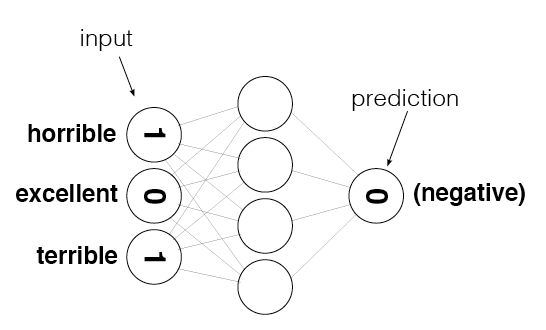

In [39]:
from IPython.display import Image
Image(filename='sentiment_network.png')

In [40]:
def update_input_layer(review):
    
    global layer_0
    
    # clear out previous state, reset the layer to be all 0s
    layer_0 *= 0
    for word in review.split(" "):
        layer_0[0][word2index[word]] += 1

update_input_layer(reviews[0])

In [41]:
layer_0

array([[ 18.,   0.,   0., ...,   0.,   0.,   0.]])

In [42]:
review_counter = Counter()

In [43]:
for word in reviews[0].split(" "):
    review_counter[word] += 1

In [44]:
review_counter.most_common()

[('.', 27),
 ('', 18),
 ('the', 9),
 ('to', 6),
 ('high', 5),
 ('i', 5),
 ('bromwell', 4),
 ('is', 4),
 ('a', 4),
 ('teachers', 4),
 ('that', 4),
 ('of', 4),
 ('it', 2),
 ('at', 2),
 ('as', 2),
 ('school', 2),
 ('my', 2),
 ('in', 2),
 ('me', 2),
 ('students', 2),
 ('their', 2),
 ('student', 2),
 ('cartoon', 1),
 ('comedy', 1),
 ('ran', 1),
 ('same', 1),
 ('time', 1),
 ('some', 1),
 ('other', 1),
 ('programs', 1),
 ('about', 1),
 ('life', 1),
 ('such', 1),
 ('years', 1),
 ('teaching', 1),
 ('profession', 1),
 ('lead', 1),
 ('believe', 1),
 ('s', 1),
 ('satire', 1),
 ('much', 1),
 ('closer', 1),
 ('reality', 1),
 ('than', 1),
 ('scramble', 1),
 ('survive', 1),
 ('financially', 1),
 ('insightful', 1),
 ('who', 1),
 ('can', 1),
 ('see', 1),
 ('right', 1),
 ('through', 1),
 ('pathetic', 1),
 ('pomp', 1),
 ('pettiness', 1),
 ('whole', 1),
 ('situation', 1),
 ('all', 1),
 ('remind', 1),
 ('schools', 1),
 ('knew', 1),
 ('and', 1),
 ('when', 1),
 ('saw', 1),
 ('episode', 1),
 ('which', 1),
 ('r

# Project 4: Reducing Noise in Our Input Data<a id='project_4'></a>

**TODO:** Attempt to reduce the noise in the input data like Andrew did in the previous video. Specifically, do the following:
* Copy the `SentimentNetwork` class you created earlier into the following cell.
* Modify `update_input_layer` so it does not count how many times each word is used, but rather just stores whether or not a word was used. 

In [45]:
# TODO: -Copy the SentimentNetwork class from Projet 3 lesson
#       -Modify it to reduce noise, like in the video 
import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):

        words = []
        for r in reviews:words.extend(r.split(" "))
        review_vocab = set(words)
        # TODO: populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words
        #       using "split(' ')" instead of "split()".

        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)

        label_vocab = set(labels)
        # TODO: populate label_vocab with all of the words in the given labels.
        #       There is no need to split the labels because each one is a single word.

        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)

        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)

        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        for idx,word in enumerate(self.review_vocab):self.word2index[word]=idx

        # TODO: populate self.word2index with indices for all the words in self.review_vocab
        #       like you saw earlier in the notebook

        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        for idx, label in enumerate(self.label_vocab):self.label2index[label]=idx
        
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights

        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((self.input_nodes,self.hidden_nodes))

        # TODO: initialize self.weights_1_2 as a matrix of random values.
        #       These are the weights between the hidden layer and the output layer.
        # mean = 0.0 and std deviation .
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5, size=(self.hidden_nodes,self.output_nodes))

        # TODO: Create the input layer, a two-dimensional matrix with shape
        #       1 x input_nodes, with all values initialized to zero
        self.layer_0 = np.zeros((1,input_nodes))
    
    def update_input_layer(self,review):
        # TODO: You can copy most of the code you wrote for update_input_layer
        #       earlier in this notebook.
        #
        #       However, MAKE SURE YOU CHANGE ALL VARIABLES TO REFERENCE
        #       THE VERSIONS STORED IN THIS OBJECT, NOT THE GLOBAL OBJECTS.
        #       For example, replace "layer_0 *= 0" with "self.layer_0 *= 0"

        # clear out previous state by resetting the layer to be all 0s
        self.layer_0 *= 0

        # TODO: count how many times each word is used in the given review and store the results in layer_0
        for word in review.split(" "):
                if word in self.word2index.keys():
                    self.layer_0[0][self.word2index[word]] = 1
                
    def get_target_for_label(self,label):
        # TODO: Copy the code you wrote for get_target_for_label
        #       earlier in this notebook.
        # TODO: Your code here
        if label == 'POSITIVE':
            return 1
        elif label == 'NEGATIVE':
            return 0

    def sigmoid(self,x):
        # TODO: Return the result of calculating the sigmoid activation function
        #       shown in the lectures
        return 1/(1+np.exp(-x))

    def sigmoid_output_2_derivative(self,output):
        # TODO: Return the derivative of the sigmoid activation function,
        #       where "output" is the original output from the sigmoid fucntion
        return output*(1-output)

    def train(self, training_reviews, training_labels):

        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews) == len(training_labels))

        # Keep track of correct predictions to display accuracy during training
        correct_so_far = 0

        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):

            # TODO: Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i]

            # TODO: Implement the forward pass through the network.
            #       That means use the given review to update the input layer,
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            #
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.
            # Forward pass
            self.update_input_layer(review) #Input layer
            layer_1 = self.layer_0.dot(self.weights_0_1)
            layer_2 = self.sigmoid(layer_1.dot(self.weights_1_2))

            # TODO: Implement the back propagation pass here.
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you
            #       learned in class.
            #output error
            layer_2_error=layer_2 - self.get_target_for_label(label)
            layer_2_delta=layer_2_error*self.sigmoid_output_2_derivative(layer_2)
            #hidden error
            layer_1_error=layer_2_delta.dot(self.weights_1_2.T)
            layer_1_delta=layer_1_error
            #update the weights
            self.weights_1_2-=layer_1.T.dot(layer_2_delta)*self.learning_rate
            self.weights_0_1-=self.layer_0.T.dot(layer_2_delta)*self.learning_rate
            # TODO: Keep track of correct predictions. To determine if the prediction was
            #       correct, check that the absolute value of the output error
            #       is less than 0.5. If so, add one to the correct_so_far count.
            if np.abs(layer_2_error)<0.5:
                correct_so_far+=1

            # For debug purposes, print out our prediction accuracy and speed
            # throughout the training process.

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0

            sys.stdout.write("\rProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i+1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i+1))[:4] + "%")
            if(i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # Run a forward pass through the network, like in the "train" function.
        
        # Input Layer
        self.update_input_layer(review.lower())

        # Hidden layer
        layer_1 = self.layer_0.dot(self.weights_0_1)

        # Output layer
        layer_2 = self.sigmoid(layer_1.dot(self.weights_1_2))
        
        # Return POSITIVE for values above greater-than-or-equal-to 0.5 in the output layer;
        # return NEGATIVE for other values
        if(layer_2[0] >= 0.5):
            return "POSITIVE"
        else:
            return "NEGATIVE"
        


Run the following cell to recreate the network and train it. Notice we've gone back to the higher learning rate of `0.1`.

In [46]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:0 #Trained:1 Training Accuracy:0.0%
Progress:10.4% Speed(reviews/sec):436.7 #Correct:1930 #Trained:2501 Training Accuracy:77.1%
Progress:20.8% Speed(reviews/sec):426.3 #Correct:3985 #Trained:5001 Training Accuracy:79.6%
Progress:31.2% Speed(reviews/sec):420.7 #Correct:6090 #Trained:7501 Training Accuracy:81.1%
Progress:41.6% Speed(reviews/sec):417.1 #Correct:8242 #Trained:10001 Training Accuracy:82.4%
Progress:52.0% Speed(reviews/sec):419.5 #Correct:10396 #Trained:12501 Training Accuracy:83.1%
Progress:62.5% Speed(reviews/sec):421.8 #Correct:12533 #Trained:15001 Training Accuracy:83.5%
Progress:72.9% Speed(reviews/sec):422.6 #Correct:14633 #Trained:17501 Training Accuracy:83.6%
Progress:83.3% Speed(reviews/sec):420.9 #Correct:16794 #Trained:20001 Training Accuracy:83.9%
Progress:93.7% Speed(reviews/sec):420.5 #Correct:18979 #Trained:22501 Training Accuracy:84.3%
Progress:99.9% Speed(reviews/sec):420.6 #Correct:20299 #Trained:24000 Training 

In [47]:
mlp1 = SentimentNetwork(reviews[:-1000], labels[:-1000], learning_rate=0.01)
mlp1.train(reviews[:-1000], labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:0 #Trained:1 Training Accuracy:0.0%
Progress:10.4% Speed(reviews/sec):406.0 #Correct:1713 #Trained:2501 Training Accuracy:68.4%
Progress:20.8% Speed(reviews/sec):409.8 #Correct:3762 #Trained:5001 Training Accuracy:75.2%
Progress:31.2% Speed(reviews/sec):408.7 #Correct:5886 #Trained:7501 Training Accuracy:78.4%
Progress:41.6% Speed(reviews/sec):406.4 #Correct:8022 #Trained:10001 Training Accuracy:80.2%
Progress:52.0% Speed(reviews/sec):409.1 #Correct:10167 #Trained:12501 Training Accuracy:81.3%
Progress:62.5% Speed(reviews/sec):411.2 #Correct:12278 #Trained:15001 Training Accuracy:81.8%
Progress:72.9% Speed(reviews/sec):413.0 #Correct:14408 #Trained:17501 Training Accuracy:82.3%
Progress:83.3% Speed(reviews/sec):414.0 #Correct:16596 #Trained:20001 Training Accuracy:82.9%
Progress:93.7% Speed(reviews/sec):415.2 #Correct:18780 #Trained:22501 Training Accuracy:83.4%
Progress:99.9% Speed(reviews/sec):416.3 #Correct:20100 #Trained:24000 Training 

That should have trained much better than the earlier attempts. It's still not wonderful, but it should have improved dramatically. Run the following cell to test your model with 1000 predictions.

In [48]:
mlp1.test(reviews[-1000:],labels[-1000:])

Progress:99.9% Speed(reviews/sec):1079. #Correct:856 #Tested:1000 Testing Accuracy:85.6%

# End of Project 4. 
## Andrew's solution was actually in the previous video, so rewatch that video if you had any problems with that project. Then continue on to the next lesson.
# Analyzing Inefficiencies in our Network<a id='lesson_5'></a>
The following cells include the code Andrew shows in the next video. We've included it here so you can run the cells along with the video without having to type in everything.

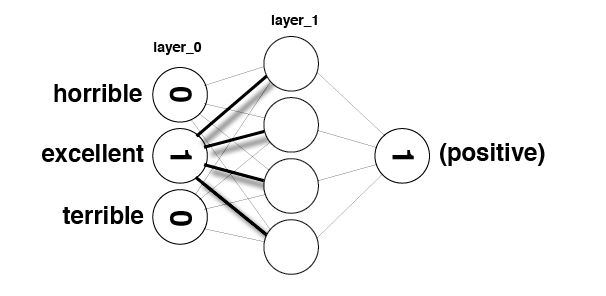

In [49]:
Image(filename='sentiment_network_sparse.png')

In [50]:
layer_0 = np.zeros(10)

In [51]:
layer_0

array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])

In [52]:
layer_0[4] = 1
layer_0[9] = 1

In [53]:
layer_0

array([ 0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  1.])

In [54]:
weights_0_1 = np.random.randn(10,5)

In [55]:
layer_0.dot(weights_0_1) #lets say there are 5 hidden nodes

array([-0.10503756,  0.44222989,  0.24392938, -0.55961832,  0.21389503])

In [56]:
# remember all the contributions for the hidden nodes come from the 1 values only
indices = [4,9]

In [57]:
layer_1 = np.zeros(5)

In [58]:
for index in indices:
    layer_1 += (1 * weights_0_1[index])

In [59]:
layer_1

array([-0.10503756,  0.44222989,  0.24392938, -0.55961832,  0.21389503])

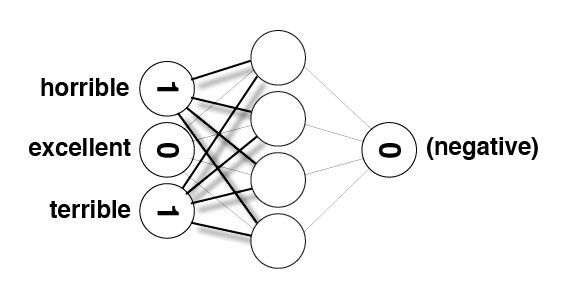

In [60]:
Image(filename='sentiment_network_sparse_2.png')

In [61]:
layer_1 = np.zeros(5)

In [62]:
for index in indices:
    layer_1 += (weights_0_1[index]) #do not need to multiply 1 just pick the values from the 10x5 matrix, that needs to be added

In [63]:
layer_1

array([-0.10503756,  0.44222989,  0.24392938, -0.55961832,  0.21389503])

# Project 5: Making our Network More Efficient<a id='project_5'></a>
**TODO:** Make the `SentimentNetwork` class more efficient by eliminating unnecessary multiplications and additions that occur during forward and backward propagation. To do that, you can do the following:
* Copy the `SentimentNetwork` class from the previous project into the following cell.
* Remove the `update_input_layer` function - you will not need it in this version.
* Modify `init_network`:
>* You no longer need a separate input layer, so remove any mention of `self.layer_0`
>* You will be dealing with the old hidden layer more directly, so create `self.layer_1`, a two-dimensional matrix with shape 1 x hidden_nodes, with all values initialized to zero
* Modify `train`:
>* Change the name of the input parameter `training_reviews` to `training_reviews_raw`. This will help with the next step.
>* At the beginning of the function, you'll want to preprocess your reviews to convert them to a list of indices (from `word2index`) that are actually used in the review. This is equivalent to what you saw in the video when Andrew set specific indices to 1. Your code should create a local `list` variable named `training_reviews` that should contain a `list` for each review in `training_reviews_raw`. Those lists should contain the indices for words found in the review.
>* Remove call to `update_input_layer`
>* Use `self`'s  `layer_1` instead of a local `layer_1` object.
>* In the forward pass, replace the code that updates `layer_1` with new logic that only adds the weights for the indices used in the review.
>* When updating `weights_0_1`, only update the individual weights that were used in the forward pass.
* Modify `run`:
>* Remove call to `update_input_layer` 
>* Use `self`'s  `layer_1` instead of a local `layer_1` object.
>* Much like you did in `train`, you will need to pre-process the `review` so you can work with word indices, then update `layer_1` by adding weights for the indices used in the review.

In [64]:
import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews,labels,hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):
        
        # populate review_vocab with all of the words in the given reviews
        review_vocab = set()
        for review in reviews:
            for word in review.split(" "):
                review_vocab.add(word)

        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        # populate label_vocab with all of the words in the given labels.
        label_vocab = set()
        for label in labels:
            label_vocab.add(label)
        
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        for i, word in enumerate(self.review_vocab):
            self.word2index[word] = i
        
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        for i, label in enumerate(self.label_vocab):
            self.label2index[label] = i

    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Set number of nodes in input, hidden and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights

        # These are the weights between the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((self.input_nodes,self.hidden_nodes))

        # These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5, 
                                                (self.hidden_nodes, self.output_nodes))
        
        ## New for Project 5: Removed self.layer_0; added self.layer_1
        # The input layer, a two-dimensional matrix with shape 1 x hidden_nodes
        self.layer_1 = np.zeros((1,hidden_nodes))
    
    ## New for Project 5: Removed update_input_layer function
    
    def get_target_for_label(self,label):
        if(label == 'POSITIVE'):
            return 1
        else:
            return 0
        
    def sigmoid(self,x):
        return 1 / (1 + np.exp(-x))
    
    def sigmoid_output_2_derivative(self,output):
        return output * (1 - output)
    
    ## New for Project 5: changed name of first parameter form 'training_reviews' 
    #                     to 'training_reviews_raw'
    def train(self, training_reviews_raw, training_labels):

        ## New for Project 5: pre-process training reviews so we can deal 
        #                     directly with the indices of non-zero inputs
        training_reviews = []
        for review in training_reviews_raw:
            indices = set()
            for word in review.split(" "):
                if(word in self.word2index.keys()):
                    indices.add(self.word2index[word]) # list of active indices 
            training_reviews.append(list(indices))

        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews) == len(training_labels))
        
        # Keep track of correct predictions to display accuracy during training 
        correct_so_far = 0

        # Remember when we started for printing time statistics
        start = time.time()
        
        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):
            
            # Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i]
            
            #### Implement the forward pass here ####
            ### Forward pass ###

            ## New for Project 5: Removed call to 'update_input_layer' function
            #                     because 'layer_0' is no longer used

            # Hidden layer
            ## New for Project 5: Add in only the weights for non-zero items
            # review is a list with has the indices basically for a sentence 
            self.layer_1 *= 0
            for index in review:
                self.layer_1 += self.weights_0_1[index]

            # Output layer
            ## New for Project 5: changed to use 'self.layer_1' instead of 'local layer_1'
            layer_2 = self.sigmoid(self.layer_1.dot(self.weights_1_2))            
            
            #### Implement the backward pass here ####
            ### Backward pass ###

            # Output error
            layer_2_error = layer_2 - self.get_target_for_label(label) # Output layer error is the difference between desired target and actual output.
            layer_2_delta = layer_2_error * self.sigmoid_output_2_derivative(layer_2)

            # Backpropagated error
            layer_1_error = layer_2_delta.dot(self.weights_1_2.T) # errors propagated to the hidden layer
            layer_1_delta = layer_1_error # hidden layer gradients - no nonlinearity so it's the same as the error

            # Update the weights
            ## New for Project 5: changed to use 'self.layer_1' instead of local 'layer_1'
            self.weights_1_2 -= self.layer_1.T.dot(layer_2_delta) * self.learning_rate # update hidden-to-output weights with gradient descent step
            
            ## New for Project 5: Only update the weights that were used in the forward pass
            for index in review:
                self.weights_0_1[index] -= layer_1_delta[0] * self.learning_rate # update input-to-hidden weights with gradient descent step

            # Keep track of correct predictions.
            if(layer_2 >= 0.5 and label == 'POSITIVE'):
                correct_so_far += 1
            elif(layer_2 < 0.5 and label == 'NEGATIVE'):
                correct_so_far += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the training process. 
            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i+1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i+1))[:4] + "%")
            if(i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # Run a forward pass through the network, like in the "train" function.
        
        ## New for Project 5: Removed call to update_input_layer function
        #                     because layer_0 is no longer used

        # Hidden layer
        ## New for Project 5: Identify the indices used in the review and then add
        #                     just those weights to layer_1 
        self.layer_1 *= 0
        unique_indices = set()
        for word in review.lower().split(" "):
            if word in self.word2index.keys():
                unique_indices.add(self.word2index[word])
        for index in unique_indices:
            self.layer_1 += self.weights_0_1[index]
        
        # Output layer
        ## New for Project 5: changed to use self.layer_1 instead of local layer_1
        layer_2 = self.sigmoid(self.layer_1.dot(self.weights_1_2))
        
        # Return POSITIVE for values above greater-than-or-equal-to 0.5 in the output layer;
        # return NEGATIVE for other values
        if(layer_2[0] >= 0.5):
            return "POSITIVE"
        else:
            return "NEGATIVE"


Run the following cell to recreate the network and train it once again.

In [65]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%


Progress:2.56% Speed(reviews/sec):1523. #Correct:393 #Trained:617 Training Accuracy:63.6%

Progress:3.84% Speed(reviews/sec):1516. #Correct:610 #Trained:923 Training Accuracy:66.0%

Progress:5.12% Speed(reviews/sec):1519. #Correct:852 #Trained:1232 Training Accuracy:69.1%

Progress:6.50% Speed(reviews/sec):1537. #Correct:1103 #Trained:1562 Training Accuracy:70.6%

Progress:7.94% Speed(reviews/sec):1565. #Correct:1378 #Trained:1908 Training Accuracy:72.2%

Progress:9.30% Speed(reviews/sec):1571. #Correct:1648 #Trained:2234 Training Accuracy:73.7%

Progress:10.4% Speed(reviews/sec):1558. #Correct:1855 #Trained:2501 Training Accuracy:74.1%


Progress:11.8% Speed(reviews/sec):1549. #Correct:2136 #Trained:2836 Training Accuracy:75.3%

Progress:13.0% Speed(reviews/sec):1542. #Correct:2373 #Trained:3137 Training Accuracy:75.6%

Progress:14.3% Speed(reviews/sec):1534. #Correct:2590 #Trained:3433 Training Accuracy:75.4%

Progress:15.5% Speed(reviews/sec):1533. #Correct:2846 #Trained:3743 Training Accuracy:76.0%

Progress:16.9% Speed(reviews/sec):1536. #Correct:3102 #Trained:4064 Training Accuracy:76.3%

Progress:18.2% Speed(reviews/sec):1537. #Correct:3350 #Trained:4380 Training Accuracy:76.4%

Progress:19.5% Speed(reviews/sec):1534. #Correct:3593 #Trained:4682 Training Accuracy:76.7%

Progress:20.6% Speed(reviews/sec):1521. #Correct:3815 #Trained:4953 Training Accuracy:77.0%

Progress:20.8% Speed(reviews/sec):1519. #Correct:3852 #Trained:5001 Training Accuracy:77.0%


Progress:23.2% Speed(reviews/sec):1525. #Correct:4328 #Trained:5585 Training Accuracy:77.4%

Progress:24.5% Speed(reviews/sec):1523. #Correct:4576 #Trained:5891 Training Accuracy:77.6%

Progress:25.7% Speed(reviews/sec):1516. #Correct:4805 #Trained:6170 Training Accuracy:77.8%

Progress:27.0% Speed(reviews/sec):1519. #Correct:5077 #Trained:6491 Training Accuracy:78.2%

Progress:28.2% Speed(reviews/sec):1513. #Correct:5321 #Trained:6776 Training Accuracy:78.5%

Progress:29.3% Speed(reviews/sec):1504. #Correct:5550 #Trained:7042 Training Accuracy:78.8%

Progress:30.0% Speed(reviews/sec):1475. #Correct:5702 #Trained:7222 Training Accuracy:78.9%

Progress:31.2% Speed(reviews/sec):1477. #Correct:5932 #Trained:7501 Training Accuracy:79.0%


Progress:32.6% Speed(reviews/sec):1480. #Correct:6232 #Trained:7846 Training Accuracy:79.4%

Progress:34.0% Speed(reviews/sec):1483. #Correct:6499 #Trained:8162 Training Accuracy:79.6%

Progress:35.2% Speed(reviews/sec):1482. #Correct:6744 #Trained:8462 Training Accuracy:79.6%

Progress:36.5% Speed(reviews/sec):1483. #Correct:7005 #Trained:8767 Training Accuracy:79.9%

Progress:37.7% Speed(reviews/sec):1480. #Correct:7257 #Trained:9055 Training Accuracy:80.1%

Progress:38.9% Speed(reviews/sec):1479. #Correct:7518 #Trained:9349 Training Accuracy:80.4%

Progress:40.2% Speed(reviews/sec):1479. #Correct:7776 #Trained:9649 Training Accuracy:80.5%

Progress:41.4% Speed(reviews/sec):1478. #Correct:8030 #Trained:9943 Training Accuracy:80.7%

Progress:41.6% Speed(reviews/sec):1477. #Correct:8081 #Trained:10001 Training Accuracy:80.8%


Progress:43.9% Speed(reviews/sec):1480. #Correct:8562 #Trained:10559 Training Accuracy:81.0%

Progress:45.2% Speed(reviews/sec):1479. #Correct:8806 #Trained:10858 Training Accuracy:81.1%

Progress:46.4% Speed(reviews/sec):1479. #Correct:9067 #Trained:11157 Training Accuracy:81.2%

Progress:47.6% Speed(reviews/sec):1477. #Correct:9305 #Trained:11442 Training Accuracy:81.3%

Progress:48.9% Speed(reviews/sec):1478. #Correct:9563 #Trained:11748 Training Accuracy:81.4%

Progress:50.1% Speed(reviews/sec):1476. #Correct:9817 #Trained:12034 Training Accuracy:81.5%

Progress:51.4% Speed(reviews/sec):1477. #Correct:10087 #Trained:12347 Training Accuracy:81.6%

Progress:52.0% Speed(reviews/sec):1477. #Correct:10221 #Trained:12501 Training Accuracy:81.7%


Progress:53.8% Speed(reviews/sec):1475. #Correct:10590 #Trained:12932 Training Accuracy:81.8%

Progress:55.1% Speed(reviews/sec):1475. #Correct:10840 #Trained:13227 Training Accuracy:81.9%

Progress:56.3% Speed(reviews/sec):1476. #Correct:11105 #Trained:13534 Training Accuracy:82.0%

Progress:57.6% Speed(reviews/sec):1475. #Correct:11350 #Trained:13830 Training Accuracy:82.0%

Progress:58.9% Speed(reviews/sec):1478. #Correct:11621 #Trained:14153 Training Accuracy:82.1%

Progress:60.2% Speed(reviews/sec):1479. #Correct:11875 #Trained:14465 Training Accuracy:82.0%

Progress:61.5% Speed(reviews/sec):1479. #Correct:12132 #Trained:14771 Training Accuracy:82.1%

Progress:62.5% Speed(reviews/sec):1478. #Correct:12334 #Trained:15001 Training Accuracy:82.2%


Progress:63.9% Speed(reviews/sec):1477. #Correct:12617 #Trained:15351 Training Accuracy:82.1%

Progress:65.2% Speed(reviews/sec):1477. #Correct:12871 #Trained:15658 Training Accuracy:82.2%

Progress:66.5% Speed(reviews/sec):1479. #Correct:13132 #Trained:15974 Training Accuracy:82.2%

Progress:67.8% Speed(reviews/sec):1479. #Correct:13396 #Trained:16278 Training Accuracy:82.2%

Progress:69.1% Speed(reviews/sec):1480. #Correct:13649 #Trained:16586 Training Accuracy:82.2%

Progress:70.4% Speed(reviews/sec):1481. #Correct:13911 #Trained:16901 Training Accuracy:82.3%

Progress:71.7% Speed(reviews/sec):1483. #Correct:14195 #Trained:17232 Training Accuracy:82.3%

Progress:72.9% Speed(reviews/sec):1483. #Correct:14425 #Trained:17501 Training Accuracy:82.4%


Progress:74.2% Speed(reviews/sec):1483. #Correct:14699 #Trained:17828 Training Accuracy:82.4%

Progress:75.5% Speed(reviews/sec):1483. #Correct:14960 #Trained:18129 Training Accuracy:82.5%

Progress:76.7% Speed(reviews/sec):1482. #Correct:15219 #Trained:18428 Training Accuracy:82.5%

Progress:78.1% Speed(reviews/sec):1484. #Correct:15510 #Trained:18749 Training Accuracy:82.7%

Progress:79.3% Speed(reviews/sec):1483. #Correct:15762 #Trained:19045 Training Accuracy:82.7%

Progress:80.6% Speed(reviews/sec):1485. #Correct:16042 #Trained:19363 Training Accuracy:82.8%

Progress:81.8% Speed(reviews/sec):1483. #Correct:16278 #Trained:19639 Training Accuracy:82.8%

Progress:83.0% Speed(reviews/sec):1482. #Correct:16543 #Trained:19938 Training Accuracy:82.9%

Progress:83.3% Speed(reviews/sec):1482. #Correct:16597 #Trained:20001 Training Accuracy:82.9%


Progress:85.5% Speed(reviews/sec):1481. #Correct:17056 #Trained:20527 Training Accuracy:83.0%

Progress:86.7% Speed(reviews/sec):1481. #Correct:17313 #Trained:20821 Training Accuracy:83.1%

Progress:87.9% Speed(reviews/sec):1480. #Correct:17566 #Trained:21111 Training Accuracy:83.2%

Progress:89.2% Speed(reviews/sec):1481. #Correct:17844 #Trained:21430 Training Accuracy:83.2%

Progress:90.5% Speed(reviews/sec):1481. #Correct:18113 #Trained:21732 Training Accuracy:83.3%

Progress:91.8% Speed(reviews/sec):1482. #Correct:18387 #Trained:22040 Training Accuracy:83.4%

Progress:93.0% Speed(reviews/sec):1481. #Correct:18639 #Trained:22329 Training Accuracy:83.4%

Progress:93.7% Speed(reviews/sec):1480. #Correct:18786 #Trained:22501 Training Accuracy:83.4%


Progress:95.5% Speed(reviews/sec):1481. #Correct:19149 #Trained:22933 Training Accuracy:83.4%

Progress:96.8% Speed(reviews/sec):1481. #Correct:19419 #Trained:23238 Training Accuracy:83.5%

Progress:98.0% Speed(reviews/sec):1481. #Correct:19685 #Trained:23540 Training Accuracy:83.6%

Progress:99.2% Speed(reviews/sec):1479. #Correct:19929 #Trained:23810 Training Accuracy:83.7%

Progress:99.9% Speed(reviews/sec):1479. #Correct:20105 #Trained:24000 Training Accuracy:83.7%

That should have trained much better than the earlier attempts. Run the following cell to test your model with 1000 predictions.

In [66]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:99.9% Speed(reviews/sec):1762. #Correct:846 #Tested:1000 Testing Accuracy:84.6%

# End of Project 5. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.
# Further Noise Reduction<a id='lesson_6'></a>

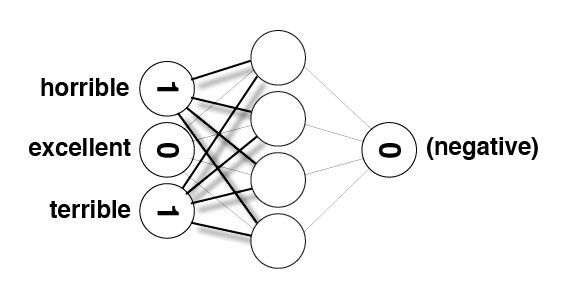

In [67]:
Image(filename='sentiment_network_sparse_2.png')

In [68]:
# words most frequently seen in a review with a "POSITIVE" label
pos_neg_ratios.most_common()

[('edie', 4.6913478822291435),
 ('antwone', 4.4773368144782069),
 ('din', 4.4067192472642533),
 ('gunga', 4.1896547420264252),
 ('goldsworthy', 4.1743872698956368),
 ('gypo', 4.0943445622221004),
 ('yokai', 4.0943445622221004),
 ('paulie', 4.0775374439057197),
 ('visconti', 3.9318256327243257),
 ('flavia', 3.9318256327243257),
 ('blandings', 3.8712010109078911),
 ('kells', 3.8712010109078911),
 ('brashear', 3.8501476017100584),
 ('gino', 3.8286413964890951),
 ('deathtrap', 3.8066624897703196),
 ('harilal', 3.713572066704308),
 ('panahi', 3.713572066704308),
 ('ossessione', 3.6635616461296463),
 ('tsui', 3.6375861597263857),
 ('caruso', 3.6375861597263857),
 ('sabu', 3.6109179126442243),
 ('ahmad', 3.6109179126442243),
 ('khouri', 3.5835189384561099),
 ('dominick', 3.5835189384561099),
 ('aweigh', 3.5553480614894135),
 ('mj', 3.5553480614894135),
 ('mcintire', 3.5263605246161616),
 ('kriemhild', 3.5263605246161616),
 ('blackie', 3.4965075614664802),
 ('daisies', 3.4965075614664802),
 ('

In [69]:
# words most frequently seen in a review with a "NEGATIVE" label
list(reversed(pos_neg_ratios.most_common()))[0:30]

[('whelk', -inf),
 ('pressurized', -inf),
 ('bellwood', -inf),
 ('mwuhahahaa', -inf),
 ('insulation', -inf),
 ('hoodies', -inf),
 ('yaks', -inf),
 ('raksha', -inf),
 ('deamon', -inf),
 ('ziller', -inf),
 ('lagomorph', -inf),
 ('marinaro', -inf),
 ('accelerant', -inf),
 ('yez', -inf),
 ('superhu', -inf),
 ('fastidiously', -inf),
 ('spotlessly', -inf),
 ('dahlink', -inf),
 ('rebanished', -inf),
 ('unmated', -inf),
 ('wushu', -inf),
 ('yetis', -inf),
 ('nix', -inf),
 ('echance', -inf),
 ('vannet', -inf),
 ('hodet', -inf),
 ('francie', -inf),
 ('vivisects', -inf),
 ('degeneration', -inf),
 ('lowlight', -inf)]

In [70]:
from bokeh.models import ColumnDataSource, LabelSet
from bokeh.plotting import figure, show, output_file
from bokeh.io import output_notebook
output_notebook()

Loading BokehJS ...

In [71]:
hist, edges = np.histogram(list(map(lambda x:x[1],pos_neg_ratios.most_common())), density=True, bins=100, normed=True)

p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="Word Positive/Negative Affinity Distribution")
p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], line_color="#555555")
show(p)

ValueError: range parameter must be finite.

In [73]:
frequency_frequency = Counter()

for word, cnt in total_counts.most_common():
    frequency_frequency[cnt] += 1

In [74]:
hist, edges = np.histogram(list(map(lambda x:x[1],frequency_frequency.most_common())), density=True, bins=100, normed=True)

p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="The frequency distribution of the words in our corpus")
p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], line_color="#555555")
show(p)

# Project 6: Reducing Noise by Strategically Reducing the Vocabulary<a id='project_6'></a>

**TODO:** Improve `SentimentNetwork`'s performance by reducing more noise in the vocabulary. Specifically, do the following:
* Copy the `SentimentNetwork` class from the previous project into the following cell.
* Modify `pre_process_data`:
>* Add two additional parameters: `min_count` and `polarity_cutoff`
>* Calculate the positive-to-negative ratios of words used in the reviews. (You can use code you've written elsewhere in the notebook, but we are moving it into the class like we did with other helper code earlier.)
>* Andrew's solution only calculates a postive-to-negative ratio for words that occur at least 50 times. This keeps the network from attributing too much sentiment to rarer words. You can choose to add this to your solution if you would like.  
>* Change so words are only added to the vocabulary if they occur in the vocabulary more than `min_count` times.
>* Change so words are only added to the vocabulary if the absolute value of their postive-to-negative ratio is at least `polarity_cutoff`
* Modify `__init__`:
>* Add the same two parameters (`min_count` and `polarity_cutoff`) and use them when you call `pre_process_data`

In [75]:
# TODO: -Copy the SentimentNetwork class from Project 5 lesson
#       -Modify it according to the above instructions 
import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews,labels,hidden_nodes = 10, learning_rate = 0.1, min_count=10, polarity_cutoff=0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels, polarity_cutoff, min_count)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels,polarity_cutoff,min_count):        
        
        positive_counts=Counter()
        negative_counts=Counter()
        total_counts=Counter()
        pos_neg_ratios=Counter()
        #Calculating the positive to negative ratios used in the reviews 
        positive_to_neg_ratios=Counter()
        for idx, r in enumerate(reviews):
            for w in r.split(" "):
                if labels[idx]=="POSITIVE":
                    positive_counts[w]+=1
                    total_counts[w]+=1
                elif labels[idx]=="NEGATIVE":
                    negative_counts[w]+=1
                    total_counts[w]+=1
        
        for w in total_counts:
            if total_counts[w]>=50:
                pos_neg_ratios[w] = positive_counts[w]/float(negative_counts[w]+1)
                
        for w,ratio in total_counts.most_common():
            if ratio>1:
                pos_neg_ratios[w]=np.log(ratio)
            else:
                pos_neg_ratios[w]=-np.log((1/(ratio+0.01)))
        
        # populate review_vocab with all of the words in the given reviews
        review_vocab = set()
        for review in reviews:
            for word in review.split(" "):
                if (total_counts[word]>=min_count):
                    if word in pos_neg_ratios.keys():
                        if pos_neg_ratios[word]>=polarity_cutoff or pos_neg_ratios[word]<=-polarity_cutoff:
                            review_vocab.add(word)
                        else:
                            review_vocab.add(word)

        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        # populate label_vocab with all of the words in the given labels.
        label_vocab = set()
        for label in labels:
            label_vocab.add(label)
        
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        for i, word in enumerate(self.review_vocab):
            self.word2index[word] = i
        
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        for i, label in enumerate(self.label_vocab):
            self.label2index[label] = i

    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Set number of nodes in input, hidden and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights

        # These are the weights between the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((self.input_nodes,self.hidden_nodes))

        # These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5, 
                                                (self.hidden_nodes, self.output_nodes))
        
        ## New for Project 5: Removed self.layer_0; added self.layer_1
        # The input layer, a two-dimensional matrix with shape 1 x hidden_nodes
        self.layer_1 = np.zeros((1,hidden_nodes))
    
    ## New for Project 5: Removed update_input_layer function
    
    def get_target_for_label(self,label):
        if(label == 'POSITIVE'):
            return 1
        else:
            return 0
        
    def sigmoid(self,x):
        return 1 / (1 + np.exp(-x))
    
    def sigmoid_output_2_derivative(self,output):
        return output * (1 - output)
    
    ## New for Project 5: changed name of first parameter form 'training_reviews' 
    #                     to 'training_reviews_raw'
    def train(self, training_reviews_raw, training_labels):

        ## New for Project 5: pre-process training reviews so we can deal 
        #                     directly with the indices of non-zero inputs
        training_reviews = []
        for review in training_reviews_raw:
            indices = set()
            for word in review.split(" "):
                if(word in self.word2index.keys()):
                    indices.add(self.word2index[word]) # list of active indices 
            training_reviews.append(list(indices))

        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews) == len(training_labels))
        
        # Keep track of correct predictions to display accuracy during training 
        correct_so_far = 0

        # Remember when we started for printing time statistics
        start = time.time()
        
        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):
            
            # Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i]
            
            #### Implement the forward pass here ####
            ### Forward pass ###

            ## New for Project 5: Removed call to 'update_input_layer' function
            #                     because 'layer_0' is no longer used

            # Hidden layer
            ## New for Project 5: Add in only the weights for non-zero items
            # review is a list with has the indices basically for a sentence 
            self.layer_1 *= 0
            for index in review:
                self.layer_1 += self.weights_0_1[index]

            # Output layer
            ## New for Project 5: changed to use 'self.layer_1' instead of 'local layer_1'
            layer_2 = self.sigmoid(self.layer_1.dot(self.weights_1_2))            
            
            #### Implement the backward pass here ####
            ### Backward pass ###

            # Output error
            layer_2_error = layer_2 - self.get_target_for_label(label) # Output layer error is the difference between desired target and actual output.
            layer_2_delta = layer_2_error * self.sigmoid_output_2_derivative(layer_2)

            # Backpropagated error
            layer_1_error = layer_2_delta.dot(self.weights_1_2.T) # errors propagated to the hidden layer
            layer_1_delta = layer_1_error # hidden layer gradients - no nonlinearity so it's the same as the error

            # Update the weights
            ## New for Project 5: changed to use 'self.layer_1' instead of local 'layer_1'
            self.weights_1_2 -= self.layer_1.T.dot(layer_2_delta) * self.learning_rate # update hidden-to-output weights with gradient descent step
            
            ## New for Project 5: Only update the weights that were used in the forward pass
            for index in review:
                self.weights_0_1[index] -= layer_1_delta[0] * self.learning_rate # update input-to-hidden weights with gradient descent step

            # Keep track of correct predictions.
            if(layer_2 >= 0.5 and label == 'POSITIVE'):
                correct_so_far += 1
            elif(layer_2 < 0.5 and label == 'NEGATIVE'):
                correct_so_far += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the training process. 
            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i+1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i+1))[:4] + "%")
            if(i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # Run a forward pass through the network, like in the "train" function.
        
        ## New for Project 5: Removed call to update_input_layer function
        #                     because layer_0 is no longer used

        # Hidden layer
        ## New for Project 5: Identify the indices used in the review and then add
        #                     just those weights to layer_1 
        self.layer_1 *= 0
        unique_indices = set()
        for word in review.lower().split(" "):
            if word in self.word2index.keys():
                unique_indices.add(self.word2index[word])
        for index in unique_indices:
            self.layer_1 += self.weights_0_1[index]
        
        # Output layer
        ## New for Project 5: changed to use self.layer_1 instead of local layer_1
        layer_2 = self.sigmoid(self.layer_1.dot(self.weights_1_2))
        
        # Return POSITIVE for values above greater-than-or-equal-to 0.5 in the output layer;
        # return NEGATIVE for other values
        if(layer_2[0] >= 0.5):
            return "POSITIVE"
        else:
            return "NEGATIVE"

Run the following cell to train your network with a small polarity cutoff.

In [76]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=20,polarity_cutoff=0.05,learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%


Progress:2.4% Speed(reviews/sec):1425. #Correct:413 #Trained:577 Training Accuracy:71.5%

Progress:3.59% Speed(reviews/sec):1422. #Correct:631 #Trained:863 Training Accuracy:73.1%

Progress:4.77% Speed(reviews/sec):1414. #Correct:865 #Trained:1147 Training Accuracy:75.4%

Progress:5.94% Speed(reviews/sec):1407. #Correct:1081 #Trained:1428 Training Accuracy:75.7%

Progress:7.18% Speed(reviews/sec):1415. #Correct:1321 #Trained:1725 Training Accuracy:76.5%

Progress:8.45% Speed(reviews/sec):1425. #Correct:1570 #Trained:2029 Training Accuracy:77.3%

Progress:9.58% Speed(reviews/sec):1415. #Correct:1796 #Trained:2302 Training Accuracy:78.0%

Progress:10.4% Speed(reviews/sec):1412. #Correct:1954 #Trained:2501 Training Accuracy:78.1%


Progress:11.9% Speed(reviews/sec):1408. #Correct:2271 #Trained:2865 Training Accuracy:79.2%

Progress:13.0% Speed(reviews/sec):1402. #Correct:2498 #Trained:3140 Training Accuracy:79.5%

Progress:14.2% Speed(reviews/sec):1401. #Correct:2718 #Trained:3420 Training Accuracy:79.4%

Progress:15.4% Speed(reviews/sec):1402. #Correct:2951 #Trained:3709 Training Accuracy:79.5%

Progress:16.7% Speed(reviews/sec):1407. #Correct:3197 #Trained:4010 Training Accuracy:79.7%

Progress:17.9% Speed(reviews/sec):1408. #Correct:3440 #Trained:4300 Training Accuracy:80.0%

Progress:19.0% Speed(reviews/sec):1402. #Correct:3650 #Trained:4570 Training Accuracy:79.8%

Progress:20.0% Speed(reviews/sec):1388. #Correct:3843 #Trained:4807 Training Accuracy:79.9%

Progress:20.8% Speed(reviews/sec):1375. #Correct:3996 #Trained:5001 Training Accuracy:79.9%


Progress:22.1% Speed(reviews/sec):1372. #Correct:4265 #Trained:5311 Training Accuracy:80.3%

Progress:23.2% Speed(reviews/sec):1368. #Correct:4477 #Trained:5574 Training Accuracy:80.3%

Progress:24.3% Speed(reviews/sec):1365. #Correct:4700 #Trained:5838 Training Accuracy:80.5%

Progress:25.3% Speed(reviews/sec):1358. #Correct:4898 #Trained:6087 Training Accuracy:80.4%

Progress:26.4% Speed(reviews/sec):1354. #Correct:5125 #Trained:6346 Training Accuracy:80.7%

Progress:27.6% Speed(reviews/sec):1355. #Correct:5363 #Trained:6625 Training Accuracy:80.9%

Progress:28.5% Speed(reviews/sec):1348. #Correct:5568 #Trained:6863 Training Accuracy:81.1%

Progress:29.6% Speed(reviews/sec):1344. #Correct:5788 #Trained:7119 Training Accuracy:81.3%

Progress:30.7% Speed(reviews/sec):1341. #Correct:6009 #Trained:7376 Training Accuracy:81.4%

Progress:31.2% Speed(reviews/sec):1340. #Correct:6114 #Trained:7501 Training Accuracy:81.5%


Progress:32.9% Speed(reviews/sec):1339. #Correct:6462 #Trained:7910 Training Accuracy:81.6%

Progress:34.0% Speed(reviews/sec):1338. #Correct:6695 #Trained:8179 Training Accuracy:81.8%

Progress:35.1% Speed(reviews/sec):1335. #Correct:6905 #Trained:8428 Training Accuracy:81.9%

Progress:36.1% Speed(reviews/sec):1332. #Correct:7127 #Trained:8687 Training Accuracy:82.0%

Progress:37.2% Speed(reviews/sec):1331. #Correct:7350 #Trained:8946 Training Accuracy:82.1%

Progress:38.4% Speed(reviews/sec):1333. #Correct:7614 #Trained:9236 Training Accuracy:82.4%

Progress:39.7% Speed(reviews/sec):1337. #Correct:7861 #Trained:9534 Training Accuracy:82.4%

Progress:40.9% Speed(reviews/sec):1340. #Correct:8120 #Trained:9830 Training Accuracy:82.6%

Progress:41.6% Speed(reviews/sec):1341. #Correct:8266 #Trained:10001 Training Accuracy:82.6%


Progress:43.3% Speed(reviews/sec):1344. #Correct:8614 #Trained:10403 Training Accuracy:82.8%

Progress:44.5% Speed(reviews/sec):1345. #Correct:8857 #Trained:10686 Training Accuracy:82.8%

Progress:45.7% Speed(reviews/sec):1346. #Correct:9104 #Trained:10973 Training Accuracy:82.9%

Progress:46.9% Speed(reviews/sec):1349. #Correct:9364 #Trained:11268 Training Accuracy:83.1%

Progress:48.2% Speed(reviews/sec):1353. #Correct:9618 #Trained:11574 Training Accuracy:83.1%

Progress:49.3% Speed(reviews/sec):1351. #Correct:9843 #Trained:11835 Training Accuracy:83.1%

Progress:50.5% Speed(reviews/sec):1352. #Correct:10095 #Trained:12121 Training Accuracy:83.2%

Progress:51.7% Speed(reviews/sec):1355. #Correct:10351 #Trained:12425 Training Accuracy:83.3%

Progress:52.0% Speed(reviews/sec):1355. #Correct:10423 #Trained:12501 Training Accuracy:83.3%


Progress:54.0% Speed(reviews/sec):1356. #Correct:10839 #Trained:12983 Training Accuracy:83.4%

Progress:55.3% Speed(reviews/sec):1358. #Correct:11098 #Trained:13282 Training Accuracy:83.5%

Progress:56.5% Speed(reviews/sec):1359. #Correct:11344 #Trained:13565 Training Accuracy:83.6%

Progress:57.6% Speed(reviews/sec):1359. #Correct:11591 #Trained:13848 Training Accuracy:83.7%

Progress:59.0% Speed(reviews/sec):1363. #Correct:11858 #Trained:14161 Training Accuracy:83.7%

Progress:60.2% Speed(reviews/sec):1365. #Correct:12107 #Trained:14463 Training Accuracy:83.7%

Progress:61.4% Speed(reviews/sec):1366. #Correct:12341 #Trained:14750 Training Accuracy:83.6%

Progress:62.5% Speed(reviews/sec):1367. #Correct:12559 #Trained:15001 Training Accuracy:83.7%


Progress:63.7% Speed(reviews/sec):1366. #Correct:12807 #Trained:15304 Training Accuracy:83.6%

Progress:64.9% Speed(reviews/sec):1367. #Correct:13046 #Trained:15594 Training Accuracy:83.6%

Progress:66.2% Speed(reviews/sec):1369. #Correct:13303 #Trained:15898 Training Accuracy:83.6%

Progress:67.4% Speed(reviews/sec):1369. #Correct:13533 #Trained:16180 Training Accuracy:83.6%

Progress:68.6% Speed(reviews/sec):1372. #Correct:13789 #Trained:16486 Training Accuracy:83.6%

Progress:69.7% Speed(reviews/sec):1370. #Correct:14013 #Trained:16748 Training Accuracy:83.6%

Progress:71.1% Speed(reviews/sec):1374. #Correct:14288 #Trained:17071 Training Accuracy:83.6%

Progress:72.3% Speed(reviews/sec):1375. #Correct:14540 #Trained:17359 Training Accuracy:83.7%

Progress:72.9% Speed(reviews/sec):1374. #Correct:14661 #Trained:17501 Training Accuracy:83.7%


Progress:74.6% Speed(reviews/sec):1374. #Correct:15003 #Trained:17907 Training Accuracy:83.7%

Progress:75.8% Speed(reviews/sec):1375. #Correct:15257 #Trained:18200 Training Accuracy:83.8%

Progress:77.0% Speed(reviews/sec):1375. #Correct:15505 #Trained:18482 Training Accuracy:83.8%

Progress:78.2% Speed(reviews/sec):1376. #Correct:15767 #Trained:18775 Training Accuracy:83.9%

Progress:79.3% Speed(reviews/sec):1376. #Correct:16008 #Trained:19056 Training Accuracy:84.0%

Progress:80.5% Speed(reviews/sec):1376. #Correct:16260 #Trained:19342 Training Accuracy:84.0%

Progress:81.6% Speed(reviews/sec):1375. #Correct:16480 #Trained:19600 Training Accuracy:84.0%

Progress:82.8% Speed(reviews/sec):1374. #Correct:16721 #Trained:19879 Training Accuracy:84.1%

Progress:83.3% Speed(reviews/sec):1374. #Correct:16827 #Trained:20001 Training Accuracy:84.1%


Progress:85.1% Speed(reviews/sec):1374. #Correct:17207 #Trained:20437 Training Accuracy:84.1%

Progress:86.2% Speed(reviews/sec):1373. #Correct:17434 #Trained:20702 Training Accuracy:84.2%

Progress:87.4% Speed(reviews/sec):1373. #Correct:17679 #Trained:20978 Training Accuracy:84.2%

Progress:88.5% Speed(reviews/sec):1373. #Correct:17922 #Trained:21263 Training Accuracy:84.2%

Progress:89.7% Speed(reviews/sec):1374. #Correct:18180 #Trained:21550 Training Accuracy:84.3%

Progress:91.0% Speed(reviews/sec):1376. #Correct:18447 #Trained:21860 Training Accuracy:84.3%

Progress:92.3% Speed(reviews/sec):1377. #Correct:18709 #Trained:22155 Training Accuracy:84.4%

Progress:93.4% Speed(reviews/sec):1377. #Correct:18950 #Trained:22440 Training Accuracy:84.4%

Progress:93.7% Speed(reviews/sec):1376. #Correct:19005 #Trained:22501 Training Accuracy:84.4%


Progress:95.8% Speed(reviews/sec):1378. #Correct:19443 #Trained:23009 Training Accuracy:84.5%

Progress:97.0% Speed(reviews/sec):1378. #Correct:19688 #Trained:23293 Training Accuracy:84.5%

Progress:98.2% Speed(reviews/sec):1379. #Correct:19950 #Trained:23588 Training Accuracy:84.5%

Progress:99.4% Speed(reviews/sec):1379. #Correct:20208 #Trained:23874 Training Accuracy:84.6%

Progress:99.9% Speed(reviews/sec):1379. #Correct:20324 #Trained:24000 Training Accuracy:84.6%

And run the following cell to test it's performance. It should be 

In [77]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:38.9% Speed(reviews/sec):1933. #Correct:341 #Tested:390 Testing Accuracy:87.4%

Progress:77.8% Speed(reviews/sec):1917. #Correct:669 #Tested:779 Testing Accuracy:85.8%

Progress:99.9% Speed(reviews/sec):1910. #Correct:859 #Tested:1000 Testing Accuracy:85.9%

Run the following cell to train your network with a much larger polarity cutoff.

In [78]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=20,polarity_cutoff=0.8,learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%


Progress:2.42% Speed(reviews/sec):1439. #Correct:417 #Trained:582 Training Accuracy:71.6%

Progress:3.64% Speed(reviews/sec):1441. #Correct:641 #Trained:876 Training Accuracy:73.1%

Progress:4.85% Speed(reviews/sec):1437. #Correct:883 #Trained:1167 Training Accuracy:75.6%

Progress:6.11% Speed(reviews/sec):1447. #Correct:1109 #Trained:1469 Training Accuracy:75.4%

Progress:7.42% Speed(reviews/sec):1462. #Correct:1367 #Trained:1782 Training Accuracy:76.7%

Progress:8.69% Speed(reviews/sec):1467. #Correct:1617 #Trained:2087 Training Accuracy:77.4%

Progress:9.85% Speed(reviews/sec):1454. #Correct:1844 #Trained:2365 Training Accuracy:77.9%

Progress:10.4% Speed(reviews/sec):1451. #Correct:1954 #Trained:2501 Training Accuracy:78.1%


Progress:12.2% Speed(reviews/sec):1441. #Correct:2330 #Trained:2932 Training Accuracy:79.4%

Progress:13.4% Speed(reviews/sec):1443. #Correct:2573 #Trained:3228 Training Accuracy:79.7%

Progress:14.6% Speed(reviews/sec):1438. #Correct:2792 #Trained:3511 Training Accuracy:79.5%

Progress:15.8% Speed(reviews/sec):1438. #Correct:3028 #Trained:3802 Training Accuracy:79.6%

Progress:17.1% Speed(reviews/sec):1442. #Correct:3281 #Trained:4106 Training Accuracy:79.9%

Progress:18.3% Speed(reviews/sec):1441. #Correct:3515 #Trained:4397 Training Accuracy:79.9%

Progress:19.3% Speed(reviews/sec):1431. #Correct:3714 #Trained:4655 Training Accuracy:79.7%

Progress:20.4% Speed(reviews/sec):1417. #Correct:3922 #Trained:4899 Training Accuracy:80.0%

Progress:20.8% Speed(reviews/sec):1413. #Correct:3996 #Trained:5001 Training Accuracy:79.9%


Progress:22.6% Speed(reviews/sec):1408. #Correct:4368 #Trained:5443 Training Accuracy:80.2%

Progress:23.8% Speed(reviews/sec):1409. #Correct:4610 #Trained:5732 Training Accuracy:80.4%

Progress:24.9% Speed(reviews/sec):1401. #Correct:4819 #Trained:5988 Training Accuracy:80.4%

Progress:26.0% Speed(reviews/sec):1397. #Correct:5045 #Trained:6253 Training Accuracy:80.6%

Progress:27.2% Speed(reviews/sec):1396. #Correct:5286 #Trained:6536 Training Accuracy:80.8%

Progress:28.2% Speed(reviews/sec):1390. #Correct:5503 #Trained:6789 Training Accuracy:81.0%

Progress:29.4% Speed(reviews/sec):1388. #Correct:5743 #Trained:7062 Training Accuracy:81.3%

Progress:30.5% Speed(reviews/sec):1384. #Correct:5968 #Trained:7324 Training Accuracy:81.4%

Progress:31.2% Speed(reviews/sec):1384. #Correct:6114 #Trained:7501 Training Accuracy:81.5%


Progress:32.8% Speed(reviews/sec):1384. #Correct:6446 #Trained:7891 Training Accuracy:81.6%

Progress:34.0% Speed(reviews/sec):1385. #Correct:6695 #Trained:8179 Training Accuracy:81.8%

Progress:35.2% Speed(reviews/sec):1384. #Correct:6929 #Trained:8457 Training Accuracy:81.9%

Progress:36.4% Speed(reviews/sec):1386. #Correct:7176 #Trained:8747 Training Accuracy:82.0%

Progress:37.5% Speed(reviews/sec):1382. #Correct:7406 #Trained:9006 Training Accuracy:82.2%

Progress:38.7% Speed(reviews/sec):1382. #Correct:7653 #Trained:9290 Training Accuracy:82.3%

Progress:39.8% Speed(reviews/sec):1381. #Correct:7883 #Trained:9564 Training Accuracy:82.4%

Progress:41.0% Speed(reviews/sec):1382. #Correct:8140 #Trained:9852 Training Accuracy:82.6%

Progress:41.6% Speed(reviews/sec):1381. #Correct:8266 #Trained:10001 Training Accuracy:82.6%


Progress:43.4% Speed(reviews/sec):1383. #Correct:8636 #Trained:10425 Training Accuracy:82.8%

Progress:44.5% Speed(reviews/sec):1383. #Correct:8872 #Trained:10703 Training Accuracy:82.8%

Progress:45.7% Speed(reviews/sec):1383. #Correct:9114 #Trained:10984 Training Accuracy:82.9%

Progress:46.9% Speed(reviews/sec):1384. #Correct:9367 #Trained:11271 Training Accuracy:83.1%

Progress:48.2% Speed(reviews/sec):1387. #Correct:9625 #Trained:11582 Training Accuracy:83.1%

Progress:49.3% Speed(reviews/sec):1384. #Correct:9848 #Trained:11840 Training Accuracy:83.1%

Progress:50.5% Speed(reviews/sec):1384. #Correct:10095 #Trained:12121 Training Accuracy:83.2%

Progress:51.7% Speed(reviews/sec):1385. #Correct:10342 #Trained:12416 Training Accuracy:83.2%

Progress:52.0% Speed(reviews/sec):1384. #Correct:10423 #Trained:12501 Training Accuracy:83.3%


Progress:54.0% Speed(reviews/sec):1385. #Correct:10835 #Trained:12979 Training Accuracy:83.4%

Progress:55.3% Speed(reviews/sec):1388. #Correct:11098 #Trained:13282 Training Accuracy:83.5%

Progress:56.4% Speed(reviews/sec):1386. #Correct:11331 #Trained:13550 Training Accuracy:83.6%

Progress:57.6% Speed(reviews/sec):1385. #Correct:11568 #Trained:13825 Training Accuracy:83.6%

Progress:58.8% Speed(reviews/sec):1386. #Correct:11825 #Trained:14117 Training Accuracy:83.7%

Progress:60.0% Speed(reviews/sec):1388. #Correct:12070 #Trained:14414 Training Accuracy:83.7%

Progress:61.3% Speed(reviews/sec):1389. #Correct:12313 #Trained:14715 Training Accuracy:83.6%

Progress:62.4% Speed(reviews/sec):1388. #Correct:12549 #Trained:14986 Training Accuracy:83.7%

Progress:62.5% Speed(reviews/sec):1388. #Correct:12559 #Trained:15001 Training Accuracy:83.7%


Progress:64.6% Speed(reviews/sec):1386. #Correct:12990 #Trained:15526 Training Accuracy:83.6%

Progress:65.8% Speed(reviews/sec):1386. #Correct:13232 #Trained:15812 Training Accuracy:83.6%

Progress:67.0% Speed(reviews/sec):1387. #Correct:13459 #Trained:16099 Training Accuracy:83.6%

Progress:68.2% Speed(reviews/sec):1386. #Correct:13698 #Trained:16372 Training Accuracy:83.6%

Progress:69.3% Speed(reviews/sec):1385. #Correct:13926 #Trained:16640 Training Accuracy:83.6%

Progress:70.5% Speed(reviews/sec):1386. #Correct:14172 #Trained:16936 Training Accuracy:83.6%

Progress:71.8% Speed(reviews/sec):1387. #Correct:14433 #Trained:17237 Training Accuracy:83.7%

Progress:72.9% Speed(reviews/sec):1387. #Correct:14661 #Trained:17501 Training Accuracy:83.7%


Progress:74.1% Speed(reviews/sec):1387. #Correct:14905 #Trained:17794 Training Accuracy:83.7%

Progress:75.2% Speed(reviews/sec):1386. #Correct:15141 #Trained:18071 Training Accuracy:83.7%

Progress:76.4% Speed(reviews/sec):1386. #Correct:15388 #Trained:18353 Training Accuracy:83.8%

Progress:77.6% Speed(reviews/sec):1386. #Correct:15634 #Trained:18629 Training Accuracy:83.9%

Progress:78.8% Speed(reviews/sec):1387. #Correct:15903 #Trained:18934 Training Accuracy:83.9%

Progress:80.0% Speed(reviews/sec):1387. #Correct:16145 #Trained:19212 Training Accuracy:84.0%

Progress:81.2% Speed(reviews/sec):1387. #Correct:16388 #Trained:19490 Training Accuracy:84.0%

Progress:82.3% Speed(reviews/sec):1386. #Correct:16620 #Trained:19761 Training Accuracy:84.1%

Progress:83.3% Speed(reviews/sec):1385. #Correct:16827 #Trained:20001 Training Accuracy:84.1%


Progress:84.6% Speed(reviews/sec):1385. #Correct:17099 #Trained:20307 Training Accuracy:84.2%

Progress:85.7% Speed(reviews/sec):1384. #Correct:17337 #Trained:20582 Training Accuracy:84.2%

Progress:86.8% Speed(reviews/sec):1384. #Correct:17572 #Trained:20854 Training Accuracy:84.2%

Progress:87.8% Speed(reviews/sec):1381. #Correct:17784 #Trained:21095 Training Accuracy:84.3%

Progress:89.1% Speed(reviews/sec):1382. #Correct:18034 #Trained:21385 Training Accuracy:84.3%

Progress:90.2% Speed(reviews/sec):1381. #Correct:18283 #Trained:21664 Training Accuracy:84.3%

Progress:91.5% Speed(reviews/sec):1383. #Correct:18544 #Trained:21967 Training Accuracy:84.4%

Progress:92.7% Speed(reviews/sec):1383. #Correct:18798 #Trained:22259 Training Accuracy:84.4%

Progress:93.7% Speed(reviews/sec):1383. #Correct:19005 #Trained:22501 Training Accuracy:84.4%


Progress:95.0% Speed(reviews/sec):1383. #Correct:19275 #Trained:22817 Training Accuracy:84.4%

Progress:96.2% Speed(reviews/sec):1384. #Correct:19534 #Trained:23108 Training Accuracy:84.5%

Progress:97.4% Speed(reviews/sec):1383. #Correct:19755 #Trained:23377 Training Accuracy:84.5%

Progress:98.5% Speed(reviews/sec):1383. #Correct:20009 #Trained:23656 Training Accuracy:84.5%

Progress:99.7% Speed(reviews/sec):1382. #Correct:20258 #Trained:23929 Training Accuracy:84.6%

Progress:99.9% Speed(reviews/sec):1382. #Correct:20324 #Trained:24000 Training Accuracy:84.6%

And run the following cell to test it's performance.

In [79]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:36.1% Speed(reviews/sec):1800. #Correct:319 #Tested:362 Testing Accuracy:88.1%

Progress:73.4% Speed(reviews/sec):1804. #Correct:637 #Tested:735 Testing Accuracy:86.6%

Progress:99.9% Speed(reviews/sec):1818. #Correct:859 #Tested:1000 Testing Accuracy:85.9%

# End of Project 6. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Analysis: What's Going on in the Weights?<a id='lesson_7'></a>

In [80]:
mlp_full = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=0,polarity_cutoff=0,learning_rate=0.01)

In [81]:
mlp_full.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%


Progress:2.12% Speed(reviews/sec):1266. #Correct:372 #Trained:512 Training Accuracy:72.6%

Progress:3.25% Speed(reviews/sec):1287. #Correct:570 #Trained:783 Training Accuracy:72.7%

Progress:4.28% Speed(reviews/sec):1268. #Correct:770 #Trained:1030 Training Accuracy:74.7%

Progress:5.41% Speed(reviews/sec):1281. #Correct:989 #Trained:1300 Training Accuracy:76.0%

Progress:6.60% Speed(reviews/sec):1301. #Correct:1215 #Trained:1586 Training Accuracy:76.6%

Progress:7.87% Speed(reviews/sec):1329. #Correct:1459 #Trained:1891 Training Accuracy:77.1%

Progress:9.09% Speed(reviews/sec):1342. #Correct:1708 #Trained:2183 Training Accuracy:78.2%

Progress:10.1% Speed(reviews/sec):1334. #Correct:1910 #Trained:2441 Training Accuracy:78.2%

Progress:10.4% Speed(reviews/sec):1330. #Correct:1962 #Trained:2501 Training Accuracy:78.4%


Progress:12.3% Speed(reviews/sec):1326. #Correct:2367 #Trained:2968 Training Accuracy:79.7%

Progress:13.4% Speed(reviews/sec):1326. #Correct:2589 #Trained:3238 Training Accuracy:79.9%

Progress:14.5% Speed(reviews/sec):1323. #Correct:2791 #Trained:3501 Training Accuracy:79.7%

Progress:15.7% Speed(reviews/sec):1326. #Correct:3013 #Trained:3778 Training Accuracy:79.7%

Progress:16.9% Speed(reviews/sec):1331. #Correct:3249 #Trained:4062 Training Accuracy:79.9%

Progress:18.1% Speed(reviews/sec):1336. #Correct:3479 #Trained:4349 Training Accuracy:79.9%

Progress:19.2% Speed(reviews/sec):1334. #Correct:3688 #Trained:4613 Training Accuracy:79.9%

Progress:20.2% Speed(reviews/sec):1328. #Correct:3897 #Trained:4863 Training Accuracy:80.1%

Progress:20.8% Speed(reviews/sec):1323. #Correct:4002 #Trained:5001 Training Accuracy:80.0%


Progress:22.5% Speed(reviews/sec):1327. #Correct:4345 #Trained:5402 Training Accuracy:80.4%

Progress:23.7% Speed(reviews/sec):1333. #Correct:4583 #Trained:5696 Training Accuracy:80.4%

Progress:24.8% Speed(reviews/sec):1330. #Correct:4799 #Trained:5953 Training Accuracy:80.6%

Progress:25.8% Speed(reviews/sec):1327. #Correct:5013 #Trained:6210 Training Accuracy:80.7%

Progress:27.0% Speed(reviews/sec):1331. #Correct:5266 #Trained:6503 Training Accuracy:80.9%

Progress:28.1% Speed(reviews/sec):1330. #Correct:5492 #Trained:6768 Training Accuracy:81.1%

Progress:29.3% Speed(reviews/sec):1330. #Correct:5730 #Trained:7036 Training Accuracy:81.4%

Progress:30.4% Speed(reviews/sec):1328. #Correct:5949 #Trained:7298 Training Accuracy:81.5%

Progress:31.2% Speed(reviews/sec):1328. #Correct:6120 #Trained:7501 Training Accuracy:81.5%


Progress:32.7% Speed(reviews/sec):1331. #Correct:6430 #Trained:7860 Training Accuracy:81.8%

Progress:33.9% Speed(reviews/sec):1334. #Correct:6679 #Trained:8147 Training Accuracy:81.9%

Progress:35.0% Speed(reviews/sec):1335. #Correct:6911 #Trained:8424 Training Accuracy:82.0%

Progress:36.2% Speed(reviews/sec):1336. #Correct:7151 #Trained:8704 Training Accuracy:82.1%

Progress:37.3% Speed(reviews/sec):1336. #Correct:7384 #Trained:8975 Training Accuracy:82.2%

Progress:38.5% Speed(reviews/sec):1337. #Correct:7637 #Trained:9257 Training Accuracy:82.4%

Progress:39.7% Speed(reviews/sec):1339. #Correct:7874 #Trained:9541 Training Accuracy:82.5%

Progress:40.9% Speed(reviews/sec):1341. #Correct:8123 #Trained:9826 Training Accuracy:82.6%

Progress:41.6% Speed(reviews/sec):1342. #Correct:8271 #Trained:10001 Training Accuracy:82.7%


Progress:43.2% Speed(reviews/sec):1343. #Correct:8609 #Trained:10391 Training Accuracy:82.8%

Progress:44.4% Speed(reviews/sec):1343. #Correct:8844 #Trained:10664 Training Accuracy:82.9%

Progress:45.5% Speed(reviews/sec):1342. #Correct:9074 #Trained:10931 Training Accuracy:83.0%

Progress:46.7% Speed(reviews/sec):1343. #Correct:9316 #Trained:11209 Training Accuracy:83.1%

Progress:47.8% Speed(reviews/sec):1343. #Correct:9550 #Trained:11488 Training Accuracy:83.1%

Progress:48.9% Speed(reviews/sec):1343. #Correct:9778 #Trained:11756 Training Accuracy:83.1%

Progress:50.0% Speed(reviews/sec):1341. #Correct:10007 #Trained:12014 Training Accuracy:83.2%

Progress:51.2% Speed(reviews/sec):1342. #Correct:10249 #Trained:12299 Training Accuracy:83.3%

Progress:52.0% Speed(reviews/sec):1343. #Correct:10431 #Trained:12501 Training Accuracy:83.4%


Progress:53.5% Speed(reviews/sec):1342. #Correct:10733 #Trained:12843 Training Accuracy:83.5%

Progress:54.6% Speed(reviews/sec):1341. #Correct:10956 #Trained:13107 Training Accuracy:83.5%

Progress:55.8% Speed(reviews/sec):1344. #Correct:11211 #Trained:13409 Training Accuracy:83.6%

Progress:56.9% Speed(reviews/sec):1342. #Correct:11441 #Trained:13662 Training Accuracy:83.7%

Progress:58.0% Speed(reviews/sec):1341. #Correct:11669 #Trained:13926 Training Accuracy:83.7%

Progress:59.2% Speed(reviews/sec):1342. #Correct:11905 #Trained:14210 Training Accuracy:83.7%

Progress:60.3% Speed(reviews/sec):1343. #Correct:12139 #Trained:14496 Training Accuracy:83.7%

Progress:61.4% Speed(reviews/sec):1341. #Correct:12341 #Trained:14741 Training Accuracy:83.7%

Progress:62.5% Speed(reviews/sec):1339. #Correct:12565 #Trained:15001 Training Accuracy:83.7%

Progress:64.6% Speed(reviews/sec):1336. #Correct:12989 #Trained:15508 Training Accuracy:83.7%

Progress:65.7% Speed(reviews/sec):1337. #Correct:13219 #Trained:15787 Training Accuracy:83.7%

Progress:66.8% Speed(reviews/sec):1336. #Correct:13436 #Trained:16055 Training Accuracy:83.6%

Progress:67.9% Speed(reviews/sec):1335. #Correct:13659 #Trained:16315 Training Accuracy:83.7%

Progress:69.1% Speed(reviews/sec):1336. #Correct:13890 #Trained:16592 Training Accuracy:83.7%

Progress:70.2% Speed(reviews/sec):1336. #Correct:14123 #Trained:16868 Training Accuracy:83.7%

Progress:71.5% Speed(reviews/sec):1338. #Correct:14379 #Trained:17166 Training Accuracy:83.7%

Progress:72.6% Speed(reviews/sec):1338. #Correct:14608 #Trained:17433 Training Accuracy:83.7%

Progress:72.9% Speed(reviews/sec):1337. #Correct:14670 #Trained:17501 Training Accuracy:83.8%


Progress:74.7% Speed(reviews/sec):1335. #Correct:15039 #Trained:17940 Training Accuracy:83.8%

Progress:75.9% Speed(reviews/sec):1335. #Correct:15279 #Trained:18217 Training Accuracy:83.8%

Progress:77.0% Speed(reviews/sec):1336. #Correct:15517 #Trained:18490 Training Accuracy:83.9%

Progress:78.2% Speed(reviews/sec):1336. #Correct:15771 #Trained:18770 Training Accuracy:84.0%

Progress:79.3% Speed(reviews/sec):1335. #Correct:15993 #Trained:19033 Training Accuracy:84.0%

Progress:80.3% Speed(reviews/sec):1335. #Correct:16229 #Trained:19296 Training Accuracy:84.1%

Progress:81.4% Speed(reviews/sec):1334. #Correct:16446 #Trained:19551 Training Accuracy:84.1%

Progress:82.5% Speed(reviews/sec):1333. #Correct:16671 #Trained:19812 Training Accuracy:84.1%

Progress:83.3% Speed(reviews/sec):1332. #Correct:16833 #Trained:20001 Training Accuracy:84.1%


Progress:84.6% Speed(reviews/sec):1330. #Correct:17104 #Trained:20307 Training Accuracy:84.2%

Progress:85.7% Speed(reviews/sec):1329. #Correct:17333 #Trained:20569 Training Accuracy:84.2%

Progress:86.7% Speed(reviews/sec):1329. #Correct:17557 #Trained:20831 Training Accuracy:84.2%

Progress:87.8% Speed(reviews/sec):1328. #Correct:17785 #Trained:21091 Training Accuracy:84.3%

Progress:89.0% Speed(reviews/sec):1329. #Correct:18028 #Trained:21371 Training Accuracy:84.3%

Progress:90.1% Speed(reviews/sec):1328. #Correct:18258 #Trained:21631 Training Accuracy:84.4%

Progress:91.2% Speed(reviews/sec):1328. #Correct:18500 #Trained:21910 Training Accuracy:84.4%

Progress:92.3% Speed(reviews/sec):1328. #Correct:18737 #Trained:22176 Training Accuracy:84.4%

Progress:93.4% Speed(reviews/sec):1328. #Correct:18959 #Trained:22439 Training Accuracy:84.4%

Progress:93.7% Speed(reviews/sec):1327. #Correct:19015 #Trained:22501 Training Accuracy:84.5%


Progress:95.7% Speed(reviews/sec):1327. #Correct:19414 #Trained:22969 Training Accuracy:84.5%

Progress:96.7% Speed(reviews/sec):1326. #Correct:19636 #Trained:23215 Training Accuracy:84.5%

Progress:97.8% Speed(reviews/sec):1326. #Correct:19868 #Trained:23489 Training Accuracy:84.5%

Progress:98.9% Speed(reviews/sec):1325. #Correct:20101 #Trained:23744 Training Accuracy:84.6%

Progress:99.9% Speed(reviews/sec):1325. #Correct:20335 #Trained:24000 Training Accuracy:84.7%

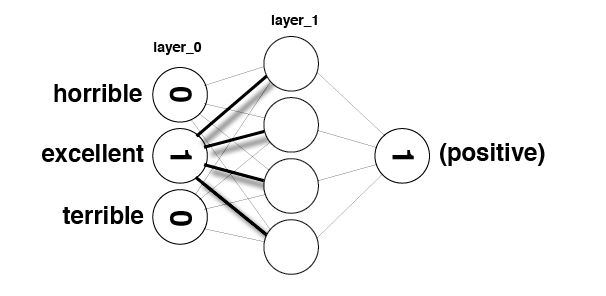

In [82]:
Image(filename='sentiment_network_sparse.png')

In [83]:
def get_most_similar_words(focus = "horrible"):
    most_similar = Counter()

    for word in mlp_full.word2index.keys():
        most_similar[word] = np.dot(mlp_full.weights_0_1[mlp_full.word2index[word]],mlp_full.weights_0_1[mlp_full.word2index[focus]])
    
    return most_similar.most_common()

In [84]:
get_most_similar_words("excellent")

[('excellent', 0.13672950757352473),
 ('perfect', 0.12548286087225946),
 ('amazing', 0.091827633925999699),
 ('today', 0.090223662694414217),
 ('wonderful', 0.089355976962214589),
 ('fun', 0.087504466674206832),
 ('great', 0.087141758882292045),
 ('best', 0.085810885617880653),
 ('liked', 0.077697629123843454),
 ('definitely', 0.076628781406966023),
 ('brilliant', 0.073423858769279052),
 ('loved', 0.073285428928122134),
 ('favorite', 0.072781136036160765),
 ('superb', 0.071736207178505082),
 ('fantastic', 0.070922191916266225),
 ('job', 0.069160617207634043),
 ('incredible', 0.066424077952614444),
 ('enjoyable', 0.065632560502888806),
 ('rare', 0.064819212662615075),
 ('highly', 0.063889453350970529),
 ('enjoyed', 0.062127546101812939),
 ('wonderfully', 0.062055178604090176),
 ('perfectly', 0.06109320881188738),
 ('fascinating', 0.060663547937493865),
 ('bit', 0.059655427045653062),
 ('gem', 0.0595108592961568),
 ('outstanding', 0.058860808147083006),
 ('beautiful', 0.05861393470316205

In [85]:
get_most_similar_words("terrible")

[('worst', 0.16966107259049845),
 ('awful', 0.12026847019691245),
 ('waste', 0.11945367265311004),
 ('poor', 0.09275888757443547),
 ('terrible', 0.091425387197727942),
 ('dull', 0.084209271678223604),
 ('poorly', 0.081241544516042014),
 ('disappointment', 0.080064759621368733),
 ('fails', 0.078599773723337513),
 ('disappointing', 0.077339485480323364),
 ('boring', 0.077127858748012881),
 ('unfortunately', 0.075502449705859051),
 ('worse', 0.070601835364194634),
 ('mess', 0.070564299623590399),
 ('stupid', 0.069484822832543022),
 ('badly', 0.066888903666228572),
 ('annoying', 0.065687021903374151),
 ('bad', 0.063093814537572138),
 ('save', 0.062880597495865748),
 ('disappointed', 0.06269235381207286),
 ('wasted', 0.061387183028051295),
 ('supposed', 0.060985452957725159),
 ('horrible', 0.060121772339380118),
 ('laughable', 0.05869840628546763),
 ('crap', 0.058104528667884577),
 ('basically', 0.057218840369636162),
 ('nothing', 0.057158220043034204),
 ('ridiculous', 0.056905481068931438)

In [86]:
import matplotlib.colors as colors

words_to_visualize = list()
for word, ratio in pos_neg_ratios.most_common(500):
    if(word in mlp_full.word2index.keys()):
        words_to_visualize.append(word)
    
for word, ratio in list(reversed(pos_neg_ratios.most_common()))[0:500]:
    if(word in mlp_full.word2index.keys()):
        words_to_visualize.append(word)

In [87]:
pos = 0
neg = 0

colors_list = list()
vectors_list = list()
for word in words_to_visualize:
    if word in pos_neg_ratios.keys():
        vectors_list.append(mlp_full.weights_0_1[mlp_full.word2index[word]])
        if(pos_neg_ratios[word] > 0):
            pos+=1
            colors_list.append("#00ff00")
        else:
            neg+=1
            colors_list.append("#000000")

In [ ]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=0)
words_top_ted_tsne = tsne.fit_transform(vectors_list)

In [ ]:
p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="vector T-SNE for most polarized words")

source = ColumnDataSource(data=dict(x1=words_top_ted_tsne[:,0],
                                    x2=words_top_ted_tsne[:,1],
                                    names=words_to_visualize,
                                    color=colors_list))

p.scatter(x="x1", y="x2", size=8, source=source, fill_color="color")

word_labels = LabelSet(x="x1", y="x2", text="names", y_offset=6,
                  text_font_size="8pt", text_color="#555555",
                  source=source, text_align='center')
p.add_layout(word_labels)

show(p)

# green indicates positive words, black indicates negative words